# Event similarity and event boundary-middle match analyses
**Contributors: James Antony**  

## Goals of this script: 
1. Examine across-event neural patterns relationships and their fit to various models, including causal networks (Fig 3)
2. Run boundary-middle match analyses to probe reactivation at event boundaries (Fig 4)
2. Plot pattern change across event boundaries by storyline change vs not (Fig 5F)

## Inputs
1. Event info + event attributes
2. fMRI data from ROIs/parcel
 
## Outputs
1. Data prepared for SRM script before running GSBS analyses

In [124]:
subs=['01','02','03','04','05','06','07','08','09','10','11','12',
      '13','14','15','16','19','20','21','23','24','25','26']
nS=len(subs)
print('nS =',nS)
ROIs = ['V1','vmPFC','precun','ang','PMC','A1','HC','postHC','antHC'] 
nROIs=len(ROIs)
nR=nROIs+0
n_trunc=0 # # volumes to truncate
hrshiftval=2 # TRs to shift for HRF, 2 s TRd
fwhmval=2
print('Current subjects: %s' %subs)
all_task_names = ['view']

nS = 23
Current subjects: ['01', '02', '03', '04', '05', '06', '07', '08', '09', '10', '11', '12', '13', '14', '15', '16', '19', '20', '21', '23', '24', '25', '26']


In [125]:
#load packages
#!pip install scipy
#!pip install pyodbc

import os 
import sys 
import math
import glob
import time
import copy
import scipy
import pickle
import os.path
import datetime
import warnings 
import scipy.io
import openpyxl
import matplotlib
import numpy as np
import pandas as pd 
from os import path
import numpy.ma as ma
import seaborn as sns 
import nibabel as nib
from scipy import stats
from io import StringIO
from nilearn import image
from copy import deepcopy
from nilearn import surface
from nilearn import datasets
from nilearn import plotting
import matplotlib.pyplot as plt
from sklearn import decomposition
import plotly.graph_objects as go
import matplotlib.patheffects as pe
import matplotlib.patches as patches
from sklearn.decomposition import PCA
from sklearn.manifold import MDS, TSNE
from nilearn.masking import apply_mask
from mpl_toolkits.mplot3d import Axes3D
from nilearn.image import resample_to_img
from scipy.signal import gaussian, convolve
from nilearn.masking import intersect_masks
from nilearn.masking import compute_epi_mask
from scipy.stats import norm, zscore, pearsonr
from numpy.polynomial.polynomial import polyfit
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import LogisticRegression
from statsmodels.stats.multitest import fdrcorrection
from sklearn.model_selection import LeaveOneOut, KFold
from mpl_toolkits.axes_grid1 import make_axes_locatable
from nilearn.plotting import plot_roi, plot_glass_brain
from scipy.stats import ttest_ind, ttest_rel, ttest_1samp
from nilearn.maskers import NiftiMasker, NiftiLabelsMasker
if not sys.warnoptions:
    warnings.simplefilter("ignore")

cfs=24 #defaults
plt.rcParams.update({'font.size': cfs})
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42
cm,cm2,fs0,fs1,fs2='gray','viridis',13,10,6 #colormap styles and fig sizes
figf="figs/"

%autosave 5
%matplotlib inline
sns.set(style = 'white', context='talk', font_scale=1, rc={"lines.linewidth": 2})

Autosaving every 5 seconds


In [126]:
#preset variables
from fr_utils import fr_dir, fr_bids_dir, fr_TR, fr_hrf_lag, run_names
from fr_utils import load_fr_epi_data, load_fr_mask, mask_data, load_data
results_path=fr_bids_dir+'derivatives/secondlevel/'
firstlevel_dir=fr_bids_dir+'derivatives/firstlevel/'
analysis_dir=fr_dir+'analysis/'
roi_dir=fr_dir+'bids/RangaL/RangaL_Antony/rois/'
ses='ses-01'
dir_out = results_path + 'states/'

fn=analysis_dir+'lum_mot_all.mat'
mat_contents = scipy.io.loadmat(fn)
mot_tc = mat_contents['mot_tr']
mot_tc_thr = mat_contents['mot_tr_thr']
print(mot_tc.shape)
mot_tc=np.vstack([mot_tc,np.zeros((3,1))])
mot_tc_thr=np.vstack([mot_tc_thr,np.zeros((3,1))])
fn=analysis_dir+'upperAud_tr.mat'
mat_contents = scipy.io.loadmat(fn)
aud_tc = mat_contents['upper_tr']
aud_tc=np.vstack([aud_tc,np.zeros((3,1))])

if not os.path.exists(dir_out): #create directory if it doesn't exist
    os.makedirs(dir_out)
print('ROI dir: %s' %roi_dir)
print('visual motion timecourse shape: %s, %s' %(mot_tc.shape))
print('auditory envelope timecourse shape: %s, %s' %(aud_tc.shape))

(1260, 1)
ROI dir: /Users/jamesantony/Desktop/friends_fmri/data/bids/RangaL/RangaL_Antony/rois/
visual motion timecourse shape: 1263, 1
auditory envelope timecourse shape: 1263, 1


In [127]:
#functions
def findsecs(tstring): #find absolute # of seconds, based on HMS input
    date_time = datetime.datetime.strptime(tstring, "%H:%M:%S")
    a_timedelta = date_time - datetime.datetime(1900, 1, 1)
    seconds = a_timedelta.total_seconds()
    return seconds

def implot(v,dat,xl,yl,add,fs1,fs2): #standard imshow plot
    f, ax = plt.subplots(1,1, figsize = (fs1,fs2))
    im=ax.imshow(dat.T,interpolation='none',cmap=cm,aspect='auto')
    ax.set_xlabel(xl) 
    ax.set_ylabel(yl) 
    ax.set_yticks(np.arange(len(v)))
    ax.set_yticklabels(v)
    f.tight_layout()
    fn=figf + yl + add + ".pdf"
    #plt.savefig(fn, transparent=True)
    
def histplot(lags,bins,xl,yl,fnx,tn):
    f, ax = plt.subplots(1,1,figsize = (fs1/2,fs2/2))
    ax.hist(lags,bins)
    ax.set_xlabel(xl)
    ax.set_ylabel(yl)
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    f.tight_layout()
    fn=figf+"time_"+fnx+".pdf"
    #plt.savefig(fn, transparent=True)
    ax.set_title(tn)

df = pd.read_excel('/Users/jamesantony/Desktop/friends_fmri/data/behavioral/friendsStoryBoard.xlsx','FriendsNarrComb') #read in
df['Secs']="" #pre-assign empty secs column
opening=0 #opening length (in s)
firstepl=1356 #first ep length
for i in range(df.shape[0]):
    if len(str(df['Time'][i]))>17:
        z=str(df['Time'][i])
        df['Secs'][i]=findsecs(z[11:])
    else:
        df['Secs'][i]=findsecs(str(df['Time'][i]))
df['Secs']=df['Secs']-opening
cols = df.columns.tolist()
cols = cols[-1:] + cols[:-1]
df = df[cols]
tsecs=int(df['Secs'][df.shape[0]-1]) #total seconds
df

,Secs,Episode,EventModelNum,TimeOrig,Time,Character1,Character2,Character3,Character4,Character5,...,Place,Explanation,SceneNum,EventModel1,EMchangeWSTchange,Notes,Unnamed: 17,Unnamed: 18,Unnamed: 19,Unnamed: 20
0,0.0,1,1.0,1900-01-01 00:00:00,1900-01-01 00:00:00,Joey,Chandler,Ursula,NaN,NaN,...,Riffs restaurant,Joey and Chandler see a waitress and think it'...,1.0,Phoebe/Ursula/Joey,NaN,NaN,NaN,NaN,Event models,NaN
1,38.0,1,2.0,1900-01-01 00:01:25,1900-01-01 00:00:38,Ross,Monica,Rachel,Phoebe,NaN,...,Central Perk,"In the coffeeshop, Ross complains about monkey...",2.0,Marcel/SAP,1.0,NaN,NaN,NaN,Marcel/SAP,MSAP
2,66.0,1,3.0,1900-01-01 00:01:58,1900-01-01 00:01:06,Ross,Monica,Rachel,Phoebe,Joey,...,Central Perk,Joey and Chandler see Phoebe from outside the ...,2.0,Phoebe/Ursula/Joey,NaN,NaN,NaN,NaN,Phoebe/Ursula/Joey,JPU
3,147.0,1,4.0,1900-01-01 00:03:17,1900-01-01 00:02:27,Ross,Monica,Rachel,Phoebe,Joey,...,Central Perk,Ross mentions that he needs to leave for Lamaz...,2.0,Ross parenting,NaN,NaN,NaN,NaN,Ross parenting,RP
4,178.0,1,5.0,1900-01-01 00:03:50,1900-01-01 00:02:58,Ross,Carol,Susan,Coach,NaN,...,Lamaze class,"In Lamaze class, Ross, Carol, and Susan awkwar...",3.0,Ross parenting,0.0,"EM stay, scene change after edit",NaN,NaN,Chandler/Nina/boss,CNB
5,244.0,1,6.0,1900-01-01 00:05:01,1900-01-01 00:04:04,Chandler,Nina,NaN,NaN,NaN,...,Chandler's office,Chandler invites Nina into his office and they...,4.0,Chandler/Nina/boss,1.0,NaN,NaN,NaN,Rachel/Monica,Neighbor/lights/ankle/insurance/date/hospital2
6,291.0,1,7.0,1900-01-01 00:05:52,1900-01-01 00:04:51,Chandler,Rachel,Monica,Ross,Phoebe,...,Monica's apartment,"Chandler tells friends that Nina is very cute,...",5.0,Chandler/Nina/boss,0.0,"EM stay, scene change after edit",NaN,NaN,NaN,NaN
7,303.0,1,8.0,1900-01-01 00:06:08,1900-01-01 00:05:03,Chandler,Rachel,Monica,Ross,Phoebe,...,Monica's apartment,Marcel (Ross's monkey) steals the TV remote an...,5.0,Marcel/SAP,NaN,NaN,NaN,NaN,NaN,NaN
8,341.0,1,9.0,1900-01-01 00:06:45,1900-01-01 00:05:41,Chandler,Rachel,Monica,Ross,Phoebe,...,Monica's apartment,Rachel and Monica reveal that they still have ...,5.0,Rachel/Monica,NaN,NaN,NaN,NaN,NaN,NaN
9,363.0,1,10.0,1900-01-01 00:07:09,1900-01-01 00:06:03,Chandler,Rachel,Monica,Ross,Phoebe,...,Monica's apartment,Joey says he thinks Ursula likes him. Chandler...,5.0,Phoebe/Ursula/Joey,NaN,NaN,NaN,NaN,NaN,NaN


[ 1.  0.  0.  1.  1.  1.  0.  0.  0.  0.  1.  1.  1.  1.  0.  1.  0.  0.
  0.  1.  1.  1.  0.  1.  1.  0.  0.  1.  1.  1.  1.  0.  1.  1.  0.  1.
  1.  0.  1.  0.  0.  0.  1.  1.  1.  0.  1.  0.  1.  1.  0. nan]
[ 0  3  4  5 10 11 12 13 15 19 20 21 23 24 27 28 29 30 32 33 35 36 38 42
 43 44 46 48 49]
All changes (in TR): [  19   33   73   89  122  145  151  170  181  215  219  262  281  299
  310  344  347  368  383  414  450  484  499  515  540  548  556  602
  613  630  685  725  751  769  789  825  880  883  997 1003 1010 1029
 1045 1101 1118 1128 1140 1155 1159 1229 1242 1257]
All scene changes (in TR): [  19   89  122  145  219  262  281  299  344  414  450  484  515  540
  602  613  630  685  751  769  825  880  997 1045 1101 1118 1140 1159
 1229]
length of timecourse: 1263


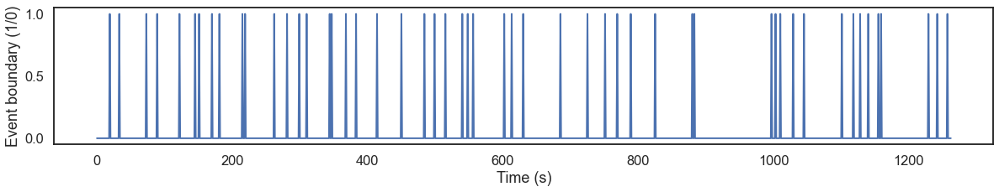

In [128]:
## ignore the warnings below for now
endbuff_tr=6
ttrs=int(np.floor(tsecs/fr_TR)+endbuff_tr) #total TRs
#qq=df['Secs'][:-1] #find times of possession changes #ignore first time point b/c not boundary!
qq=df['Secs'] #find times of possession changes #include last boundary as of 1/20/25
all_edges=qq[1:].to_numpy()
#qqq=np.diff(df['SceneNum'][:-1])
qqq=np.diff(df['SceneNum']) #1/20/25 change
print(qqq)
ix=np.where(qqq==1)[0]
print(ix)
all_edges_st=qq[ix+1].to_numpy()
all_edges_tr=all_edges//fr_TR
all_edges_st_tr=all_edges_st//fr_TR
all_edges_tr,all_edges_st_tr=all_edges_tr.astype(int),all_edges_st_tr.astype(int)
print('All changes (in TR): %s' %all_edges_tr)
print('All scene changes (in TR): %s' %all_edges_st_tr)

all_edges_tc_tr,all_edges_st_tc_tr=np.zeros((ttrs)),np.zeros((ttrs))
all_edges_tc_tr[all_edges_tr]=1
all_edges_st_tc_tr[all_edges_st_tr]=1
f, ax = plt.subplots(1,1,figsize = (fs1*2,fs2/2)) #for instance
ax.plot(all_edges_tc_tr)
ax.set_xlabel('Time (s)')
ax.set_ylabel('Event boundary (1/0)')
print('length of timecourse: %s' %all_edges_tc_tr.shape)

sn='pydata/all_edges.npy'
np.save(sn,all_edges)
sn='pydata/all_edges_tr.npy'
np.save(sn,all_edges_tr)

Characters: ['Boss', 'Carol', 'Chandler', 'Coach', 'Doctor1', 'Doctor2', 'Joey', 'Marcel', 'Monica', 'Mr. Hickles', 'Nina', 'Phoebe', 'Rachel', 'Receptionist', 'Ross', 'RossFather', 'Susan', 'Ursula', 'Woman1', 'Woman2'], total #: 20
Storyline: ['Chandler/Nina/boss', 'Marcel/SAP', 'Phoebe/Ursula/Joey', 'Rachel/Monica', 'Ross parenting'], total #: 5
Places: ['Central Perk', "Chandler's office", 'Hallway', 'Hospital lounge', 'Hospital room', 'Lamaze class', "Monica's apartment", 'Riffs restaurant', 'Rooftop', 'Some Restaurant'], total #: 10


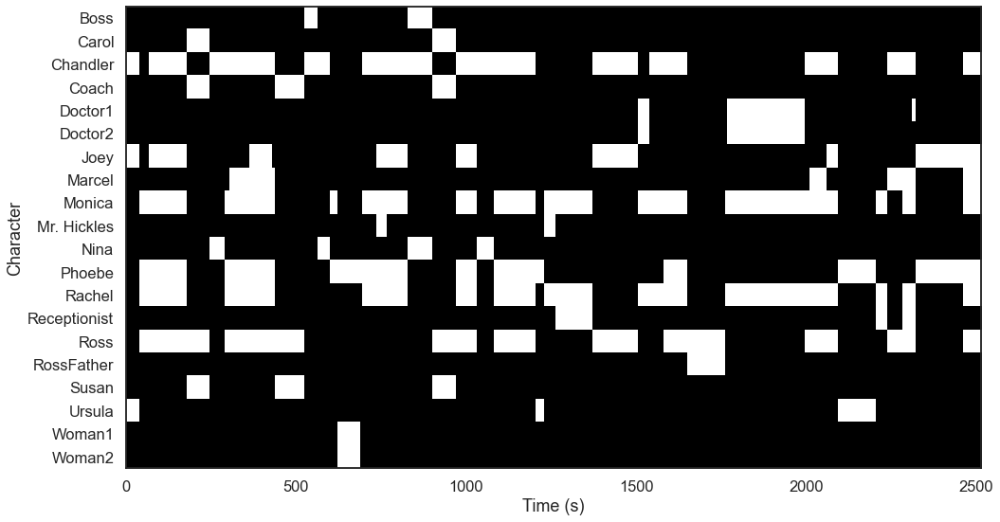

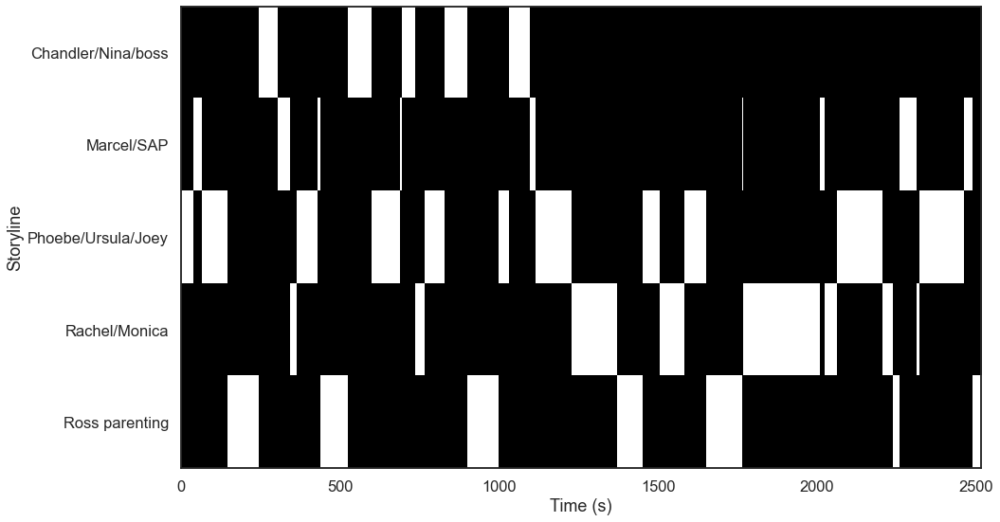

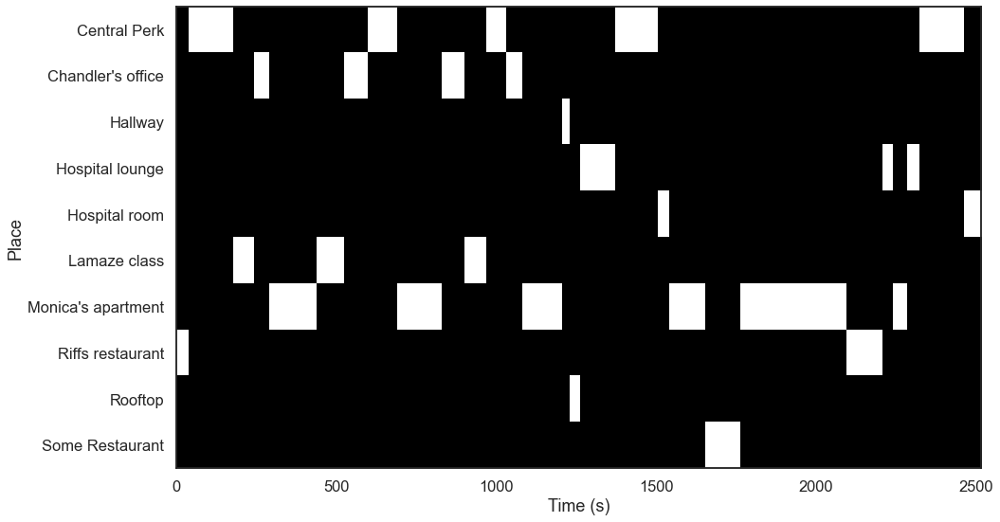

In [129]:
#character list
a,b,c=list(set(df['Character1'])),list(set(df['Character2'])),list(set(df['Character3']))
d,e,f=list(set(df['Character4'])),list(set(df['Character5'])),list(set(df['Character6']))
g=list(set(df['Character7']))
chars=set(a+b+c+d+e+f+g) #combine
chars = [x for x in chars if str(x) != 'nan']
chars.remove('[end credits 2]')
chars.sort()
print('Characters: %s, total #: %s' %(chars,len(chars)))
#event model list
a=list(set(df['EventModel1']))
ems=set(a)
ems = [x for x in ems if str(x) != 'nan']
ems.sort()
print('Storyline: %s, total #: %s' %(ems,len(ems)))
#place list
places=list(set(df['Place']))
places = [x for x in places if str(x) != 'nan']
places.sort()
print('Places: %s, total #: %s' %(places,len(places)))

cmat,emat,pmat=np.zeros((tsecs,len(chars))),np.zeros((tsecs,len(ems))),np.zeros((tsecs,len(places)))
for i in range(df.shape[0]-1): #up to last moment
    fsec=int(df['Secs'][i]) #first second in the event
    lsec=int(df['Secs'][i+1]) #last second in the event
    for ii,c in enumerate(chars):
        if df['Character1'][i]==chars[ii]:
            cmat[fsec:lsec,ii]=1
        if df['Character2'][i]==chars[ii]:
            cmat[fsec:lsec,ii]=1
        if df['Character3'][i]==chars[ii]:
            cmat[fsec:lsec,ii]=1
        if df['Character4'][i]==chars[ii]:
            cmat[fsec:lsec,ii]=1
        if df['Character5'][i]==chars[ii]:
            cmat[fsec:lsec,ii]=1
        if df['Character6'][i]==chars[ii]:
            cmat[fsec:lsec,ii]=1
        if df['Character7'][i]==chars[ii]:
            cmat[fsec:lsec,ii]=1
    for ii,l in enumerate(ems):
        if df['EventModel1'][i]==ems[ii]:
            emat[fsec:lsec,ii]=1
    for ii,l in enumerate(places):
        if df['Place'][i]==places[ii]:
            pmat[fsec:lsec,ii]=1

implot(chars,cmat,'Time (s)','Character','',15,8) #plot each attribute over time
implot(ems,emat,'Time (s)','Storyline','',15,8)
implot(places,pmat,'Time (s)','Place','',15,8)

#find event order - do it this way b/c otherwise ST changes w/o EM changes are not read in!
e_o=np.zeros((df.shape[0]-1,2))
for i in range(df.shape[0]-1):
    currsec=int(df['Secs'][i])
    qq=np.where(emat[currsec,:]==1)[0] #f
    e_o[i,0],e_o[i,1]=currsec,qq

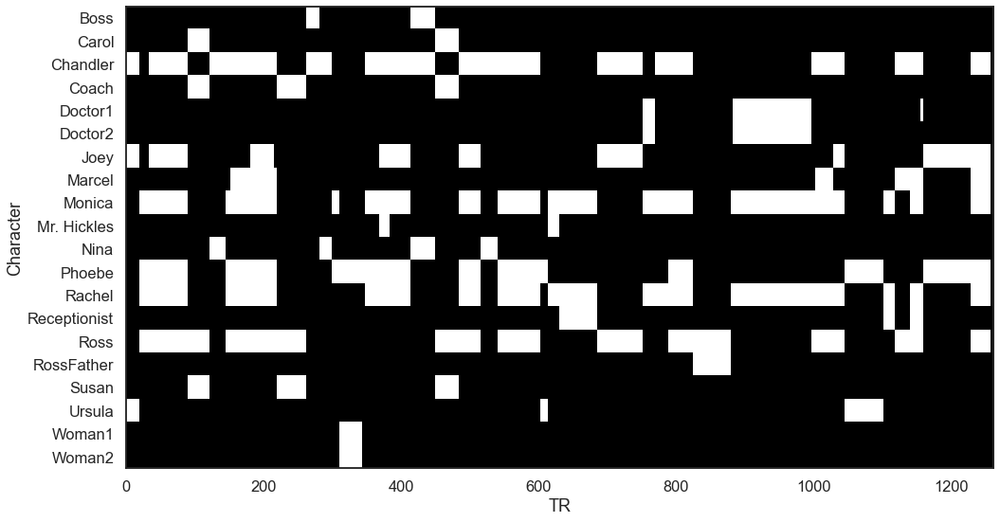

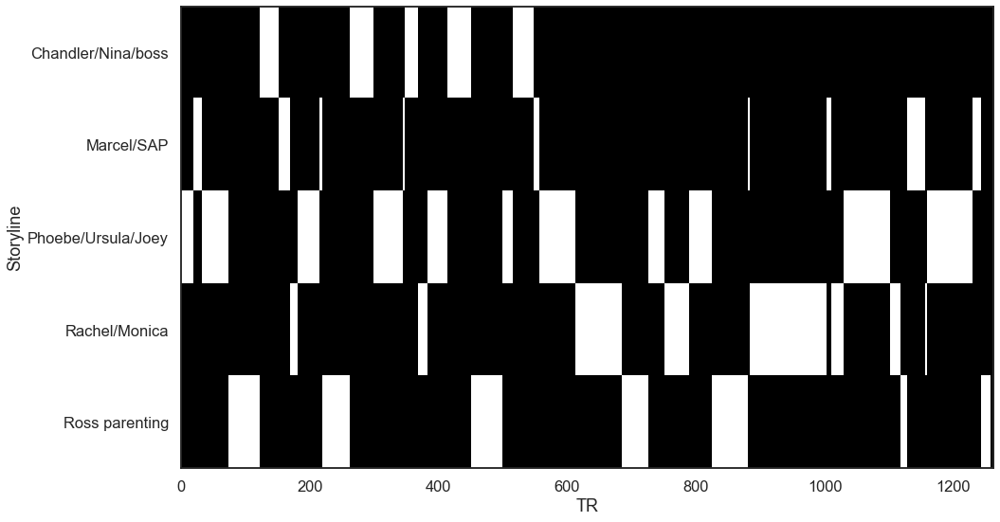

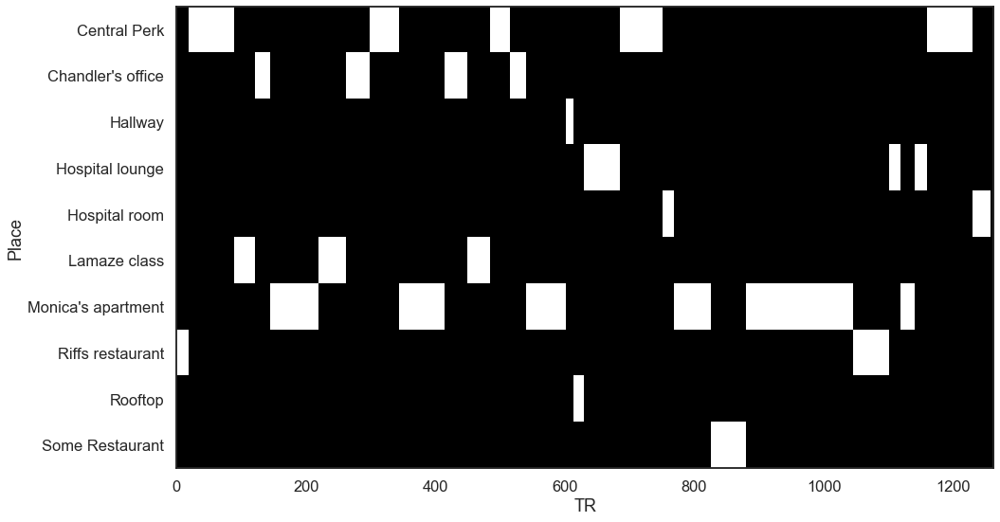

In [130]:
#put in "TR space"
cmat_tr,emat_tr,pmat_tr=np.zeros((ttrs,len(chars))),np.zeros((ttrs,len(ems))),np.zeros((ttrs,len(places)))
for i in range(df.shape[0]-1): #up to last moment
    ftr=int(np.floor(df['Secs'][i])/fr_TR) #first TR in the event
    ltr=int(np.floor(df['Secs'][i+1])/fr_TR) #last TR in the event
    for ii,c in enumerate(chars):
        if df['Character1'][i]==chars[ii]:
            cmat_tr[ftr:ltr,ii]=1
        if df['Character2'][i]==chars[ii]:
            cmat_tr[ftr:ltr,ii]=1
        if df['Character3'][i]==chars[ii]:
            cmat_tr[ftr:ltr,ii]=1
        if df['Character4'][i]==chars[ii]:
            cmat_tr[ftr:ltr,ii]=1
        if df['Character5'][i]==chars[ii]:
            cmat_tr[ftr:ltr,ii]=1
        if df['Character6'][i]==chars[ii]:
            cmat_tr[ftr:ltr,ii]=1
        if df['Character7'][i]==chars[ii]:
            cmat_tr[ftr:ltr,ii]=1
    for ii,l in enumerate(ems):
        if df['EventModel1'][i]==ems[ii]:
            emat_tr[ftr:ltr,ii]=1
    for ii,l in enumerate(places):
        if df['Place'][i]==places[ii]:
            pmat_tr[ftr:ltr,ii]=1

implot(chars,cmat_tr,'TR','Character','',15,8) #plot each attribute over time
implot(ems,emat_tr,'TR','Storyline','',15,8)
implot(places,pmat_tr,'TR','Place','',15,8)

e_id_tr=np.zeros((emat_tr.shape[0])) #ID for every TR - event model
for i in range(emat_tr.shape[0]):
    qq=np.where(emat_tr[i,:]==1)[0]
    if len(qq)>0:
        e_id_tr[i]=qq
p_id_tr=np.zeros((pmat_tr.shape[0])) #ID for every TR - places
for i in range(pmat_tr.shape[0]):
    qq=np.where(pmat_tr[i,:]==1)[0]
    if len(qq)>0:
        p_id_tr[i]=qq
sn='view-e_id_tr.npy'
np.save(sn,e_id_tr)
sn='view-p_id_tr.npy'
np.save(sn,p_id_tr)

#save main df
df.to_csv('pydata/view-main_df.csv')

All changes (in TR): [  19   33   73   89  122  145  151  170  181  215  219  262  281  299
  310  344  347  368  383  414  450  484  499  515  540  548  556  602
  613  630  685  725  751  769  789  825  880  883  997 1003 1010 1029
 1045 1101 1118 1128 1140 1155 1159 1229 1242 1257]
# changes: 52
All scene changes (in TR): [  19   89  122  145  219  262  281  299  344  414  450  484  515  540
  602  613  630  685  751  769  825  880  997 1045 1101 1118 1140 1159
 1229]
# scene changes: 29
All character changes occur at: [  19   33   89  122  145  151  181  219  262  281  299  310  347  368
  414  450  484  515  540  602  613  630  685  751  769  789  825  880
  883  997 1003 1029 1045 1101 1118 1140 1155 1159 1229]
# character changes: 39
All event model changes occur at: [  19   33   73  122  151  170  181  215  219  262  299  344  347  368
  383  414  450  499  515  548  556  613  685  725  751  789  825  880
  883 1003 1010 1029 1101 1118 1128 1155 1159 1229 1242]
# event model ch

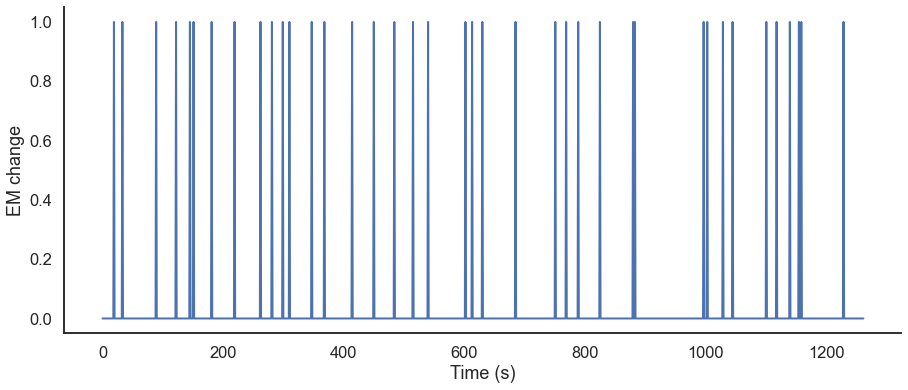

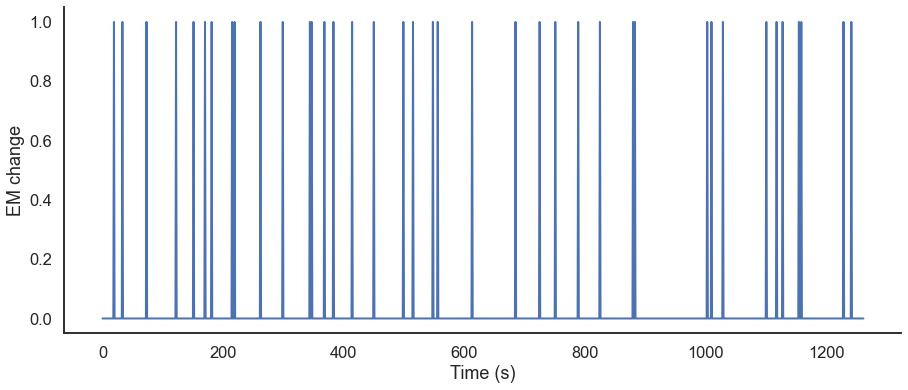

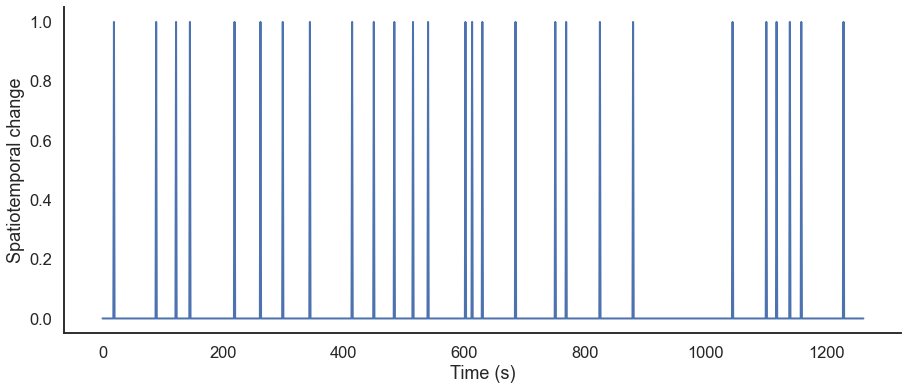

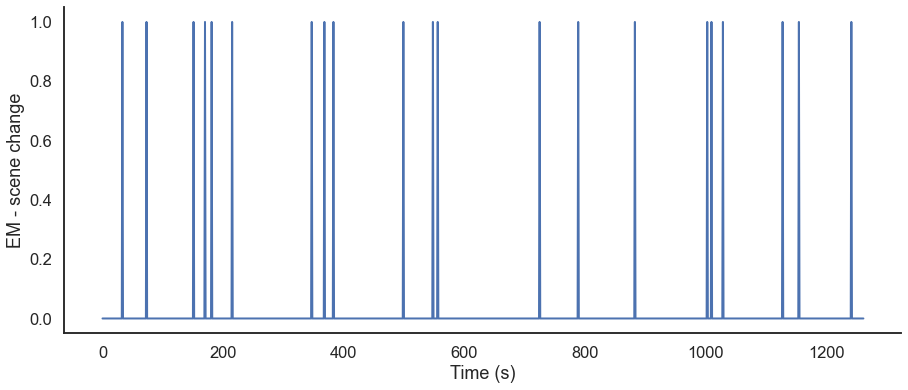

In [131]:
#plot different event markers!
n_ev=len(all_edges_tr)
print('All changes (in TR): %s' %all_edges_tr)
print('# changes: %s' %(n_ev))
print('All scene changes (in TR): %s' %all_edges_st_tr)
print('# scene changes: %s' %(len(all_edges_st_tr)))

#is there a change in characters?
cmdmat_all,j=np.zeros((ttrs,cmat_tr.shape[1])),0
for i in range(cmat_tr.shape[1]):
    cmdmat_all[1:,i]=np.diff(cmat_tr[:,i])
all_edges_cmd_tr=np.max(cmdmat_all,axis=1)
f, ax = plt.subplots(1,1, figsize = (fs1*1.5,fs2))
ax.plot(all_edges_cmd_tr)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)            
ax.set_xlabel('Time (s)') 
ax.set_ylabel('EM change') 
qq=np.where(np.diff(all_edges_cmd_tr)==1)
print('All character changes occur at: %s' %(qq[0]+1))
print('# character changes: %s' %(len(qq[0])))

#is there a change in the event model?
emdmat_all,j=np.zeros((ttrs,emat_tr.shape[1])),0
for i in range(emat_tr.shape[1]):
    emdmat_all[1:,i]=np.diff(emat_tr[:,i])
all_edges_em_tr=np.max(emdmat_all,axis=1)
f, ax = plt.subplots(1,1, figsize = (fs1*1.5,fs2))
ax.plot(all_edges_em_tr)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)            
ax.set_xlabel('Time (s)') 
ax.set_ylabel('EM change') 
qq=np.where(np.diff(all_edges_em_tr)==1)
print('All event model changes occur at: %s' %(qq[0]+1))
print('# event model changes: %s' %(len(qq[0])))

#is there a change in the location (differs slightly from spatiotemporal, since sometimes jump in time w/o space)
stdmat_all=np.zeros((ttrs,pmat_tr.shape[1]))
for i in range(pmat_tr.shape[1]):
    stdmat_all[1:,i]=np.diff(pmat_tr[:,i])#
all_edges_sp_tr=np.max(stdmat_all,axis=1)
f, ax = plt.subplots(1,1, figsize = (fs1*1.5,fs2))
ax.plot(all_edges_sp_tr)
ax.set_xlabel('Time (s)') 
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)            
ax.set_ylabel('Spatiotemporal change')
qq=np.where(np.diff(all_edges_sp_tr)==1)
print('Spatial changes occur at: %s' %(qq[0]+1))
print('# spatial changes: %s' %(len(qq[0])))

#is there a change ONLY in the event model and NOT in the location?
f, ax = plt.subplots(1,1, figsize = (fs1*1.5,fs2))
all_edges_emo_tr=all_edges_em_tr-all_edges_sp_tr #event model change only
all_edges_emo_tr[np.where(all_edges_emo_tr<0)[0]]=0 #zero out negative stdmat
ax.plot(all_edges_emo_tr)
ax.set_xlabel('Time (s)') 
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)            
ax.set_ylabel('EM - scene change')
qq=np.where(all_edges_emo_tr==1)
print('Event model (only) changes occur at: %s' %qq[0])
print('# EMO changes: %s' %(len(qq[0])))

rearranged boundaries: [156. 254. 700. 996.]
rearranged fine boundaries: [  28   65   86  122  169  188  192  195  203  206  213  240  272  312
  346  391  422  438  495  521  557  629  710  725  797  835  955  974
  991 1044 1087 1136 1176 1231 1241]
# rearranged fine boundaries: 35


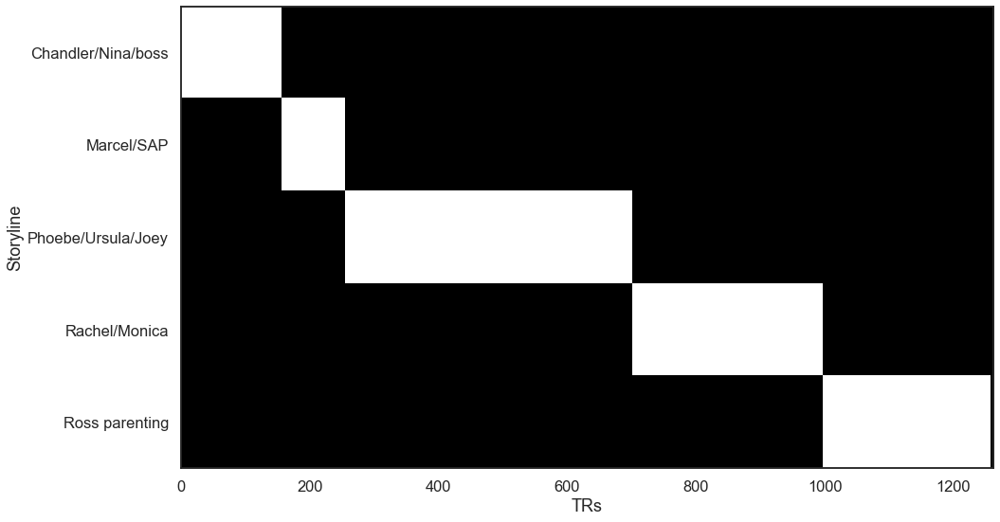

In [132]:
emat_re_tr,emat_re_tr_bounds,emat_re_tr_bounds_fine=np.zeros((ttrs,len(ems))),np.zeros((len(ems)-1)),[]
tot,qqdtot=0,0
for i in range(len(ems)):
    qq=np.where(emat_tr[:,i]==1)[0]
    emat_re_tr[tot:tot+len(qq),i]=1
    qqdiff=np.where(np.diff(qq)>1)[0] #previous way -- unable to detect when ST changed w/o EM change
    for j in range(len(qqdiff)):
        if qqdtot==0:
            emat_re_tr_bounds_fine=tot+qqdiff[j]
            qqdtot=1
        else:
            emat_re_tr_bounds_fine=np.hstack([emat_re_tr_bounds_fine,tot+qqdiff[j]])
    tot+=len(qq)
    if i<len(ems)-1:
        emat_re_tr_bounds[i]=tot
    
implot(ems,emat_re_tr,'TRs','Storyline','_blocked',15,8)
print('rearranged boundaries: %s' %emat_re_tr_bounds)
print('rearranged fine boundaries: %s' %emat_re_tr_bounds_fine)
print('# rearranged fine boundaries: %s' %len(emat_re_tr_bounds_fine))

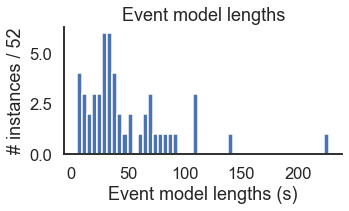

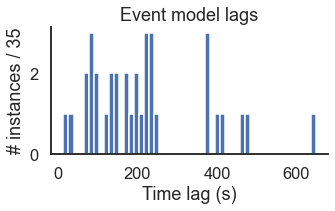

In [133]:
#plot distribution of event model lengths & time lags between same event model
emls=np.diff(df['Secs'])
bins,yl=50,'# instances / %s' %len(emls)
histplot(emls,bins,'Event model lengths (s)',yl,"hist_EM_lengths",'Event model lengths')
moi,lags,lag_ind_t,lag_ind_l,j=emat+0,[],[],[],0 #matrix of interest
for h in range(moi.shape[1]): #go through all event models
    fir,aa=1,np.diff(moi[:,h])
    for i in range(moi.shape[0]-1):
        if aa[i]==-1: # offset
            fir,offt=0,i
        if aa[i]==1: # onset
            if fir==0: #if not 1st appearance
                lag_ind_t,lag_ind_l=np.hstack([lag_ind_t,i+1]),np.hstack([lag_ind_l,i-offt])
                j+=1
                lags=np.hstack([lags,i-offt])

bins,yl=50,'# instances / %s' %len(lags)
histplot(lags,bins,'Time lag (s)',yl,"hist_EM",'Event model lags') #plot against time
lag_ind=np.vstack([lag_ind_t,lag_ind_l]).T
#histplot(np.log(lags),bins,'Log (time lag (s))',yl,"loghist") #plot against log time

# Load fMRI data

In [134]:
#functions
#function for similarity matrix
def fishr2z2d(dat,dat2):
    if len(dat2)==0:
        rs=np.corrcoef(dat)
        for m in range(rs.shape[0]): #r-to-z transform
            for n in range(rs.shape[0]):
                rs[m,n]=np.multiply((np.log([1+rs[m,n]])-np.log([1-rs[m,n]])),0.5)
                if m==n:
                    rs[m,n]=0 #blank out diagonal
    else:
        evs=dat.shape[0]
        rs=np.zeros((evs,evs))
        for v in range(evs):
            for vv in range(evs):
                fill=np.corrcoef(dat[v,:],dat2[vv,:])
                rs[v,vv]=fill[1,0]#first of new event, last of old one
        for m in range(rs.shape[0]): #r-to-z transform
            for n in range(rs.shape[0]):
                rs[m,n]=np.multiply((np.log([1+rs[m,n]])-np.log([1-rs[m,n]])),0.5)
    return rs

#function for running mean
def running_mean(x, N,shift):
    rm=np.zeros((x.shape[0]))
    for i in range(0,len(x)):
        if i<N+shift:
            rm[i]=np.mean(x[0:(i+N)+shift+1])
        elif i>len(x)-1-N+shift:
            rm[i]=np.mean(x[(i-N)+shift:len(x)-1+1]) #only forwards
        else:
            rm[i]=np.mean(x[(i-N)+shift:(i+N)+shift+1]) #only forwards
    return rm

#simple violin plot
def vplot(true,dist,yl,rankd,sps,sp):
    tt='true percentile = %s' %rankd
    if sps>1:
        ax[sp].violinplot(dist, showextrema=False)
        ax[sp].scatter(1,true)
        ax[sp].xaxis.set_visible(False)
        ax[sp].set_ylabel(yl)
        ax[sp].set_title(tt)
    else:
        ax.violinplot(dist, showextrema=False)
        ax.scatter(1,true)
        ax.xaxis.set_visible(False)
        ax.set_ylabel(yl)
        ax.set_title(tt)

def boundresp(interv,respt,bounds,bold,lab,cin,splt):
    cmapz,ts=plt.get_cmap('viridis'),np.linspace(-interv+cin*0.1,interv+cin*0.1,interv*2+1)
    col_acc=70 #acceleration in col space
    pre1,pre2,post1,post2=respt[0],respt[1],respt[2],respt[3]
    b_locs=np.where(bounds==1)[0] 
    nbs=len(b_locs) # #boundaries
    tc,resp=np.zeros((nbs,interv*2+1)),np.zeros((nbs))
    resp_m,resp_l=[],[]
    for i in range(nbs):
        b_tr=b_locs[i] #boundary in TR space
        tc[i,:]=bold[b_tr-interv:b_tr+interv+1]-np.mean(bold[b_tr+pre1:b_tr+pre2+1]) #jwa 7/27/25 subtract baseline
        resp[i]=np.mean(bold[b_tr+post1:b_tr+post2+1])-np.mean(bold[b_tr+pre1:b_tr+pre2+1]) #inclusive of these ranges
        for j in range(lag_ind.shape[0]): #loop through lags
            if b_locs[i]==np.floor(lag_ind[j,0]/fr_TR): #times match
                resp_m,resp_l=np.hstack([resp_m,resp[i]]),np.hstack([resp_l,lag_ind[j,1]]) #store response and lag
    mtc,stc=np.mean(tc,axis=0),np.std(tc,axis=0)/np.sqrt(nbs)
    if splt:
        plt.errorbar(ts,mtc,stc,label=lab,color=cmapz(cin*col_acc),linewidth=4)
    resp_ind=np.vstack([resp_m,resp_l]).T
    return mtc,resp,resp_ind

def respv(resp,respt,yl,sp):
    ax[sp].violinplot(resp,showmeans=True,showmedians=False,showextrema=False)
    ax[sp].scatter(1,np.mean(resp))
    ax[sp].xaxis.set_visible(False)
    ax[sp].set_ylabel('%s offset response from %s to %s - %s %s' %(yl,respt[2],respt[3],respt[0],respt[1]))
def respv2(resp,respt,yl,splt):
    if splt:
        ax.violinplot(resp,showmeans=True,showmedians=False,showextrema=False)
        ax.scatter(1,np.mean(resp))
        ax.xaxis.set_visible(False)
        ax.set_ylabel('%s offset response from %s to %s - %s %s' %(yl,respt[2],respt[3],respt[0],respt[1]))
def boundresp_scatter(resp_lag,lab1,lab2,sp1,sp2):
    x,y=resp_lag[:,1],resp_lag[:,0]
    ax[sp1,sp2].scatter(x,y)
    ax[sp1,sp2].set_xlabel('Temporal lag between events (s)')
    ax[sp1,sp2].set_ylabel('%s response for %s changes' %(lab1,lab2))
    m,b = np.polyfit(x,y,1) #y=mx+b
    ax[sp1,sp2].plot(x, m*x + b)
    return m,b
def boundresp_scatter2(resp_lag,lab1,lab2,sp1,splt):
    x,y=resp_lag[:,1],resp_lag[:,0]
    m,b = np.polyfit(x,y,1) #y=mx+b
    if splt:
        ax[sp1].scatter(x,y)
        ax[sp1].set_xlabel('Temporal lag between events (s)')
        ax[sp1].set_ylabel('%s response for %s changes' %(lab1,lab2))
        ax[sp1].plot(x, m*x + b)
    return m,b

#plot 2-D matrices and predicted boundaries (true # of possessions) 
def plot_tt_similarity_matrix(ax,data_matrix,data_matrix2,bounds,sec_bounds,bounds_true,npts):
    if len(data_matrix2)>0:
        twodmat=fishr2z2d(data_matrix.T,data_matrix2.T)
    else:
        twodmat=fishr2z2d(data_matrix.T,[])
    im=ax.imshow(twodmat, cmap='viridis',vmin=-1,vmax=1)
    if data_matrix.shape[0]==(nbr*nbr-nbr)/2: #if parcel-based fc
        im=ax.imshow(twodmat, cmap='viridis')
    for axis in ['top','bottom','left','right']:
        ax.spines[axis].set_linewidth(lw9)
    # plot predicted boundaries 
    if len(bounds)>0:
        bounds_aug = np.concatenate(([0],bounds,[npts]))
        for i in range(len(bounds_aug)-1):
            rect = patches.Rectangle(
                (bounds_aug[i]-0.5,bounds_aug[i]-0.5),
                bounds_aug[i+1]-bounds_aug[i],
                bounds_aug[i+1]-bounds_aug[i],
                linewidth=lw9,edgecolor='w',facecolor='none')
            ax.add_patch(rect)
    if len(sec_bounds)>0:
        bounds_aug = np.concatenate(([0],sec_bounds,[npts]))
        for i in range(len(bounds_aug)-1):
            rect = patches.Rectangle(
                (bounds_aug[i],bounds_aug[i]),
                bounds_aug[i+1]-bounds_aug[i],
                bounds_aug[i+1]-bounds_aug[i],
                linewidth=lw9-1,edgecolor='y',facecolor='none')
            ax.add_patch(rect)
    if len(bounds_true)>0:
        bounds_aug = np.concatenate(([0],bounds_true,[npts]))
        for i in range(len(bounds_aug)-1):
            rect = patches.Rectangle(
                (bounds_aug[i],bounds_aug[i]),
                bounds_aug[i+1]-bounds_aug[i],
                bounds_aug[i+1]-bounds_aug[i],
                linewidth=lw9-2,edgecolor='r',facecolor='none')
            ax.add_patch(rect)
    return twodmat,im

#from mac shine: https://github.com/macshine/coupling/blob/master/coupling.py
def coupling(data,window): 
    """ creates a functional coupling metric from 'data'
        data: should be organized in 'time x nodes' matrix
        smooth: smoothing parameter for dynamic coupling score"""
    #define variables
    [tr,nodes] = data.shape
    der = tr-1
    td = np.zeros((der,nodes))
    td_std = np.zeros((der,nodes))
    data_std = np.zeros(nodes)
    mtd = np.zeros((der,nodes,nodes))
    #calculate temporal derivative
    for i in range(0,nodes):
        for t in range(0,der):
            td[t,i] = data[t+1,i] - data[t,i]
    #standardize data
    for i in range(0,nodes):
        data_std[i] = np.std(td[:,i])
    td_std = td / data_std
    #functional coupling score
    for t in range(0,der):
        for i in range(0,nodes):
            for j in range(0,nodes):
                mtd[t,i,j] = td_std[t,i] * td_std[t,j]
    #temporal smoothing
    #https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.rolling.html
    temp = pd.DataFrame(np.reshape(mtd,[der,nodes*nodes]))
    #sma = temp.rolling(window).mean() 
    sma = temp.rolling(window,center=True,min_periods=1).mean() #JWA change
    sma = np.reshape(sma.values,[der,nodes,nodes]) #JWA note: as_matrix() deprecated
    return (mtd, sma)

regions to combine: ['GM Inferior parietal lobule PGp', 'GM Inferior parietal lobule Pga']
# surviving voxels: 2121
figs/glass_ang.pdf


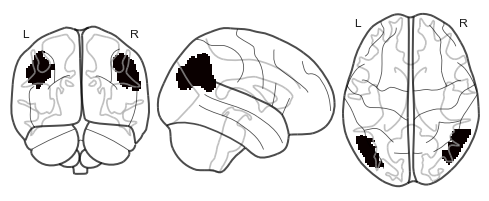

In [135]:
#plot out ROIs!
#plot angular gyrus
ds_ang=datasets.fetch_atlas_juelich('maxprob-thr50-2mm')
bROIs_ang=ds_ang.labels
i=np.eye(3)*2 #identity matrix to resample to 2 mm isometric voxels
ds_ang.maps=image.resample_img(ds_ang.maps, target_affine=i,interpolation='nearest') #resample
masker_ho=NiftiLabelsMasker(labels_img=ds_ang.maps) #parcel labels
index=masker_ho.labels_img.dataobj
nP=len(bROIs_ang)
print('regions to combine:',bROIs_ang[19:21])

ang_ind=np.logical_and(index>18,index<21) #grab PGp and PGa
ang_ind=ang_ind.astype(int)
qq=np.where(ang_ind>=0.1) #roi_mask.dataobj
print('# surviving voxels:',len(qq[0]))
for i in range(len(qq[0])):
    ds_ang.maps.dataobj[qq[0][i],qq[1][i],qq[2][i]]=1 #because resampling leads to non-binary #s
qq=np.where(ang_ind<0.1)
for i in range(len(qq[0])):
    ds_ang.maps.dataobj[qq[0][i],qq[1][i],qq[2][i]]=0 

#plot ROIs on glass brain
plot_glass_brain(ds_ang.maps)
fn=figf + "glass_ang.pdf"
print(fn)
plt.savefig(fn, transparent=True)

figs/glass_V1.pdf
figs/glass_vmPFC.pdf
figs/glass_PMC.pdf
figs/glass_postHC.pdf
figs/glass_antHC.pdf


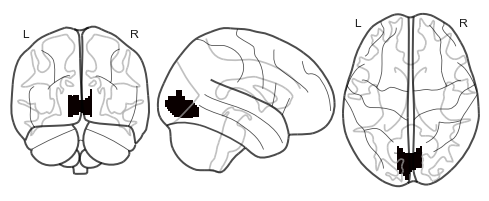

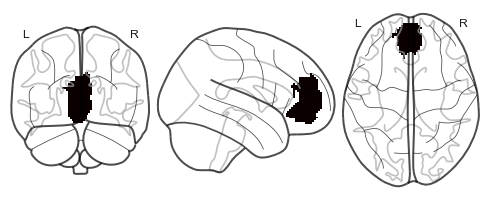

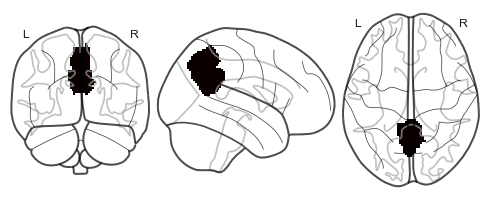

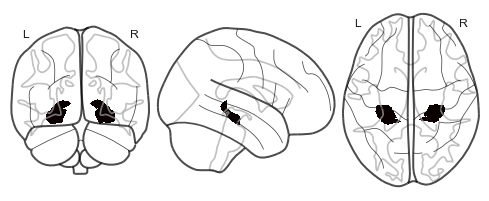

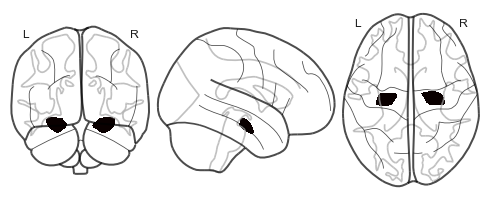

In [136]:
bROIs=['V1','vmPFC','PMC','postHC','antHC'] #
for s in range(1,2):
    sub='sub-' + subs[s]
    mask_fold = fr_bids_dir + 'derivatives/firstlevel/%s/%s/masks/' %(sub, ses) #brain mask file
    for r in range(len(bROIs)): #loop over ROIs
        roi_short=bROIs[r]
        roi_name=mask_fold + '%s_%s.nii.gz' %(sub,roi_short)
        roi_mask=nib.load(roi_name)
        plot_glass_brain(roi_mask)
        fn=figf + "glass_"+roi_short+ ".pdf"
        print(fn)
        plt.savefig(fn, transparent=True)

## export for SRM

In [137]:
runthis=0 #find voxels in common across subs and export to run SRM
if runthis:
    gp=1
    if gp==1:
        ROIs = ['V1','vmPFC','ang','PMC','A1','postHC','antHC'] #
        ROIs = ['antHC'] #selective
        resamp=1 #use for postHC and antHC
    commonsame=np.zeros((len(ROIs)))
    roin,fsub,ntr,ntr_short=0,0,1263,1258 #was 1258 before 1/20/25
    ttasks=['srm','view','recall']
    #ttasks=['view'] #run selectively
    recls=np.load('pydata/recls.npy').astype(int)
    maxrl=np.max(recls)
    for i in range(len(ROIs)):
        print(ROIs[i])
        nvoxs=np.zeros((nS))
        for s in range(nS):
            if gp==1:
                sub='sub-' + subs[s]
                mask_fold=fr_bids_dir + 'derivatives/firstlevel/%s/%s/masks/' %(sub, ses)    
                roi_name=mask_fold + '%s_%s.nii.gz' %(sub,ROIs[i])
                roi_mask=nib.load(roi_name)
                roi_mask_do=roi_mask.dataobj
                
                out_dir=fr_bids_dir + 'derivatives/firstlevel/%s/%s/' % (sub,ses)
                epi_in=out_dir + '%s_%s_task-%s_space-MNI152NLin6Asym_desc-preproc_bold_trim%d_smooth%d_norm_nofilt.nii.gz' % (sub,ses,ttasks[t],n_trunc,fwhmval)
                if s==0:
                    print(epi_in)
                epi_data=nib.load(epi_in)
                
                #jwa 5/19
                if resamp==1:
                    roi_mask=resample_to_img(roi_mask, epi_data) #brain_mask
                    qq=np.where(roi_mask.dataobj>=0.1)
                    for ii in range(len(qq[0])):
                        roi_mask.dataobj[qq[0][ii],qq[1][ii],qq[2][ii]]=1 #because resampling leads to non-binary #s
                    qq=np.where(roi_mask.dataobj<0.1)
                    for ii in range(len(qq[0])):
                        roi_mask.dataobj[qq[0][ii],qq[1][ii],qq[2][ii]]=0 
                    if s==0:
                        plot_roi(roi_mask)    
                    roi_mask_do=roi_mask.dataobj
                #jwa 5/19 end
                if ROIs[i]=='ang':
                    roi_mask_do=ds_ang.maps.dataobj
                if s==0:
                    dat_a=np.zeros((nS,roi_mask_do.shape[0],roi_mask_do.shape[1],roi_mask_do.shape[2]))
                dat_a[s,:,:,:]=roi_mask_do
                print(np.sum(roi_mask_do))
                nvoxs[s]=int(np.sum(roi_mask_do))

        qq=np.where(np.sum(dat_a,axis=0)==nS)
        dat_a_m=np.sum(dat_a,axis=0)
        print(len(qq[0]))
        if len(qq[0])==np.max(nvoxs): #same # of max voxels in common
            commonsame[i]=1
        print('same or not?:',commonsame[i])

        for t in range(1,2):#len(ttasks)):
            for s in range(nS):
                sub='sub-' + subs[s]
                print(sub)
                out_dir=fr_bids_dir + 'derivatives/firstlevel/%s/%s/' % (sub,ses)
                epi_in=out_dir + '%s_%s_task-%s_space-MNI152NLin6Asym_desc-preproc_bold_trim%d_smooth%d_norm_nofilt.nii.gz' % (sub,ses,ttasks[t],n_trunc,fwhmval)
                if s==0:
                    print(epi_in)
                epi_data=nib.load(epi_in)
                print(epi_data.dataobj.shape)
                
                tempdat=np.zeros((len(qq[0]),epi_data.dataobj.shape[3]))
                fulldat=epi_data.get_fdata()
                qq=np.where(dat_a_m==nS)
                for ii in range(len(qq[0])):
                    fir=int(qq[0][ii])
                    sec=int(qq[1][ii])
                    thi=int(qq[2][ii])
                    tempdat[ii,:]=fulldat[fir,sec,thi]
                bold_roi=tempdat[:,hrshiftval:].T
                print('bold_roi:',bold_roi.shape)
                subtr=bold_roi.shape[0]
                if s==0:
                    nvox=bold_roi.shape[1]
                    if t==0:
                        bold_roi_a=np.zeros((nvox,subtr,nS)) #voxels x TRs x subjects
                    elif t==1:
                        bold_roi_a=np.zeros((nvox,ntr,nS))
                    elif t==2:
                        bold_roi_a=np.zeros((nvox,maxrl,nS))
                if t==1:
                    if subtr==ntr_short:
                        print('short recording!')
                        bold_roi_a[:,:ntr-5,s]=bold_roi[:ntr-5,:nvox].T
                    else:
                        bold_roi_a[:,:ntr,s]=bold_roi[:ntr,:nvox].T
                elif t==2:
                    if subtr<maxrl:
                        bold_roi_a[:,:subtr,s]=bold_roi[:subtr,:nvox].T
                    else:
                        bold_roi_a[:,:,s]=bold_roi[:,:nvox].T
                else:
                    bold_roi_a[:,:,s]=bold_roi[:,:nvox].T
            #print('final bold_roi_a data:',bold_roi_a[:2,:2,:2])
            sn='pydata/'+ttasks[t] + '-' + ROIs[i] + '.npy'
            np.save(sn,bold_roi_a)
            print(sn)
            print(bold_roi_a.shape)
        print('finished %s' %ROIs[i])

# event state analyses (Fig 3-4)

In [138]:
#secondary analyses
use_other=0 #use avg of other subs for hahamy analysis
use_one_tr=0 #use only EB TR for hahamy analysis

def avg_resp_ev(e_o,all_edges_tr,D):
    t_evs=all_edges_tr.shape[0]
    D_event,D_eventf=np.zeros((D.shape[0],t_evs)),np.zeros((D.shape[0],t_evs))
    D_evento,D_eventm=np.zeros((D.shape[0],t_evs)),np.zeros((D.shape[0],t_evs))  
    D_event_t_m,D_event_t_o=np.zeros((D.shape[0],t_evs)),np.zeros((D.shape[0],t_evs)) #save event times
    print('D_event shape:',D_event.shape)
    for i in range(t_evs):
        if i==0:
            fir,las=0,all_edges_tr[i]
        else:
            fir,las=all_edges_tr[i-1],all_edges_tr[i]
        #las=fir+2 #reagh / cohn-sheehy FIRST FEW TRs idea
        D_event[:,i]=np.nanmean(D[:,fir:las],axis=1) #event itself
        D_eventf[:,i]=np.nanmean(D[:,fir:fir+respt[3]],axis=1) #first few TRs of event
        
        #Hahamy analysis
        #paper init
        D_eventm[:,i]=np.nanmean(D[:,fir+4:las-3],axis=1) #middle of event
        D_evento[:,i]=np.nanmean(D[:,las-2:las+3],axis=1) #event offset
        
        #from avital (just event boundary TR) -- this works too!
        if use_one_tr:
            D_eventm[:,i]=np.nanmean(D[:,fir+4:las-3],axis=1) #middle of event
            D_evento[:,i]=D[:,las] #event offset
        
        #grab time points
        D_event_t_m[:,i]=(fir+las)/2 #midpoint
        D_event_t_o[:,i]=las
        
    #now re-arrange order!
    D_event_re,D_eventf_re=np.zeros((D_event.shape[0],D_event.shape[1])),np.zeros((D_event.shape[0],D_event.shape[1]))
    D_evento_re,D_eventm_re=np.zeros((D_event.shape[0],D_event.shape[1])),np.zeros((D_event.shape[0],D_event.shape[1]))
    tot,event_re_edges=0,[]
    cumu_qq=[]
    diffmat_re=np.zeros((D_event.shape[1],D_event.shape[1]))
    for i in range(len(ems)):
        qq=np.where(e_o[:,1]==i)[0] #find events
        tot+=len(qq)
        cumu_qq=np.hstack([cumu_qq,qq])
        event_re_edges=np.append(event_re_edges,tot)
    for j in range(len(cumu_qq)):
        D_event_re[:,j]=D_event[:,int(cumu_qq[j])]
        D_eventf_re[:,j]=D_eventf[:,int(cumu_qq[j])]
        D_eventm_re[:,j]=D_eventm[:,int(cumu_qq[j])]
        D_evento_re[:,j]=D_evento[:,int(cumu_qq[j])]
        diffmat_re[:,j]=abs(cumu_qq[:]-cumu_qq[j])
    return D_event,D_eventf,D_evento,D_eventm,D_event_re,D_eventf_re,D_evento_re,D_eventm_re,event_re_edges,diffmat_re,cumu_qq,D_event_t_m,D_event_t_o

def imgray(dat,fn,xyly):
    fos=50
    f, ax = plt.subplots(1,1, figsize = (fs1//2,fs1//2)) 
    if np.nanmin(dat)>=0:
        vm=0
    else:
        vm=np.nanmin(dat)-0.2
    plt.imshow(dat,cmap='gray',vmin=vm,vmax=1)
    imgl=np.linspace(0,40,3)
    ax.set_xticks(imgl)
    ax.set_yticks(imgl)
    if xyly:
        ax.set_xlabel('Event #',fontsize=fos)
        ax.set_ylabel('Event #',fontsize=fos)
    ax.tick_params(axis='both', which='major',labelsize=fos*2/3)
    for axis in ['bottom','left']:
        ax.spines[axis].set_linewidth(lw9/2)
    ax.axline((1, 0), (0, 1), color='black', linestyle=':', linewidth=lw9/2, transform=ax.transAxes)
    f.tight_layout()
    fn=figf + fn + ".pdf"
    plt.savefig(fn, transparent=True)
    
def barswarm(d1,d2,d3,d4,d5,d6,d7,d8,lab,yl,fn,exv): #d5,d6, #plot basic comparisons for >1 exp
    fs,fsz,msz=24,9,9
    lw=4
    grp='Predictor' #use unless over-ridden
    if exv==1:
        xtl=['Time','Storyline','Character','Place','Semantic','Causal','Top causal','Time x storyline']
        dat1=pd.DataFrame({grp:['Time']*len(d1),lab:d1})
        dat2=pd.DataFrame({grp:['Storyline']*len(d2),lab:d2})
        dat3=pd.DataFrame({grp:['Character']*len(d3),lab:d3})
        dat4=pd.DataFrame({grp:['Place']*len(d4),lab:d4})
        dat5=pd.DataFrame({grp:['Semantic']*len(d5),lab:d5})
        dat6=pd.DataFrame({grp:['Causal']*len(d6),lab:d6})
        ng=6
        if len(d7)>0:
            dat7=pd.DataFrame({grp:['Top causal']*len(d7),lab:d7})
            ng=7
            if len(d8)>0:
                dat8=pd.DataFrame({grp:['Time x storyline']*len(d8),lab:d8})
                ng=8
        dat = pd.concat([dat1, dat2],ignore_index=True)
        dat = pd.concat([dat, dat3],ignore_index=True)
        dat = pd.concat([dat, dat4],ignore_index=True)
        dat = pd.concat([dat, dat5],ignore_index=True)
        dat = pd.concat([dat, dat6],ignore_index=True)
        if len(d7)>0:
            dat = pd.concat([dat, dat7],ignore_index=True)
            if len(d8)>0:
                dat = pd.concat([dat, dat8],ignore_index=True)
    elif exv==2:
        ng,xtl=2,['Causal','Time x storyline']
        dat1=pd.DataFrame({grp:['Causal']*len(d1),lab:d1})
        dat2=pd.DataFrame({grp:['Time x storyline']*len(d2),lab:d2})
        dat = pd.concat([dat1, dat2],ignore_index=True)
    elif exv==3:
        ng,xtl=1,['Time x storyline']
        dat=pd.DataFrame({grp:['Time x storyline']*len(d1),lab:d1})
    elif exv==4:
        ng,xtl=1,['Mem. trans. network']
        dat=pd.DataFrame({grp:['Mem. trans. network']*len(d1),lab:d1})
    elif exv==5:
        ng,xtl=1,['Mem. trans. network -- other']
        dat=pd.DataFrame({grp:['Mem. trans. network -- other']*len(d1),lab:d1})
    elif exv>5:
        grp='ROI'
        xtl=['V1','mPFC','AG','PMC','postHC','antHC']
        dat1=pd.DataFrame({grp:['V1']*len(d1),lab:d1})
        dat2=pd.DataFrame({grp:['mPFC']*len(d2),lab:d2})
        dat3=pd.DataFrame({grp:['AG']*len(d3),lab:d3})
        dat4=pd.DataFrame({grp:['PMC']*len(d4),lab:d4})
        dat5=pd.DataFrame({grp:['postHC']*len(d5),lab:d5})
        dat6=pd.DataFrame({grp:['antHC']*len(d6),lab:d6})
        ng=len(xtl)
        dat = pd.concat([dat1, dat2],ignore_index=True)
        dat = pd.concat([dat, dat3],ignore_index=True)
        dat = pd.concat([dat, dat4],ignore_index=True)
        dat = pd.concat([dat, dat5],ignore_index=True)
        dat = pd.concat([dat, dat6],ignore_index=True)
                
    if exv>2:
        f,ax=plt.subplots(nrows=1,ncols=1,figsize=(fsz*3/4,fsz*3/4)) # 
    else:
        f,ax=plt.subplots(nrows=1,ncols=1,figsize=(fsz,fsz*3/4)) #
    cp = sns.color_palette("colorblind")
    join_y="-"
    ax=sns.swarmplot(x=dat[grp],y=dat[lab],color='gray',facecolor=None,size=msz,zorder=1)#color=cp
    ax=sns.pointplot(x=dat[grp],y=dat[lab],color='k',linestyles=['None'],#linestyles=join_y,palette=cp,#color=cp,#saturation=1,
                     err_kws={'linewidth': lw*2},capsize=.2) #errwidth=lw*2,   
    
    ax.set_ylabel(yl,fontsize=fs,color='black')
    ax.set_xlabel('Predictor',fontsize=fs,color='black')
    if exv>5:
        ax.set_xlabel(grp,fontsize=fs,color='black')
    ax.set_ylim([-0.2,0.2])
    lim2=0.05
    if exv>1:
        ax.set_ylim([-lim2,lim2])
        if exv==6:
            ax.set_ylim([-lim2,lim2])
        elif exv==7:
            ax.set_ylim([-0.3,0.3])
    ax.hlines(0,0-0.5,ng+0.5,linestyles='--',colors='k')
    ax.tick_params(axis='both', which='major', labelsize=fs,labelrotation=30,colors='black')
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)
    #ax.get_legend().remove() #include if colors in swarmplot
    for axis in ['bottom','left']:
        ax.spines[axis].set_linewidth(lw)
    f.tight_layout()
    f.savefig(fn, transparent=True)
    if sv_ind==0:
        plt.close(f)

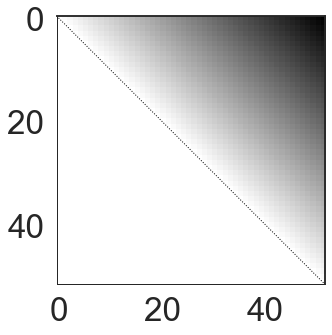

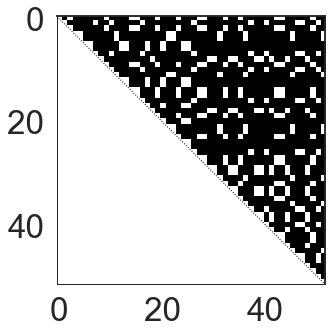

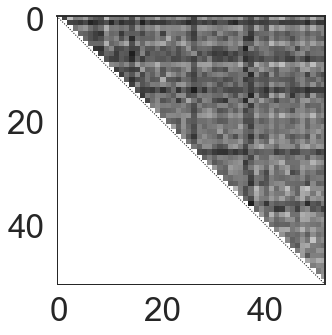

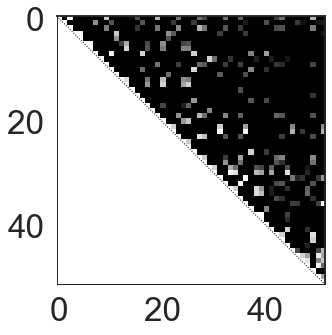

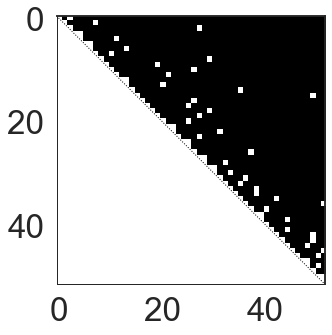

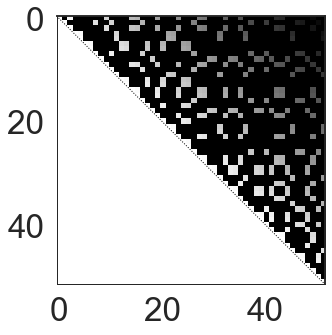

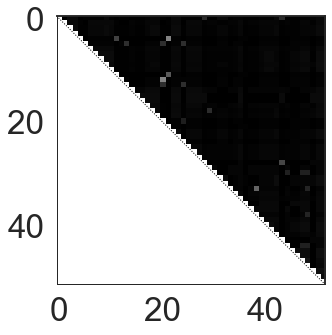

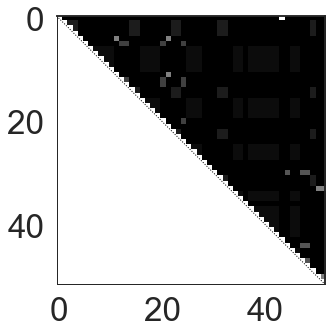

In [139]:
#read in several models to test fMRI data against!

fos,lw9=50,2
#time-based matrix   
time_model=np.zeros((n_ev,n_ev))
lsp=np.linspace(1,0,n_ev)
for i in range(n_ev):
    time_model[i,i:]=lsp[:n_ev-i]
    time_model[i:,i]=lsp[:n_ev-i]

#binary event model matrix
bin_ev_model=np.zeros((n_ev,n_ev))
for i in range(n_ev):
    qq=e_o[:,1]==e_o[i,1]
    bin_ev_model[i,qq]=1
    
#vis/aud: not using b/c unclear best method to compute similarity for these?
mot_m,aud_m=np.zeros((n_ev)),np.zeros((n_ev)) 
for i in range(n_ev):
    if i==0:
        fir=0
    else:
        fir=all_edges_tr[i-1]
    las=all_edges_tr[i]
    mot_m[i]=np.mean(mot_tc[fir:las+1])
    aud_m[i]=np.mean(aud_tc[fir:las+1])

#import other matrices
cdat_a_m=np.load('pydata/cdat_a_m.npy') #load causality data
tcdat_a_m=np.load('pydata/tcdat_a_m.npy') #load top causality data
ticdat_a_m=np.load('pydata/ticdat_a_m.npy') #load top input causality data
sem_2d_fs=np.load('pydata/friends_sem_2d_fs-1.npy') #load semantic data

caus2d,tcaus2d,ticaus2d,sem2d=np.zeros((n_ev,n_ev)),np.zeros((n_ev,n_ev)),np.zeros((n_ev,n_ev)),np.zeros((n_ev,n_ev))
for i in range(n_ev):
    for ii in range(n_ev):
        if i>ii:
            caus2d[i,ii],tcaus2d[i,ii],sem2d[i,ii]=cdat_a_m[ii,i],tcdat_a_m[ii,i],sem_2d_fs[ii,i]
            ticaus2d[i,ii]=ticdat_a_m[i,ii]
        else:
            caus2d[i,ii],tcaus2d[i,ii],sem2d[i,ii]=cdat_a_m[i,ii],tcdat_a_m[i,ii],sem_2d_fs[i,ii],
            ticaus2d[i,ii]=ticdat_a_m[ii,i]

#add char, place, aud, lum
char_trans=np.load('pydata/char_trans.npy') #load char data
place_trans=np.load('pydata/place_trans.npy') #load place data

#add memo trans structure!!!
memo_trans_sub=np.load('pydata/memo_trans_sub.npy')

time_caus=np.multiply(time_model,cdat_a_m)
time_tcaus=np.multiply(time_model,tcdat_a_m)
time_bin_ev=np.multiply(time_model,bin_ev_model)

#make models visually non-symmetric and get flat version for stats
j=0
time_flat=np.zeros(((n_ev*n_ev//2)-n_ev//2)) #pre-allocate
bin_ev_flat,sem_flat,caus_flat,tcaus_flat=time_flat+0,time_flat+0,time_flat+0,time_flat+0
time_caus_flat,time_tcaus_flat,time_bin_ev_flat,char_flat,place_flat=time_flat+0,time_flat+0,time_flat+0,time_flat+0,time_flat+0
memo_trans_sub_flat=np.zeros(((n_ev*n_ev//2)-n_ev//2,nS))
for i in range(n_ev):
    for ii in range(n_ev):
        if i>=ii:
            time_model[i,ii]=math.nan
            bin_ev_model[i,ii]=math.nan
            sem_2d_fs[i,ii]=math.nan
            cdat_a_m[i,ii]=math.nan
            tcdat_a_m[i,ii]=math.nan
            char_trans[i,ii]=math.nan
            place_trans[i,ii]=math.nan
            time_bin_ev[i,ii]=math.nan
        else:
            time_flat[j]=time_model[i,ii] #s/o to true detective
            bin_ev_flat[j]=bin_ev_model[i,ii]
            sem_flat[j]=sem_2d_fs[i,ii]
            caus_flat[j]=cdat_a_m[i,ii]
            tcaus_flat[j]=tcdat_a_m[i,ii]
            time_caus_flat[j]=time_caus[i,ii]
            time_tcaus_flat[j]=time_tcaus[i,ii]
            time_bin_ev_flat[j]=time_bin_ev[i,ii]
            char_flat[j]=char_trans[i,ii]
            place_flat[j]=place_trans[i,ii]
            memo_trans_sub_flat[j,:]=memo_trans_sub[i,ii,:]
            j+=1

imgray(time_model,'RSA_model_time',0)
imgray(bin_ev_model,'RSA_model_bin_ev',0)
imgray(sem_2d_fs,'RSA_model_semantic',0)
cdat_a_m0=np.divide(cdat_a_m,np.nanmax(cdat_a_m))
imgray(cdat_a_m0,'RSA_model_caus',0)
imgray(tcdat_a_m,'RSA_model_top_caus',0)
imgray(time_bin_ev,'RSA_model_time_bin',0)
imgray(char_trans,'RSA_model_char',0)
imgray(place_trans,'RSA_model_place',0)

time_flat2,bin_ev_flat2,sem_flat2,caus_flat2,tcaus_flat2=time_flat+0,bin_ev_flat,sem_flat+0,caus_flat+0,tcaus_flat+0
time_caus_flat2,time_tcaus_flat2,time_bin_ev_flat2=time_caus_flat+0,time_tcaus_flat+0,time_bin_ev_flat+0
char_flat2,place_flat2,memo_trans_sub_flat2=char_flat,place_flat+0,memo_trans_sub_flat+0

## run event similarity loop

V1
(23, 1263, 1052)
nVox: 1052
(1263, 1052)
D_event shape: (1052, 52)
[[    9.5    -7.    -34.  ... -1175.  -1216.5 -1230.5]
 [   23.5     7.    -20.  ... -1161.  -1202.5 -1216.5]
 [   63.5    47.     20.  ... -1121.  -1162.5 -1176.5]
 ...
 [ 1219.5  1203.   1176.  ...    35.     -6.5   -20.5]
 [ 1232.5  1216.   1189.  ...    48.      6.5    -7.5]
 [ 1247.5  1231.   1204.  ...    63.     21.5     7.5]]
D_event shape: (1052, 52)
D_event shape: (1052, 52)
D_event shape: (1052, 52)
D_event shape: (1052, 52)
D_event shape: (1052, 52)
D_event shape: (1052, 52)
D_event shape: (1052, 52)
D_event shape: (1052, 52)
D_event shape: (1052, 52)
D_event shape: (1052, 52)
D_event shape: (1052, 52)
D_event shape: (1052, 52)
D_event shape: (1052, 52)
D_event shape: (1052, 52)
D_event shape: (1052, 52)
D_event shape: (1052, 52)
D_event shape: (1052, 52)
D_event shape: (1052, 52)
D_event shape: (1052, 52)
D_event shape: (1052, 52)
D_event shape: (1052, 52)
D_event shape: (1052, 52)
D_event shape: (1052, 

D_event shape: (541, 52)
D_event shape: (541, 52)
D_event shape: (541, 52)
D_event shape: (541, 52)
D_event shape: (541, 52)
D_event shape: (541, 52)
D_event shape: (541, 52)
D_event shape: (541, 52)
D_event shape: (541, 52)
D_event shape: (541, 52)
D_event shape: (541, 52)
D_event shape: (541, 52)
D_event shape: (541, 52)
D_event shape: (541, 52)
D_event shape: (541, 52)
D_event shape: (541, 52)
D_event shape: (541, 52)
D_event shape: (541, 52)
D_event shape: (541, 52)
D_event shape: (541, 52)
D_event shape: (541, 52)
D_event shape: (541, 52)
D_event shape: (541, 52)
D_event shape: (541, 52)
D_event shape: (541, 52)
D_event shape: (541, 52)
D_event shape: (541, 52)
D_event shape: (541, 52)
D_event shape: (541, 52)
D_event shape: (541, 52)
(23, 2)
(52, 52)
['Chandler/Nina/boss', 'Marcel/SAP', 'Phoebe/Ursula/Joey', 'Rachel/Monica', 'Ross parenting']
1274
mo: -0.0261, mo, re: -0.0241, mo, caus: -0.029, mo, caus rev: -0.0278, mo, ncaus: -0.0256, mo, ncaus rev: -0.0234
j: 1225, jj: 1225,jk

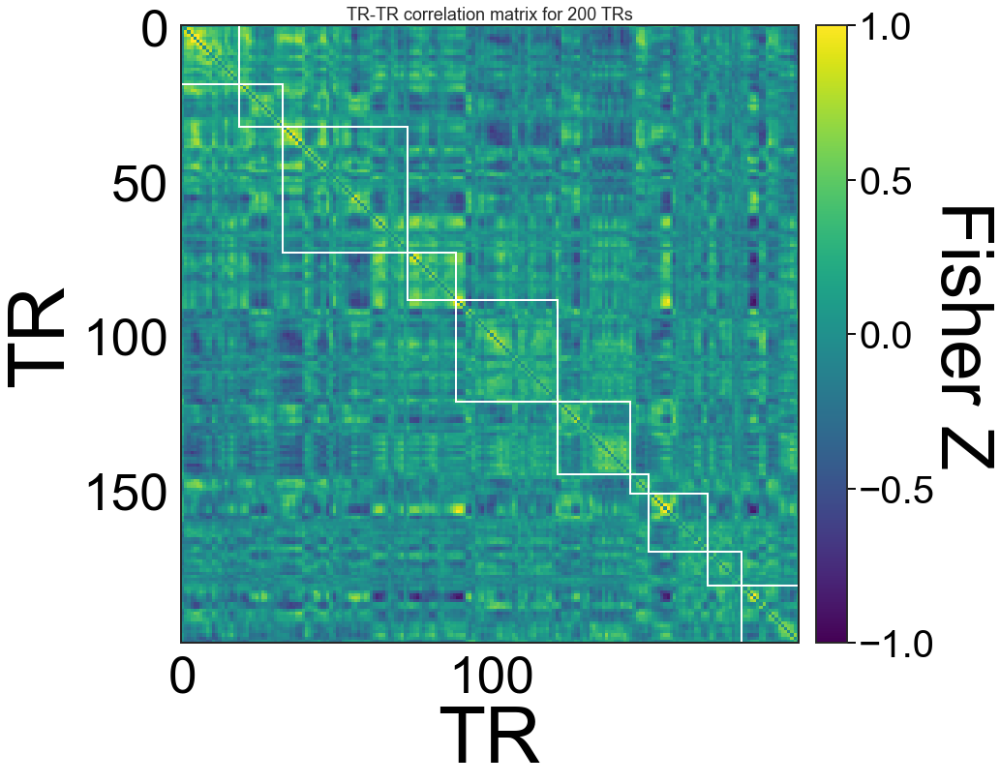

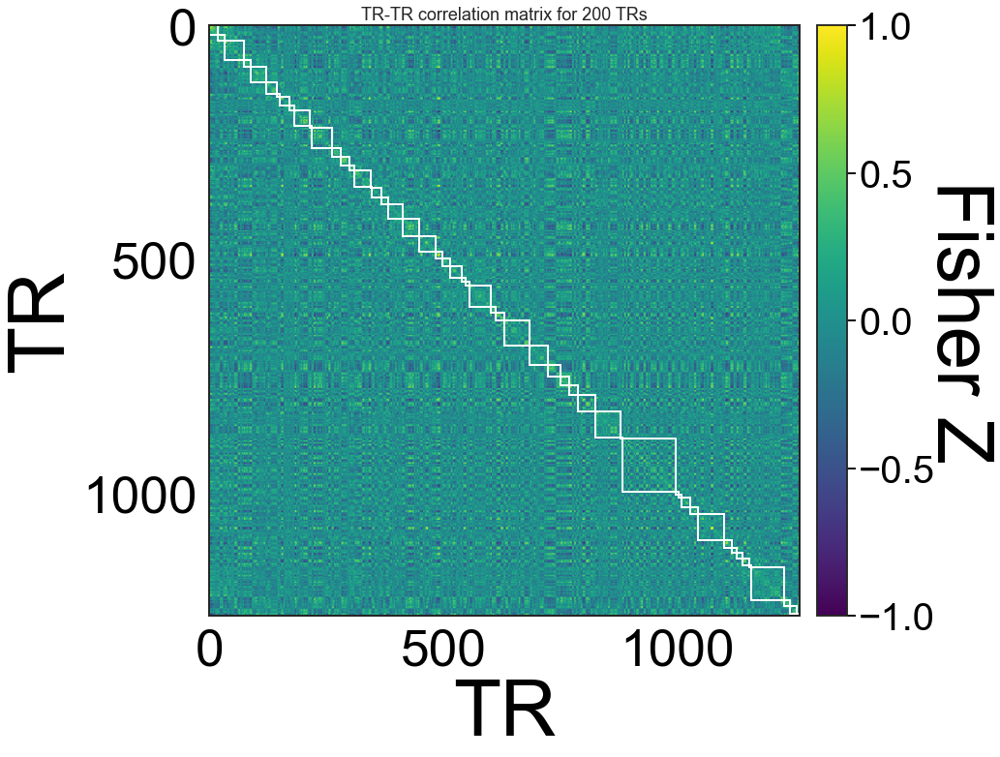

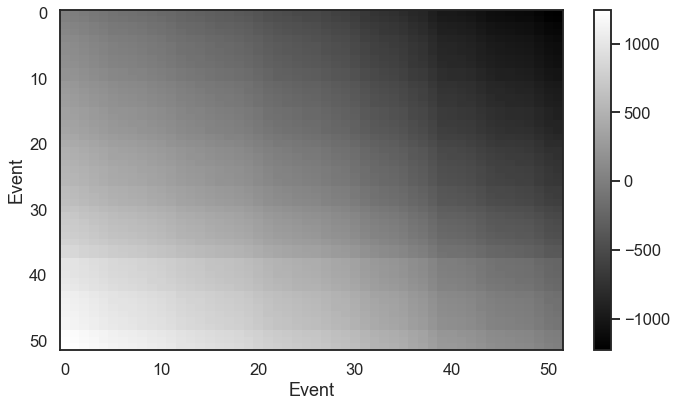

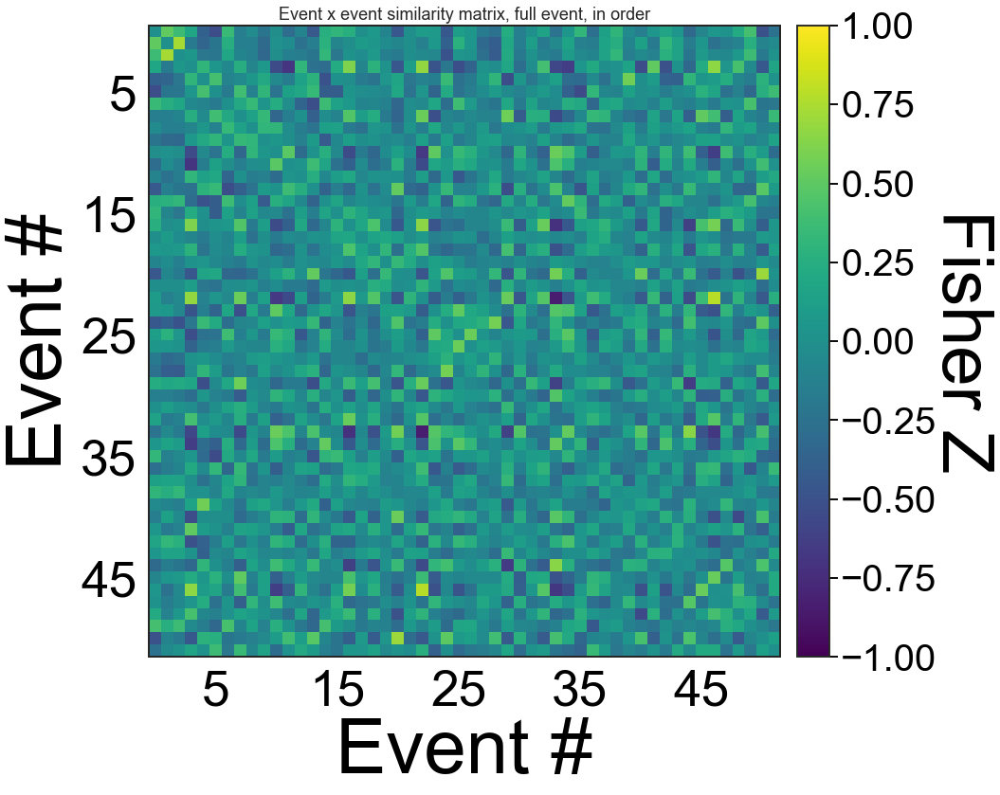

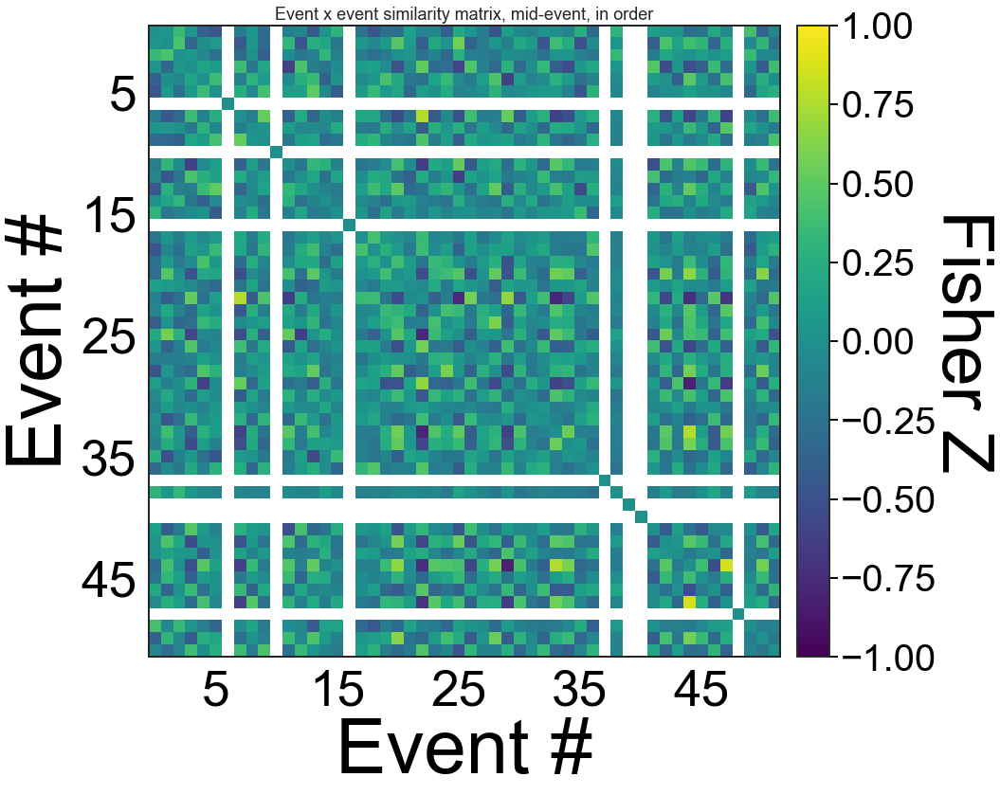

...

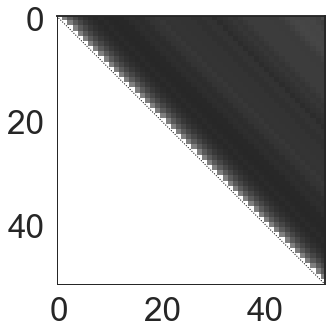

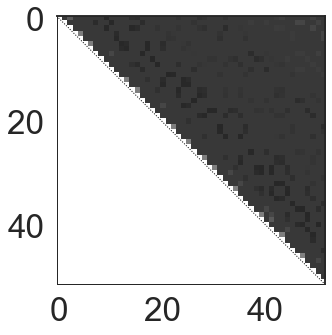

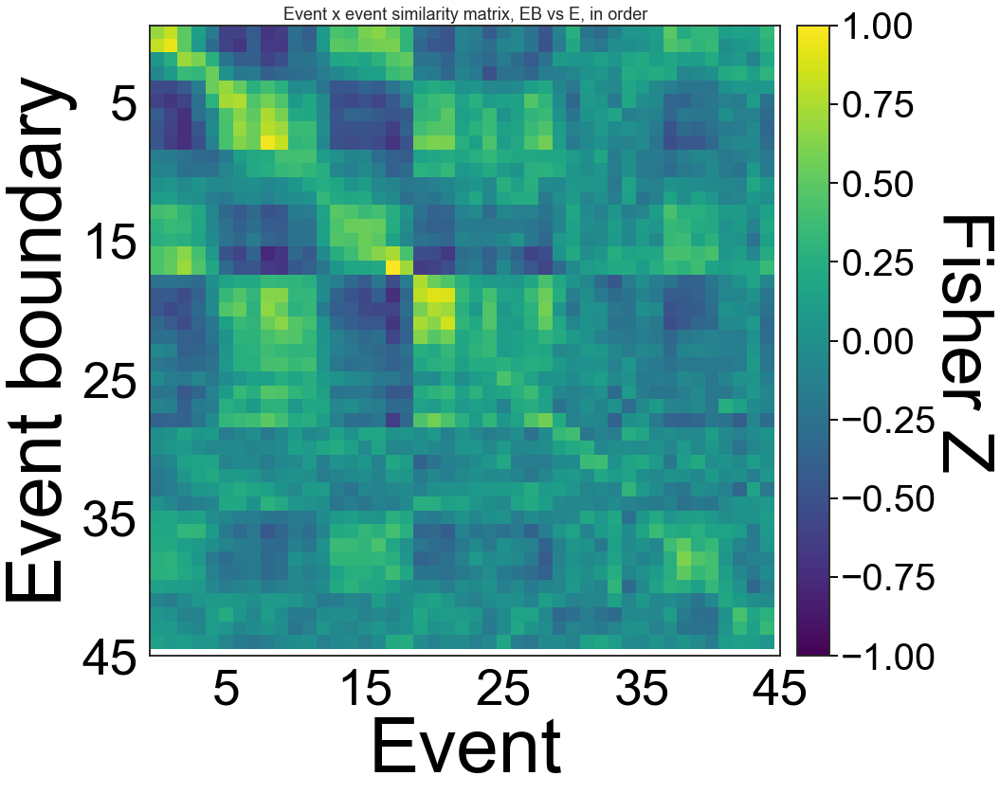

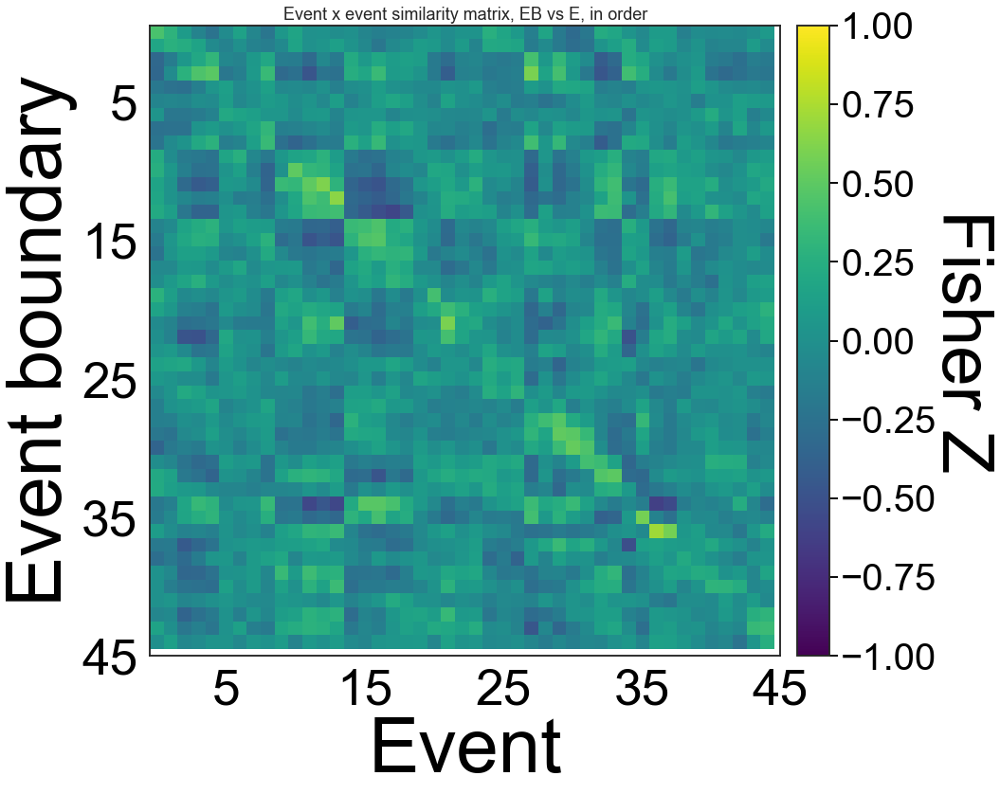

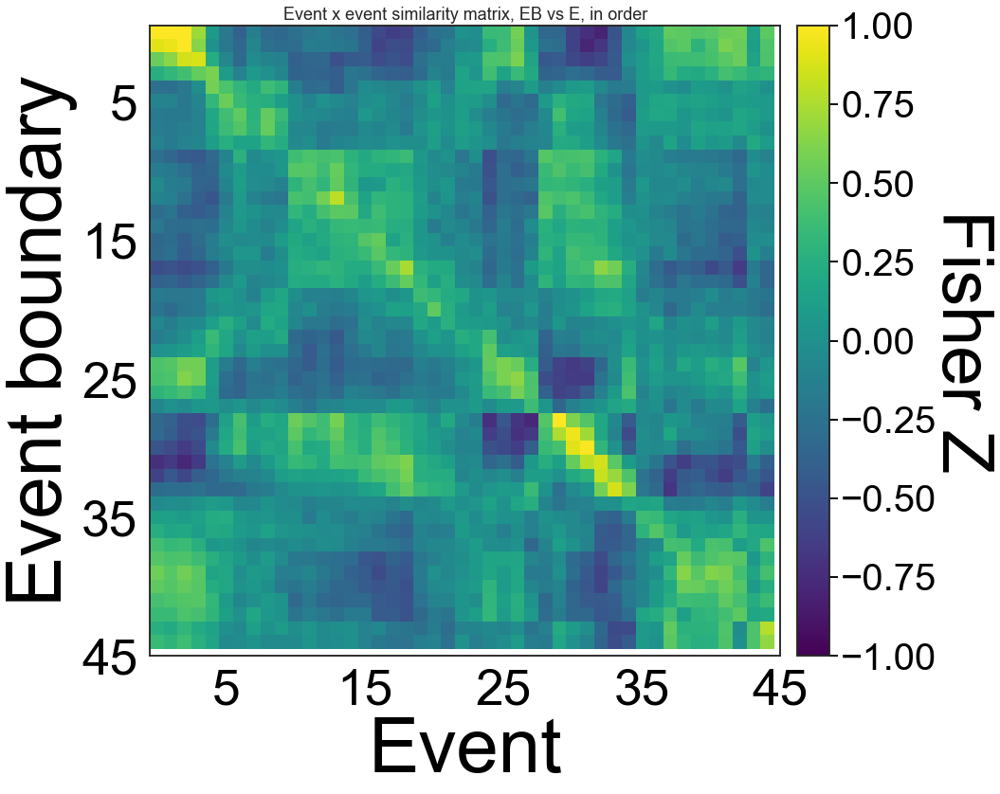

In [140]:
ROIs = ['V1','vmPFC','ang','PMC','postHC','antHC'] 
raw_or_srm_or_emb=1 #raw = 1, srm = 2, embeddings = 3 (don't use)
scut=10
gp=1
roi_set=[0,1,2,3,4,5] #for gp=1
plot_ind=0
time_model_type=2 #1=linear time, 2=estimated from event distance patterns in non-causal events from other subs
num_yeo=7 #17
if gp>3:
    nbr=100
    whichp=2
    dataset=datasets.fetch_atlas_schaefer_2018(n_rois=nbr,resolution_mm=2,yeo_networks=num_yeo)
    ROIs=dataset.labels
    i=np.eye(3)*2
    dataset.maps=image.resample_img(dataset.maps, target_affine=i,interpolation='nearest') #resample
    masker_ho=NiftiLabelsMasker(labels_img=dataset.maps) #parcel labels
    index=masker_ho.labels_img.dataobj
    roi_set=np.linspace(0,nbr-1,nbr).astype(int)
    sv_ind=0
    
    yeo_n=np.zeros((nbr))
    yeo_nn=['Vis','SomMot','DorsAttn','SalVentAttn','Limbic','Cont','Default']
    '''yeo_nn=['VisCent','VisPeri','SomMotA','SomMotB','DorsAttnA','DorsAttnB', #17 network version
        'SalVentAttnA','SalVentAttnB','LimbicB','LimbicA','ContA','ContB',
        'ContC','DefaultA','DefaultB','DefaultC','TempPar']'''

    for i in range(nbr):
        w=str(ROIs[i])
        for ii in range(len(yeo_nn)):
            if w.find(yeo_nn[ii])>0:
                yeo_n[i]=ii
    print('Yeo network assignments:',yeo_n)

    yeo_n_r=np.zeros((nbr))
    qq_yeo=np.argsort(yeo_n,kind='mergesort')
    print('Argsort index:',qq_yeo)
    yeo_n_r=yeo_n[qq_yeo]
    print(yeo_n_r)
    
    if gp==5:
        nbr=num_yeo+0
        ROIs=yeo_nn
elif gp==1:
    nbr=len(roi_set)
    sv_ind=1

allbetas=[None]*nbr
betas_co_a=[None]*nbr
betas_red_a=[None]*nbr
betas_red3_a=[None]*nbr
betas_red3t_a=[None]*nbr
betas_sem_solo_a=[None]*nbr
betas_so_a=[None]*nbr
betas_redt_a=[None]*nbr
caus_or_sem=1 #1=causal,2=sem (ns),3=ticausal (ns)
allmos=[None]*nbr
allexmats=[None]*nbr

mid_off_s = [[None] * nS for _ in range(nbr)]
mid_off_res = [[None] * nS for _ in range(nbr)]
mid_off_athrs = [[None] * nS for _ in range(nbr)]
mid_off_bthrs = [[None] * nS for _ in range(nbr)]
mid_off_athr_res = [[None] * nS for _ in range(nbr)]
mid_off_bthr_res = [[None] * nS for _ in range(nbr)]
br_shapes=np.zeros(nbr, dtype=int)

for roi_in in range(nbr):
    roin=roi_set[roi_in]
    print(ROIs[roin])
    if raw_or_srm_or_emb==1:
        if gp==1:
            sn='pydata/view-%s.npy' %str(ROIs[roin])
            curr_test_obj=np.load(sn)
        for s in range(nS):
            if gp==1:
                if s==0:
                    bold_roi_a=np.zeros((nS,curr_test_obj.shape[1],curr_test_obj.shape[0])) #subs x TRs x voxels
                bold_roi_a[s,:,:]=curr_test_obj[:,:,s].T
                if s==0:
                    print(bold_roi_a.shape)
            elif gp==4:
                fn='pydata/view-all-'+str(subs[s])+'-'+str(whichp)+'.npy' #just check final sub
                buff=np.load(fn,allow_pickle=True)
                bold_roi=buff[roin]
                if s==0:
                    bold_roi_a=np.zeros((nS,bold_roi.shape[1],bold_roi.shape[0])) #subs x TRs x voxels
                bold_roi_a[s,:,:]=bold_roi.T
            elif gp==5:
                fn='pydata/view-all-'+str(subs[s])+'-'+str(whichp)+'.npy' #just check final sub
                buff=np.load(fn,allow_pickle=True)
                net_set=np.where(yeo_n==roin)[0]
                for net_roi in range(len(net_set)):
                    buff2=buff[net_set[net_roi]]
                    if net_roi==0:
                        bold_roi=buff2+0
                    else:
                        bold_roi=np.vstack([bold_roi,buff2])
                if s==0:
                    bold_roi_a=np.zeros((nS,bold_roi.shape[1],bold_roi.shape[0])) #subs x TRs x voxels
                    print('net set:',net_set)
                bold_roi_a[s,:,:]=bold_roi.T
        nTR,nV=bold_roi_a.shape[1],bold_roi_a.shape[2]
        print('nVox:',nV)
        if gp==1:
            if roi_in==0:
                bold_roi_a0=bold_roi_a+0 #save this for later
            elif roi_in==1:
                bold_roi_a1=bold_roi_a+0 
            elif roi_in==2:
                bold_roi_a2=bold_roi_a+0
            elif roi_in==3:
                bold_roi_a3=bold_roi_a+0
            elif roi_in==4:
                bold_roi_a4=bold_roi_a+0
            elif roi_in==5:
                bold_roi_a5=bold_roi_a+0
    elif raw_or_srm_or_emb==2:
        sn='pydata/view-' + str(ROIs[roin]) + '_postSRM_'+str(scut)+'.npy'
        curr_test_obj=np.load(sn)
        print(curr_test_obj.shape)
        for s in range(nS):
            if s==0:
                bold_roi_a=np.zeros((nS,curr_test_obj.shape[0],curr_test_obj.shape[1])) #subs x TRs x voxels
            print(bold_roi_a.shape)
            bold_roi_a[s,:,:]=curr_test_obj[:,:,s]
        print(bold_roi_a.shape)

    #make big, pretty plots
    br_shapes[roi_in]=int(bold_roi_a.shape[2])
    fos,lp=80,60
    mm=np.mean(bold_roi_a,axis=0)
    print(mm.shape)
    pts=200 #mm.shape[0]
    f, ax = plt.subplots(1,1, figsize = (fs1*1.5,fs1*1.5))
    exmat,im=plot_tt_similarity_matrix(ax,mm[:pts,:].T,[],np.divide(all_edges,fr_TR),[],[], pts)
    f.tight_layout()
    fign=figf+'States-AllSubMean-%s.svg' %(str(ROIs[roin]))
    #f.savefig(fign)
    title_text = '''TR-TR correlation matrix for %s TRs''' %pts
    ax.set_xlabel('TR',fontsize=fos,color='black')
    ax.set_ylabel('TR',fontsize=fos,color='black')
    ax.tick_params(axis='both', which='major',labelsize=fos*2/3,colors='black')
    divider = make_axes_locatable(ax)
    cax = divider.append_axes("right", size="5%", pad=0.25)
    cbar=f.colorbar(im, cax=cax)
    cbar.set_label('Fisher Z',rotation=270,fontsize=fos-4,labelpad=lp,color='black')    
    cbar.ax.tick_params(labelsize=fos/2,colors='black') 
    f.tight_layout()
    fn=figf+"Event_simmat-"+str(ROIs[roin])+"-"+str(raw_or_srm_or_emb)+"-"+str(br_shapes[roi_in])+".pdf"
    if sv_ind:
        plt.savefig(fn, transparent=True)
    else:
        plt.close(f)
    ax.set_title(title_text)

    #all data points
    f, ax = plt.subplots(1,1, figsize = (fs1*1.5,fs1*1.5))
    exmat,im=plot_tt_similarity_matrix(ax,mm.T,[],np.divide(all_edges,fr_TR),[],[], mm.shape[0])
    f.tight_layout()
    fign=figf+'States-AllSubMean-%s.svg' %(str(ROIs[roin]))
    #f.savefig(fign)
    title_text = '''TR-TR correlation matrix for %s TRs''' %pts
    ax.set_xlabel('TR',fontsize=fos,color='black')
    ax.set_ylabel('TR',fontsize=fos,color='black')
    ax.tick_params(axis='both', which='major',labelsize=fos*2/3,colors='black')
    divider = make_axes_locatable(ax)
    cax = divider.append_axes("right", size="5%", pad=0.25)
    cbar=f.colorbar(im, cax=cax)
    cbar.set_label('Fisher Z',rotation=270,fontsize=fos,labelpad=lp,color='black')    
    cbar.ax.tick_params(labelsize=fos/2,colors='black') 
    f.tight_layout()
    fn=figf+"Event_simmat-allpts-"+str(ROIs[roin])+"-"+str(raw_or_srm_or_emb)+"-"+str(br_shapes[roi_in])+".pdf"
    if sv_ind:
        plt.savefig(fn, transparent=True)
    else:
        plt.close(f)
    ax.set_title(title_text)
    
    #flatten avg. exmat
    exmat_flat=np.zeros(((n_ev*n_ev//2)-n_ev//2))
    j=0
    for i in range(n_ev):
        for ii in range(n_ev):
            if i>=ii:
                exmat[i,ii]=math.nan
            else:
                exmat_flat[j]=exmat[i,ii]
                j+=1

    #imgray(exmat,'exmat_gray',0)
    
    #note: can run to look only @ST changes by using all_edges_st
            
    #first run function grabbing ...
    # (1) ev x ev matrix, entire event, original order
    # (2) ev x ev matrix, first TRs of each event
    # (3) ev x ev matrix, boundary offset
    # (4) ev x ev matrix, middle of each event
    # (5) ev x ev matrix, entire event, re-shuffled order by storyline
    # (6) ev x ev matrix, first TRs of each event, re-shuffled by storyline
    # (7) ev x ev matrix, boundary offset, re-shuffled by storyline
    # (8) ev x ev matrix, middle of each event, re-shuffled by storyline
    #...others
    respt=[-5,-3,0,2] #boundary response time boundaries: 0-1 for pre-EB, 2-3 for post-EB
    lin_ev=np.linspace(1,n_ev,n_ev)
    D_event,D_eventf,D_evento,D_eventm,D_event_re,D_eventf_re,D_evento_re,D_eventm_re,event_re_edges,diffmat_re,cumu_qq,D_event_t_m,D_event_t_o=avg_resp_ev(e_o,all_edges_tr,mm.T)

    #for hahamy analysis, mid-end comp
    if roi_in==0:
        D_mid_end=np.zeros((n_ev,n_ev))
        for i in range(n_ev):
            for ii in range(n_ev):
                D_mid_end[i,ii]=D_event_t_o[0,i]-D_event_t_m[0,ii]

        print(D_mid_end)
        f, ax = plt.subplots(1,1, figsize = (fs1,fs2))
        im=ax.imshow(D_mid_end,interpolation='none',cmap='gray',aspect='auto')
        ax.set_xlabel('Event') 
        ax.set_ylabel('Event') 
        cbar=f.colorbar(im)
        f.tight_layout()

        evcut=2
        time_past,time_fut=[],[]
        for i in range(n_ev):
            for ii in range(n_ev):
                if i-evcut>ii:
                    time_past=np.hstack([time_past,D_mid_end[i,ii]])
                elif i<ii-evcut:
                    time_fut=np.hstack([time_fut,D_mid_end[i,ii]])
    
    #plot events in order!
    f, ax = plt.subplots(1,1, figsize = (fs1*1.5,fs1*1.5)) 
    exmat,im=plot_tt_similarity_matrix(ax,D_event,[],[],[],[],D_event.shape[1])
    ax.set_xticks(lin_ev[4::10])
    ax.set_yticks(lin_ev[4::10])
    ax.set_xlabel('Event #',fontsize=fos,color='black')
    ax.set_ylabel('Event #',fontsize=fos,color='black')
    fn="figs/Event_evXev-"+str(ROIs[roin])+"-"+str(raw_or_srm_or_emb)+"-"+str(br_shapes[roi_in])+".pdf"
    ax.tick_params(axis='both', which='major',labelsize=fos*2/3,colors='black')
    divider = make_axes_locatable(ax)
    cax = divider.append_axes("right", size="5%", pad=0.25)
    cbar=f.colorbar(im, cax=cax)
    cbar.set_label('Fisher Z',rotation=270,fontsize=fos-4,labelpad=lp,color='black')    
    cbar.ax.tick_params(labelsize=fos/2,colors='black') 
    f.tight_layout()
    if sv_ind:
        plt.savefig(fn, transparent=True)
    else:
        plt.close(f)
    ax.set_title('Event x event similarity matrix, full event, in order')
    
    f, ax = plt.subplots(1,1, figsize = (fs1*1.5,fs1*1.5)) 
    exmat,im=plot_tt_similarity_matrix(ax,D_eventm,[],[],[],[],D_event.shape[1])
    ax.set_xticks(lin_ev[4::10])
    ax.set_yticks(lin_ev[4::10])
    ax.set_xlabel('Event #',fontsize=fos,color='black')
    ax.set_ylabel('Event #',fontsize=fos,color='black')
    fn="figs/Event_m_evXev-"+str(ROIs[roin])+"-"+str(raw_or_srm_or_emb)+"-"+str(br_shapes[roi_in])+".pdf"
    ax.tick_params(axis='both', which='major',labelsize=fos*2/3,colors='black')
    divider = make_axes_locatable(ax)
    cax = divider.append_axes("right", size="5%", pad=0.25)
    cbar=f.colorbar(im, cax=cax)
    cbar.set_label('Fisher Z',rotation=270,fontsize=fos-4,labelpad=lp,color='black')    
    cbar.ax.tick_params(labelsize=fos/2,colors='black') 
    f.tight_layout()
    if sv_ind:
        plt.savefig(fn, transparent=True)
    else:
        plt.close(f)
    ax.set_title('Event x event similarity matrix, mid-event, in order')
    
    f, ax = plt.subplots(1,1, figsize = (fs1*1.5,fs1*1.5)) 
    exmatom,im=plot_tt_similarity_matrix(ax,D_evento,D_eventm,[],[],[],D_event.shape[1])
    ax.set_xticks(lin_ev[4::10])
    ax.set_yticks(lin_ev[4::10])
    plt.close(f)
    f, ax = plt.subplots(1,1, figsize = (fs1*1.5,fs1*1.5)) 
    exmato,im=plot_tt_similarity_matrix(ax,D_evento,D_event,[],[],[],D_event.shape[1])
    ax.set_xticks(lin_ev[4::10])
    ax.set_yticks(lin_ev[4::10])
    plt.close(f)
    
    #re-shuffle events by storyline
    f, ax = plt.subplots(1,1, figsize = (fs1*1.5,fs1*1.5)) 
    exmat_re,im_re=plot_tt_similarity_matrix(ax,D_event_re,[],event_re_edges,[],[],D_event_re.shape[1])
    ax.set_xticks(lin_ev[4::10])
    ax.set_yticks(lin_ev[4::10])
    ax.set_xlabel('Event #',fontsize=fos,color='black')
    ax.set_ylabel('Event #',fontsize=fos,color='black')
    fn="figs/Event_evXev_re-"+str(ROIs[roin])+"-"+str(raw_or_srm_or_emb)+"-"+str(br_shapes[roi_in])+".pdf"
    ax.tick_params(axis='both', which='major',labelsize=fos*2/3,colors='black')
    divider = make_axes_locatable(ax)
    cax = divider.append_axes("right", size="5%", pad=0.25)
    cbar=f.colorbar(im_re, cax=cax)
    cbar.set_label('Fisher Z',rotation=270,fontsize=fos-4,labelpad=lp,color='black')    
    cbar.ax.tick_params(labelsize=fos/2,colors='black') 
    f.tight_layout()
    if sv_ind:
        plt.savefig(fn, transparent=True)
    else:
        plt.close(f)
    ax.set_title('Event x event similarity matrix, full event, reshuffled by storyline')
    
    f, ax = plt.subplots(1,1, figsize = (fs1*1.5,fs1*1.5)) 
    exmat_re,im_re=plot_tt_similarity_matrix(ax,D_eventm_re,[],event_re_edges,[],[],D_event_re.shape[1])
    ax.set_xticks(lin_ev[4::10])
    ax.set_yticks(lin_ev[4::10])
    ax.set_xlabel('Event #',fontsize=fos,color='black')
    ax.set_ylabel('Event #',fontsize=fos,color='black')
    fn="figs/Event_m_evXev_re-"+str(ROIs[roin])+"-"+str(raw_or_srm_or_emb)+"-"+str(br_shapes[roi_in])+".pdf"
    ax.tick_params(axis='both', which='major',labelsize=fos*2/3,colors='black')
    divider = make_axes_locatable(ax)
    cax = divider.append_axes("right", size="5%", pad=0.25)
    cbar=f.colorbar(im_re, cax=cax)
    cbar.set_label('Fisher Z',rotation=270,fontsize=fos-4,labelpad=lp,color='black')    
    cbar.ax.tick_params(labelsize=fos/2,colors='black') 
    f.tight_layout()
    if sv_ind:
        plt.savefig(fn, transparent=True)
    else:
        plt.close(f)
    ax.set_title('Event x event similarity matrix, mid event, reshuffled by storyline')
    
    #save data for examining 2-D pattern?
    sv_2d=1
    if sv_2d:
        sn='pydata/%s_2d.npy' %str(ROIs[roin])
        np.save(sn,exmat)

    #look at average similarity x distance
    dist_exmat=np.zeros((exmat.shape[0],exmat.shape[0])) #create dist mat
    dist_exmato=np.zeros((exmat.shape[0],exmat.shape[0])) #create dist mat
    dist_exmatom=np.zeros((exmat.shape[0],exmat.shape[0])) #create dist mat
    qq=np.where(dist_exmat==0)[0]
    dist_exmat[qq],dist_exmato[qq],dist_exmatom[qq]=math.nan,math.nan,math.nan #make all nan
    for i in range(exmat.shape[0]):
        for ii in range(exmat.shape[1]):
            if ii>i:
                #if cdat_a_m[i,ii]==0:
                dist_exmat[ii-i,i]=exmat[i,ii] #fill in where applicable
                dist_exmato[ii-i,i]=exmato[i,ii]
                dist_exmatom[ii-i,i]=exmatom[i,ii]
                
    dist_exmat_m=np.nanmean(dist_exmat,axis=1) #mean
    dist_exmato_m=np.nanmean(dist_exmato,axis=1)
    dist_exmatom_m=np.nanmean(dist_exmatom,axis=1)
    
    dist_exmat_s=np.zeros((exmat.shape[0]))
    for i in range(exmat.shape[0]): #must loop for stdev because N keeps changing
        qq=np.where(dist_exmat[i,:]>-100)[0] #find all non-nans
        if i>0:
            dist_exmat_s[i]=np.nanstd(dist_exmat[i,:])/np.sqrt(len(qq))

    #plot average similarity by event distance
    f, ax = plt.subplots(1,1, figsize = (fs1,fs1))
    x=np.linspace(0,exmat.shape[0],exmat.shape[0])
    plt.errorbar(x,dist_exmat_m,dist_exmat_s)
    ax.set_xlabel('distance',color='black')
    ax.set_ylabel('mean similarity',color='black')
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    f.tight_layout()
    fn="figs/avg_sim_x_ev_dist-"+str(ROIs[roin])+"-"+str(raw_or_srm_or_emb)+"-"+str(br_shapes[roi_in])+".pdf"
    if sv_ind:
        plt.savefig(fn, transparent=True)
    else:
        plt.close(f)
    ax.set_title('Mean similarity by event distance')
    
    exmat_adj=np.zeros((exmat.shape[0],exmat.shape[0]))
    exmato_adj=np.zeros((exmat.shape[0],exmat.shape[0]))
    exmatom_adj=np.zeros((exmat.shape[0],exmat.shape[0]))
    exmatom_oth_adj=np.zeros((exmat.shape[0],exmat.shape[0]))
    qq=np.where(exmat_adj==0)[0]
    exmat_adj[qq],exmato_adj[qq],exmatom_adj[qq],exmatom_oth_adj[qq]=math.nan,math.nan,math.nan,math.nan
    for i in range(exmat.shape[0]):
        for ii in range(exmat.shape[1]):
            exmat_adj[i,ii]=dist_exmat_m[abs(ii-i)]
            exmato_adj[i,ii]=dist_exmato_m[abs(ii-i)] 
            exmatom_adj[i,ii]=dist_exmatom_m[abs(ii-i)] 
            exmatom_oth_adj[i,ii]=dist_exmatom_m[abs(ii-i)] 
            
    #now plot what those adjustments would be in the re-arranged space
    exmat_adj_re=np.zeros((exmat.shape[0],exmat.shape[0]))
    qq=np.where(exmat_adj_re==0)[0]
    exmat_adj_re[qq]=math.nan #make all nan
    for j in range(len(cumu_qq)):
        for k in range(len(cumu_qq)):
            exmat_adj_re[j,k]=exmat_adj[int(cumu_qq[j]),int(cumu_qq[k])]

    #plot what the mean of each diagonal would be (based on above plot) (events in order)
    plotthis=0
    if plotthis:
        f, ax = plt.subplots(1,1, figsize = (fs1,fs1)) 
        plt.imshow(exmat_adj,cmap='viridis')
        ax.set_xlabel('Event #',color='black')
        ax.set_ylabel('Event #',color='black')    

        f, ax = plt.subplots(1,1, figsize = (fs1,fs1))
        plt.imshow(exmat_adj_re,cmap='viridis')
        for axis in ['top','bottom','left','right']: #from plot_tt code
            ax.spines[axis].set_linewidth(lw9)
        bounds=event_re_edges+0
        bounds_aug = np.concatenate(([0],bounds,[exmat.shape[0]]))
        for i in range(len(bounds_aug)-1):
            rect = patches.Rectangle(
                (bounds_aug[i]-0.5,bounds_aug[i]-0.5),
                bounds_aug[i+1]-bounds_aug[i],
                bounds_aug[i+1]-bounds_aug[i],
                linewidth=lw9,edgecolor='w',facecolor='none')
            ax.add_patch(rect)

        f, ax = plt.subplots(1,1, figsize = (fs1*1.5,fs1*1.5))
        plt.imshow(diffmat_re,cmap='viridis',vmin=0,vmax=diffmat_re.shape[0])
        plt.title('difference in event #, re-shuffled by storyline')

    #do the analyses above looping for each subject...
    D_event_a=np.zeros((nV,n_ev,nS))
    D_event_re_a=np.zeros((nV,n_ev,nS))
    D_evento_a=np.zeros((nV,n_ev,nS))
    D_evento_re_a=np.zeros((nV,n_ev,nS)) 
    exmat_a=np.zeros((n_ev,n_ev,nS))
    exmat_re_a=np.zeros((n_ev,n_ev,nS))
    exmatfo_re_a=np.zeros((n_ev,n_ev,nS))
    exmato_re_a=np.zeros((n_ev,n_ev,nS)) 
    exmatom_a=np.zeros((n_ev,n_ev,nS))
    exmatom_oth_a=np.zeros((n_ev,n_ev,nS)) #avital suggested
    exmatoo_a=np.zeros((n_ev,n_ev,nS))
    exmato_a=np.zeros((n_ev,n_ev,nS))
    exmatmm_a=np.zeros((n_ev,n_ev,nS))
    sub_list=np.linspace(0,nS-1,nS).astype(int)
    qz=np.linspace(0,nS-1,nS)
    for i in range(nS):
        D_event,D_eventf,D_evento,D_eventm,D_event_re,D_eventf_re,D_evento_re,D_eventm_re,event_re_edges,gbg,gbg2,gbg3,gbg4=avg_resp_ev(e_o,all_edges_tr,bold_roi_a[i,:,:].T)
        D_event_a[:,:,i]=D_event+0
        D_evento_a[:,:,i]=D_evento+0
        D_event_re_a[:,:,i]=D_event_re+0
        D_evento_re_a[:,:,i]=D_evento_re+0 #log for later for n-1 analysis
    
    for i in range(nS):
        D_event,D_eventf,D_evento,D_eventm,D_event_re,D_eventf_re,D_evento_re,D_eventm_re,event_re_edges,gbg,gbg2,gbg3,gbg4=avg_resp_ev(e_o,all_edges_tr,bold_roi_a[i,:,:].T)
        f, ax = plt.subplots(1,1, figsize = (fs1//2,fs1//2)) #first print events in order!
        exmat_a[:,:,i],im=plot_tt_similarity_matrix(ax,D_event,[],[],[],[],n_ev)
        ax.set_xlabel('Event #',color='black')
        ax.set_ylabel('Event #',color='black')
        fn="figs/Event_evXev-"+str(ROIs[roin])+"-"+str(raw_or_srm_or_emb)+"-"+str(br_shapes[roi_in])+".pdf"
        #plt.savefig(fn, transparent=True)
        plt.close(f)
        f, ax = plt.subplots(1,1, figsize = (fs1//2,fs1//2)) 
        exmatmm_a[:,:,i],im=plot_tt_similarity_matrix(ax,D_eventm,[],[],[],[],n_ev)
        ax.set_xlabel('Event #',color='black')
        ax.set_ylabel('Event #',color='black')
        plt.close(f)
        f, ax = plt.subplots(1,1, figsize = (fs1//2,fs1//2)) 
        exmatoo_a[:,:,i],im=plot_tt_similarity_matrix(ax,D_evento,[],[],[],[],n_ev)
        ax.set_xlabel('Event #',color='black')
        ax.set_ylabel('Event #',color='black')
        plt.close(f)
        f, ax = plt.subplots(1,1, figsize = (fs1//2,fs1//2)) 
        exmato_a[:,:,i],im=plot_tt_similarity_matrix(ax,D_evento,D_event,[],[],[],n_ev)
        ax.set_xlabel('Event #',color='black')
        ax.set_ylabel('Event #',color='black')
        plt.close(f)
        f, ax = plt.subplots(1,1, figsize = (fs1//2,fs1//2)) 
        exmatom_a[:,:,i],im=plot_tt_similarity_matrix(ax,D_evento,D_eventm,[],[],[],n_ev)
        ax.set_xlabel('Event #, middle',color='black')
        ax.set_ylabel('Event #, offset',color='black')
        plt.close(f)
        
        q=qz!=i #index for all OTHER subs
            
        D_evento_oth=np.mean(D_evento_a[:,:,q],axis=2)
        f, ax = plt.subplots(1,1, figsize = (fs1//2,fs1//2)) 
        exmatom_oth_a[:,:,i],im=plot_tt_similarity_matrix(ax,D_evento_oth,D_eventm,[],[],[],n_ev)
        ax.set_xlabel('Event #, middle',color='black')
        ax.set_ylabel('Event #, offset',color='black')
        plt.close(f)
        f, ax = plt.subplots(1,1, figsize = (fs1//2,fs1//2)) 
        exmat_re_a[:,:,i],im_re=plot_tt_similarity_matrix(ax,D_event_re,[],event_re_edges,[],[],D_event_re.shape[1])
        ax.set_xlabel('Event #',color='black')
        ax.set_ylabel('Event #',color='black')
        fn="figs/Event_evXev_re-"+str(ROIs[roin])+"-"+str(raw_or_srm_or_emb)+"-"+str(br_shapes[roi_in])+".pdf"
        #plt.savefig(fn, transparent=True)
        plt.close(f)
        f, ax = plt.subplots(1,1, figsize = (fs1//2,fs1//2)) 
        exmatfo_re_a[:,:,i],im_re=plot_tt_similarity_matrix(ax,D_eventf_re,D_evento_re,event_re_edges,[],[],D_event_re.shape[1])
        ax.set_xlabel('Event #',color='black')
        ax.set_ylabel('Event #',color='black')
        fn="figs/Event_evXev_re-"+str(ROIs[roin])+"-"+str(raw_or_srm_or_emb)+"-"+str(br_shapes[roi_in])+".pdf"
        plt.close(f)
        f, ax = plt.subplots(1,1, figsize = (fs1//2,fs1//2)) 
        exmato_re_a[:,:,i],im_re=plot_tt_similarity_matrix(ax,D_event_re,D_evento_re,event_re_edges,[],[],D_event_re.shape[1])
        ax.set_xlabel('Event #',color='black')
        ax.set_ylabel('Event #',color='black')
        fn="figs/Event_evXev_re-"+str(ROIs[roin])+"-"+str(raw_or_srm_or_emb)+"-"+str(br_shapes[roi_in])+".pdf"
        plt.close(f)
        
    #individualize adjustments
    #look at average similarity x distance
    dist_exmat_a=np.zeros((exmat.shape[0],exmat.shape[0],nS)) #create dist mat
    dist_exmato_a=np.zeros((exmat.shape[0],exmat.shape[0],nS)) 
    dist_exmatom_a=np.zeros((exmat.shape[0],exmat.shape[0],nS)) 
    dist_exmatom_oth_a=np.zeros((exmat.shape[0],exmat.shape[0],nS)) 
    qq=np.where(dist_exmat_a==0)[0]
    dist_exmat_a[qq],dist_exmato_a[qq],dist_exmatom_a[qq],dist_exmatom_oth_a[qq]=math.nan,math.nan,math.nan,math.nan
    for s in range(nS):
        for i in range(exmat.shape[0]):
            for ii in range(exmat.shape[1]):
                if ii>i:
                    if cdat_a_m[i,ii]==0: #don't want points w/ causal connections in this calculation
                        dist_exmat_a[ii-i,i,s]=exmat_a[i,ii,s] #fill in where applicable
                        dist_exmato_a[ii-i,i,s]=exmato_a[i,ii,s]
                        dist_exmatom_a[ii-i,i,s]=exmatom_a[i,ii,s]
                        dist_exmatom_oth_a[ii-i,i,s]=exmatom_oth_a[i,ii,s]
                        
    dist_exmat_a_m=np.nanmean(dist_exmat_a,axis=1) #mean
    dist_exmato_a_m=np.nanmean(dist_exmato_a,axis=1) 
    dist_exmatom_a_m=np.nanmean(dist_exmatom_a,axis=1) 
    dist_exmatom_oth_a_m=np.nanmean(dist_exmatom_oth_a,axis=1) 

    exmat_adj_a=np.zeros((exmat.shape[0],exmat.shape[0],nS))
    exmato_adj_a=np.zeros((exmat.shape[0],exmat.shape[0],nS))
    exmatom_adj_a=np.zeros((exmat.shape[0],exmat.shape[0],nS))
    exmatom_oth_adj_a=np.zeros((exmat.shape[0],exmat.shape[0],nS))
    qq=np.where(exmat_adj_a==0)[0]
    exmat_adj_a[qq],exmato_adj_a[qq],exmatom_adj_a[qq],exmatom_oth_adj_a[qq]=math.nan,math.nan,math.nan,math.nan
    for s in range(nS):
        for i in range(exmat.shape[0]):
            for ii in range(exmat.shape[1]):
                exmat_adj_a[i,ii,s]=dist_exmat_a_m[abs(ii-i),s] 
                exmato_adj_a[i,ii,s]=dist_exmato_a_m[abs(ii-i),s] 
                exmatom_adj_a[i,ii,s]=dist_exmatom_a_m[abs(ii-i),s] 
                exmatom_oth_adj_a[i,ii,s]=dist_exmatom_oth_a_m[abs(ii-i),s] 
    
    nMod=9 #models to compare
    match_mats=np.zeros((nS,nMod))
    reg=9
    betas_co=np.zeros((nS,3))
    betas=np.zeros((nS,reg))
    betas_red=np.zeros((nS,reg-2))
    betas_red_t=np.zeros((nS,reg-2))
    betas_red2=np.zeros((nS,3))
    betas_red3=np.zeros((nS,reg-3))
    betas_red3t=np.zeros((nS,reg-3))
    betas_solo=np.zeros((nS,2))
    betas_sem_solo=np.zeros((nS,3)) 
    betas_so=np.zeros((nS,3))
    betas_ind_mem_trans=np.zeros((nS,3))
    betas_ind_mem_trans_other=np.zeros((nS,3,nS-1))
    for i in range(nS):    
        #model comparison
        exmat_flat_sub=np.zeros(((n_ev*n_ev//2)-n_ev//2))
        exmat_adj_flat_sub=np.zeros(((n_ev*n_ev//2)-n_ev//2))
        j=0
        for ii in range(n_ev):
            for iii in range(n_ev):
                if ii<iii:
                    exmat_flat_sub[j]=exmat_a[ii,iii,i]
                    exmat_adj_flat_sub[j]=exmat_adj_a[ii,iii,i]
                    j+=1
        
        #if we want to use the temporal correlation pattern rather than linear time
        if time_model_type==2:
            time_flat,time_flat2=exmat_adj_flat_sub+0,exmat_adj_flat_sub+0
            time_bin_ev_flat=np.multiply(time_flat,bin_ev_flat)
        
        q=np.where(np.isnan(exmat_flat_sub)==0)[0]
        if len(exmat_flat_sub)>len(q):
            print('reduced data!')
            exmat_flat_sub=exmat_flat_sub[q]
            time_flat=time_flat2[q]
            bin_ev_flat=bin_ev_flat2[q]
            char_flat=char_flat2[q]
            place_flat=place_flat2[q]
            sem_flat=sem_flat2[q]
            caus_flat=caus_flat2[q]
            tcaus_flat=tcaus_flat2[q]
            time_bin_ev_flat=time_bin_ev_flat2[q]
            time_caus_flat=time_caus_flat2[q]
            time_tcaus_flat=time_tcaus_flat2[q]
            memo_trans_sub_flat=memo_trans_sub_flat2[q]
            
        y=exmat_flat_sub+0
        time_r=pearsonr(time_flat,y)[0]
        bin_ev_r=pearsonr(bin_ev_flat,y)[0]
        char_r=pearsonr(char_flat,y)[0]
        place_r=pearsonr(place_flat,y)[0]
        sem_r=pearsonr(sem_flat,y)[0]
        caus_r=pearsonr(caus_flat,y)[0]
        tcaus_r=pearsonr(tcaus_flat,y)[0]
        time_caus_r=pearsonr(time_caus_flat,y)[0]
        time_tcaus_r=pearsonr(time_tcaus_flat,y)[0]

        ltf=len(time_flat)
        buff=[time_r,bin_ev_r,char_r,place_r,sem_r,caus_r,tcaus_r,time_caus_r,time_tcaus_r]
        match_mats[i,:]=buff
        
        ##### Model 0 - causal only ######
        model_co = LinearRegression() #just time X bin / so
        X=np.vstack((np.ones((ltf)),stats.zscore(time_flat),stats.zscore(caus_flat))).T
        model_co.fit(X,y)
        betas_co[i,:]=model_co.coef_ 

        ##### Model 1 #####
        #X order: 1=time, 2=bin, 3=sem, 4=caus, 5=char, 6=place, 7=tcaus, 8=timeXbin
        X = np.vstack((np.ones((ltf)),stats.zscore(time_flat),stats.zscore(bin_ev_flat),
                       stats.zscore(char_flat),stats.zscore(place_flat),stats.zscore(sem_flat),
                       stats.zscore(caus_flat),stats.zscore(tcaus_flat),stats.zscore(time_bin_ev_flat))).T

        # Create and train the model
        model = LinearRegression()
        model.fit(X,y)
        betas[i,:]=model.coef_ 

        #no top causal / time X bin
        model_red = LinearRegression() 
        model_red.fit(X[:,:7],y)
        betas_red[i,:]=model_red.coef_ 

        ##### Model 2 #####
        #tcausal, no causal 
        X = np.vstack((np.ones((ltf)),stats.zscore(time_flat),stats.zscore(bin_ev_flat),
                       stats.zscore(char_flat),stats.zscore(place_flat),stats.zscore(sem_flat),
                       stats.zscore(tcaus_flat))).T
        model_red_t = LinearRegression() 
        model_red_t.fit(X,y)
        betas_red_t[i,:]=model_red_t.coef_ 

        #causal vs. time bin
        model_red2 = LinearRegression() 
        X=np.vstack((np.ones((ltf)),stats.zscore(caus_flat),stats.zscore(time_bin_ev_flat))).T
        model_red2.fit(X,y)
        betas_red2[i,:]=model_red2.coef_ 
        
        #causal, no storyline
        X = np.vstack((np.ones((ltf)),stats.zscore(time_flat),
                       stats.zscore(char_flat),stats.zscore(place_flat),stats.zscore(sem_flat),
                       stats.zscore(caus_flat))).T
        model_red3 = LinearRegression()
        model_red3.fit(X,y)
        betas_red3[i,:]=model_red3.coef_ 
        
        #tcausal, no storyline
        X = np.vstack((np.ones((ltf)),stats.zscore(time_flat),
                       stats.zscore(char_flat),stats.zscore(place_flat),stats.zscore(sem_flat),
                       stats.zscore(tcaus_flat))).T
        model_red3t = LinearRegression()
        model_red3t.fit(X,y)
        betas_red3t[i,:]=model_red3t.coef_ 

        #just time bin
        model_solo = LinearRegression() #just time X bin
        X=np.vstack((np.ones((ltf)),stats.zscore(time_bin_ev_flat))).T
        model_solo.fit(X,y)
        betas_solo[i,:]=model_solo.coef_ 
        
        model_sem_solo = LinearRegression() #just time X bin / sem
        X=np.vstack((np.ones((ltf)),stats.zscore(time_flat),stats.zscore(sem_flat))).T
        model_sem_solo.fit(X,y)
        betas_sem_solo[i,:]=model_sem_solo.coef_ 

        ##### Model 3 - storyline only ######
        model_so = LinearRegression() #just time X bin / so
        X=np.vstack((np.ones((ltf)),stats.zscore(time_flat),stats.zscore(bin_ev_flat))).T
        model_so.fit(X,y)
        betas_so[i,:]=model_so.coef_ 

        #fit against INDIVIDUALIZED memory transition matrix
        model_ind_mem_trans = LinearRegression() 
        X=np.vstack((np.ones((ltf)),stats.zscore(memo_trans_sub_flat[:,i]),stats.zscore(caus_flat))).T
        model_ind_mem_trans.fit(X,y)
        betas_ind_mem_trans[i,:]=model_ind_mem_trans.coef_ 

        #fit against OTHER subjects and average
        other_subs=np.where(i!=sub_list)[0]
        j=0
        for ii in range(nS):
            if ii in other_subs:
                model_ind_mem_trans = LinearRegression() #just top causal / time X bin
                X=np.vstack((np.ones((ltf)),stats.zscore(memo_trans_sub_flat[:,ii]),stats.zscore(caus_flat))).T
                model_ind_mem_trans.fit(X,y)
                betas_ind_mem_trans_other[i,:,j]=model_ind_mem_trans.coef_ 
                j+=1

    if time_model_type==2:
        #create adjusted time model figure
        exmat_adj_a_m=np.mean(exmat_adj_a,axis=2)
        adj_time_bin_ev=np.multiply(exmat_adj_a_m,bin_ev_model)
        #nan out lower left
        for i in range(n_ev):
            for ii in range(n_ev):
                if i>=ii:
                    exmat_adj_a_m[i,ii]=math.nan
        
        #stretch the space from max to min
        imgray(exmat_adj_a_m,'RSA_model_time_adj-'+str(ROIs[roin]),0)
        imgray(adj_time_bin_ev,'RSA_model_time_adjXstoryline-'+str(ROIs[roin]),0)
        
    #save 2d_a data?
    sv_2d_a=1
    if sv_2d_a:
        sn='pydata/%s_2d_a.npy' %str(ROIs[roin])
        np.save(sn,exmat_a)

        sn='pydata/%s_D_event_a.npy' %str(ROIs[roin])
        np.save(sn,D_event_a)

    #remove first row
    betas_co=betas_co[:,1:]
    betas=betas[:,1:]
    betas_red=betas_red[:,1:]
    betas_red_t=betas_red_t[:,1:]
    betas_red2=betas_red2[:,1:]
    betas_red3=betas_red3[:,1:]
    betas_red3t=betas_red3t[:,1:]
    betas_solo=betas_solo[:,1:]
    betas_sem_solo=betas_sem_solo[:,1:]
    betas_so=betas_so[:,1:]
    betas_ind_mem_trans=betas_ind_mem_trans[:,1:]
    betas_ind_mem_trans_other=np.mean(betas_ind_mem_trans_other,axis=2)
    betas_ind_mem_trans_other=betas_ind_mem_trans_other[:,1:]
    print(betas_ind_mem_trans_other.shape)
    #X order: 0=time, 1=bin, 2=char, 3=place, 4=sem, 5=caus, 6=tcaus
    #evs_cumu_a order: 0=time,1=char,2=place,3=sem,4=tsem,5=caus,6=tcaus

    #brain behavior correlations
    runbehav=0
    if runbehav:
        evs_cumu_a=np.load('pydata/evs_cumu_a.npy') #load causality data
        res1=pearsonr(betas[:,0],evs_cumu_a[:,0]) #time
        res2=pearsonr(betas[:,5],evs_cumu_a[:,5]) #caus
        res3=pearsonr(betas[:,6],evs_cumu_a[:,6]) #tcaus
        res4=pearsonr(betas[:,5],evs_cumu_a[:,6]) #caus x tcaus
        res5=pearsonr(betas[:,5]-betas[:,0],evs_cumu_a[:,5]-evs_cumu_a[:,0]) 
        print('behav vs brain matches')
        print('temp:\n',res1)
        print('causal:\n',res2)
        print('top causal:\n',res3)
        print('caus brain, top causal behav:\n',res4)
        print('caus vs temp:\n',res5)

        f,ax=plt.subplots(nrows=1,ncols=1,figsize=(6,6)) #
        ax.scatter(betas[:,5],evs_cumu_a[:,5])
        ax.set_xlabel('Neural match to causal model')
        ax.set_ylabel('Causal strategy match')
        plt.close(f)

    #mean across subjects on the above
    D_event_a_m=np.mean(D_event_a,axis=2)
    f, ax = plt.subplots(1,1, figsize = (fs1//2,fs1//2)) #first print events in order!
    exmat_a_m,im=plot_tt_similarity_matrix(ax,D_event_a_m,[],[],[],[],D_event.shape[1])
    ax.set_xlabel('Event #')
    ax.set_ylabel('Event #')
    plt.close(f)
    D_event_re_a_m=np.mean(D_event_re_a,axis=2)
    f, ax = plt.subplots(1,1, figsize = (fs1//2,fs1//2)) 
    exmat_re_a_m,im=plot_tt_similarity_matrix(ax,D_event_re_a_m,[],event_re_edges,[],[],D_event_re.shape[1])
    ax.set_xlabel('Event #')
    ax.set_ylabel('Event #')
    plt.close(f)
    print(exmat_re_a_m.shape)

    #examine similarity matrices between ...
    # (1) the event offset and the entire event, original event order
    # (2) the event offset and the entire event, re-shuffled event order
    # (3) the event offset and the event onset, re-shuffled event order
    # (4) event onset to event onset, re-shuffled order
    # (5) event offset to event offset, re-shuffled order
    f, ax = plt.subplots(1,1, figsize = (fs1*1.5,fs1*1.5)) #(1)
    exmato,im=plot_tt_similarity_matrix(ax,D_evento,D_event,[],[],[],D_event.shape[1])
    ax.set_xlabel('Event #',color='black')
    ax.set_ylabel('Event #',color='black')
    ax.set_title('Offset vs. event')
    plt.close(f)
    f, ax = plt.subplots(1,1, figsize = (fs1*1.5,fs1*1.5)) #(1)
    exmatom,im=plot_tt_similarity_matrix(ax,D_evento,D_eventm,[],[],[],D_event.shape[1])
    ax.set_xlabel('Event #',color='black')
    ax.set_ylabel('Event #',color='black')
    ax.set_title('Offset vs. mid-event')
    plt.close(f)
    f, ax = plt.subplots(1,1, figsize = (fs1*1.5,fs1*1.5)) #(1)
    exmatmm,im=plot_tt_similarity_matrix(ax,D_eventm,[],[],[],[],D_event.shape[1])
    ax.set_xlabel('Event #',color='black')
    ax.set_ylabel('Event #',color='black')
    ax.set_title('Mid-event vs. mid-event')
    plt.close(f)
    f, ax = plt.subplots(1,1, figsize = (fs1*1.5,fs1*1.5)) #(2)
    #exmato_re,im_re=plot_tt_similarity_matrix(ax,D_event_re[:,:-1],D_evento_re,event_re_edges,[],[],D_event_re.shape[1]-1)
    exmato_re,im_re=plot_tt_similarity_matrix(ax,D_evento_re,D_event_re,event_re_edges,[],[],D_event_re.shape[1])
    ax.set_xlabel('Event #',color='black')
    ax.set_ylabel('Event #',color='black')
    ax.set_title('Offset vs. event, reshuffled')
    plt.close(f)
    f, ax = plt.subplots(1,1, figsize = (fs1*1.5,fs1*1.5)) #(3)
    #exmatfo_re,im_re=plot_tt_similarity_matrix(ax,D_eventf_re[:,:-1],D_evento_re,event_re_edges,[],[],D_event_re.shape[1]-1)
    exmatfo_re,im_re=plot_tt_similarity_matrix(ax,D_evento_re,D_eventf_re,event_re_edges,[],[],D_event_re.shape[1])
    ax.set_xlabel('Event #',color='black')
    ax.set_ylabel('Event #',color='black')
    ax.set_title('Offset vs. beginning of event, reshuffled')
    plt.close(f)
    f, ax = plt.subplots(1,1, figsize = (fs1*1.5,fs1*1.5)) #(4)
    exmatff_re,im_re=plot_tt_similarity_matrix(ax,D_eventf_re,[],event_re_edges,[],[],D_event_re.shape[1])
    ax.set_xlabel('Event #',color='black')
    ax.set_ylabel('Event #',color='black')
    ax.set_title('Beginning vs. beginning of event, reshuffled')
    plt.close(f)
    f, ax = plt.subplots(1,1, figsize = (fs1*1.5,fs1*1.5)) #(5)
    exmatoo_re,im_re=plot_tt_similarity_matrix(ax,D_evento_re,[],event_re_edges,[],[],D_event_re.shape[1])
    ax.set_xlabel('Event #',color='black')
    ax.set_ylabel('Event #',color='black')
    ax.set_title('Offset vs. offset, reshuffled')
    plt.close(f)
    print(ems)
    
    #save everything
    allbetas_temp=[betas_co,betas,betas_red,betas_solo,betas_sem_solo,betas_so,betas_ind_mem_trans,betas_ind_mem_trans_other]
    allbetas[roi_in]=allbetas_temp
    betas_co_a[roi_in]=betas_co
    betas_red_a[roi_in]=betas_red
    betas_redt_a[roi_in]=betas_red_t
    betas_red3_a[roi_in]=betas_red3
    betas_red3t_a[roi_in]=betas_red3t
    betas_sem_solo_a[roi_in]=betas_sem_solo
    betas_so_a[roi_in]=betas_so
    
    allexmats_temp=[exmat_a,exmatom_a,exmatom_oth_a,exmat_re_a,exmatom_adj_a,exmatom_oth_adj_a]    
    allexmats[roi_in]=allexmats_temp

    #hahamy analysis: overall, not for every subject individually!
    nHM=(n_ev*n_ev-n_ev*(evcut+1))//2
    print(nHM)
    if caus_or_sem==1:
        mmoi=caus2d+0
        thr=0
    elif caus_or_sem==2:
        thr=np.load('pydata/semthr-20.npy')
        mmoi=sem2d+0
    elif caus_or_sem==3:
        thr=0
        mmoi=ticaus2d+0
    
    #examine offset v mid-event correlation for each sub
    mo_a,mo_re_a,mo_athr_a,mo_athr_re_a=np.zeros((nS)),np.zeros((nS)),np.zeros((nS)),np.zeros((nS))
    mo_bthr_a,mo_bthr_re_a=np.zeros((nS)),np.zeros((nS))
    if roi_in==0:
        time_past2,time_fut_re2,time_past_athr,time_fut_athr_re,time_past_bthr,time_fut_bthr_re=[],[],[],[],[],[]
    for s in range(nS):
        j,jj,jk,jjk,jkk,jjkk=0,0,0,0,0,0
        mid_off,mid_off_re,mid_off_athr,mid_off_athr_re,mid_off_bthr,mid_off_bthr_re=[],[],[],[],[],[]
        
        #matrix of interest -- main!
        moi=exmatom_a[:,:,s]-exmatom_adj_a[:,:,s] 
        moi=exmatom_a[:,:,s] #no adjust
        if use_other:
            moi=exmatom_oth_a[:,:,s]-exmatom_oth_adj_a[:,:,s] #try this too!!!
            moi=exmatom_oth_a[:,:,s]
        
        quickp=1
        if quickp:
            if s<3: #plot first few
                f, ax = plt.subplots(1,1, figsize = (fs1*1.5,fs1*1.5)) 
                #im=ax.imshow(exmatom_a[:,:,s],cmap='viridis',vmin=-1,vmax=1)
                q=np.where(np.isnan(exmatom_a[0,:,s])==0)[0]
                qq=exmatom_a[q,:,s]
                qq=qq[:,q]
                im=ax.imshow(qq,cmap='viridis',vmin=-1,vmax=1)
                ax.set_xticks(lin_ev[4::10])
                ax.set_yticks(lin_ev[4::10])
                ax.set_xlabel('Event',fontsize=fos,color='black')
                ax.set_ylabel('Event boundary',fontsize=fos,color='black')
                fn="figs/Event_evXev-Hahamy-"+str(ROIs[roin])+"-"+str(raw_or_srm_or_emb)+"-"+str(br_shapes[roi_in])+"-"+str(s)+".pdf"
                ax.tick_params(axis='both', which='major',labelsize=fos*2/3,colors='black')
                divider = make_axes_locatable(ax)
                cax = divider.append_axes("right", size="5%", pad=0.25)
                cbar=f.colorbar(im, cax=cax)
                cbar.set_label('Fisher Z',rotation=270,fontsize=fos-4,labelpad=lp,color='black')    
                cbar.ax.tick_params(labelsize=fos/2,colors='black') 
                f.tight_layout()
                if sv_ind:
                    plt.savefig(fn, transparent=True)
                else:
                    plt.close(f)
                ax.set_title('Event x event similarity matrix, EB vs E, in order')
                
        for i in range(n_ev):
            for ii in range(n_ev):
                if i-evcut>ii:
                    
                    mid_off=np.hstack([mid_off,moi[i,ii]]) #mid_off[j]=moi[i,ii]
                    if np.logical_and(roi_in==0,s==0):
                        time_past2=np.hstack([time_past2,D_mid_end[i,ii]])
                    if mmoi[i,ii]>thr:
                        mid_off_athr=np.hstack([mid_off_athr,moi[i,ii]]) #mid_off_athr[jk]=moi[i,ii]
                        if np.logical_and(roi_in==0,s==0):
                            time_past_athr=np.hstack([time_past_athr,D_mid_end[i,ii]])
                        jk+=1
                    else:
                        mid_off_bthr=np.hstack([mid_off_bthr,moi[i,ii]]) #mid_off_bthr[jkk]=moi[i,ii]
                        if np.logical_and(roi_in==0,s==0):
                            time_past_bthr=np.hstack([time_past_bthr,D_mid_end[i,ii]])
                        jkk+=1
                    j+=1
                elif i<ii-evcut:
                    mid_off_re=np.hstack([mid_off_re,moi[i,ii]]) #mid_off_re[jj]=moi[i,ii]
                    if np.logical_and(roi_in==0,s==0):
                        time_fut_re2=np.hstack([time_fut_re2,D_mid_end[i,ii]])
                    if mmoi[i,ii]>thr:
                        mid_off_athr_re=np.hstack([mid_off_athr_re,moi[i,ii]]) #mid_off_athr_re[jjk]=moi[i,ii]
                        if np.logical_and(roi_in==0,s==0):
                            time_fut_athr_re=np.hstack([time_fut_athr_re,D_mid_end[i,ii]])
                        jjk+=1
                    else:
                        mid_off_bthr_re=np.hstack([mid_off_bthr_re,moi[i,ii]]) #mid_off_bthr_re[jjkk]=moi[i,ii]
                        if np.logical_and(roi_in==0,s==0):
                            time_fut_bthr_re=np.hstack([time_fut_bthr_re,D_mid_end[i,ii]])
                        jjkk+=1
                    jj+=1
        mo_a[s]=np.nanmean(mid_off)
        mo_re_a[s]=np.nanmean(mid_off_re)
        mo_athr_a[s]=np.nanmean(mid_off_athr)
        mo_athr_re_a[s]=np.nanmean(mid_off_athr_re)
        mo_bthr_a[s]=np.nanmean(mid_off_bthr)
        mo_bthr_re_a[s]=np.nanmean(mid_off_bthr_re)
        mid_off_s[roi_in][s]=mid_off
        mid_off_res[roi_in][s]=mid_off_re
        mid_off_athrs[roi_in][s]=mid_off_athr
        mid_off_bthrs[roi_in][s]=mid_off_bthr   
        mid_off_athr_res[roi_in][s]=mid_off_athr_re
        mid_off_bthr_res[roi_in][s]=mid_off_bthr_re
        
    print('mo: %s, mo, re: %s, mo, caus: %s, mo, caus rev: %s, mo, ncaus: %s, mo, ncaus rev: %s' 
          %(round(np.mean(mo_a),4),round(np.mean(mo_re_a),4),
            round(np.mean(mo_athr_a),4),round(np.mean(mo_athr_re_a),4),
            round(np.mean(mo_bthr_a),4),round(np.mean(mo_bthr_re_a),4)))
    print('j: %s, jj: %s,jk: %s,jjk: %s, jkk: %s, jjkk: %s' 
          %(j,jj,jk,jjk,jkk,jjkk))
    
    allmos_temp=[mo_a,mo_re_a,mo_athr_a,mo_athr_re_a,mo_bthr_a,mo_bthr_re_a]
    allmos[roi_in]=allmos_temp

0.3501342253275638
shape: (42, 42)
0.2067805092891589
shape: (42, 42)
0.41929824663769477
shape: (42, 42)
0.24377385328985643
shape: (42, 42)
0.14907936638479366
shape: (42, 42)
0.1210949561186229
shape: (42, 42)


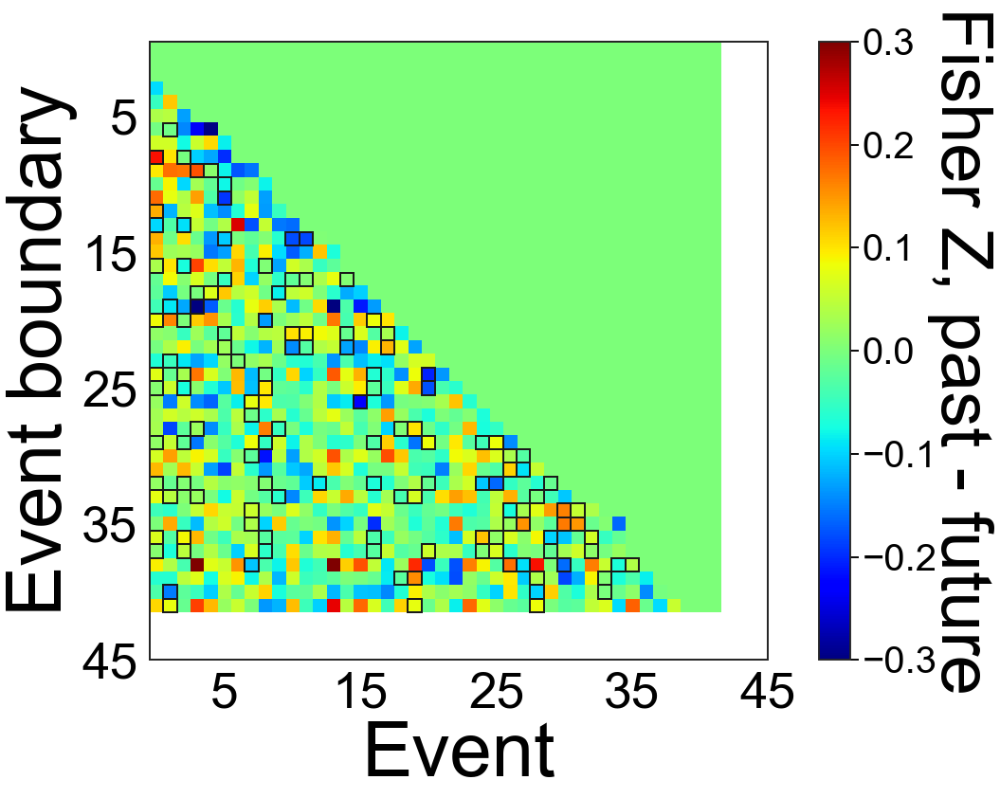

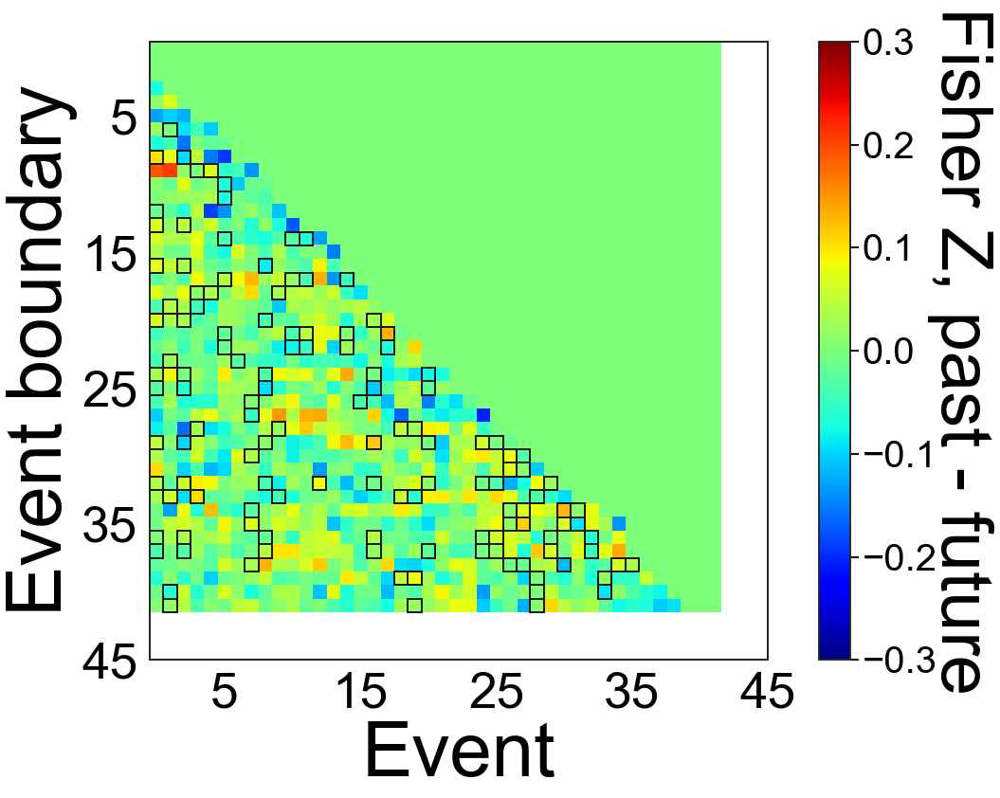

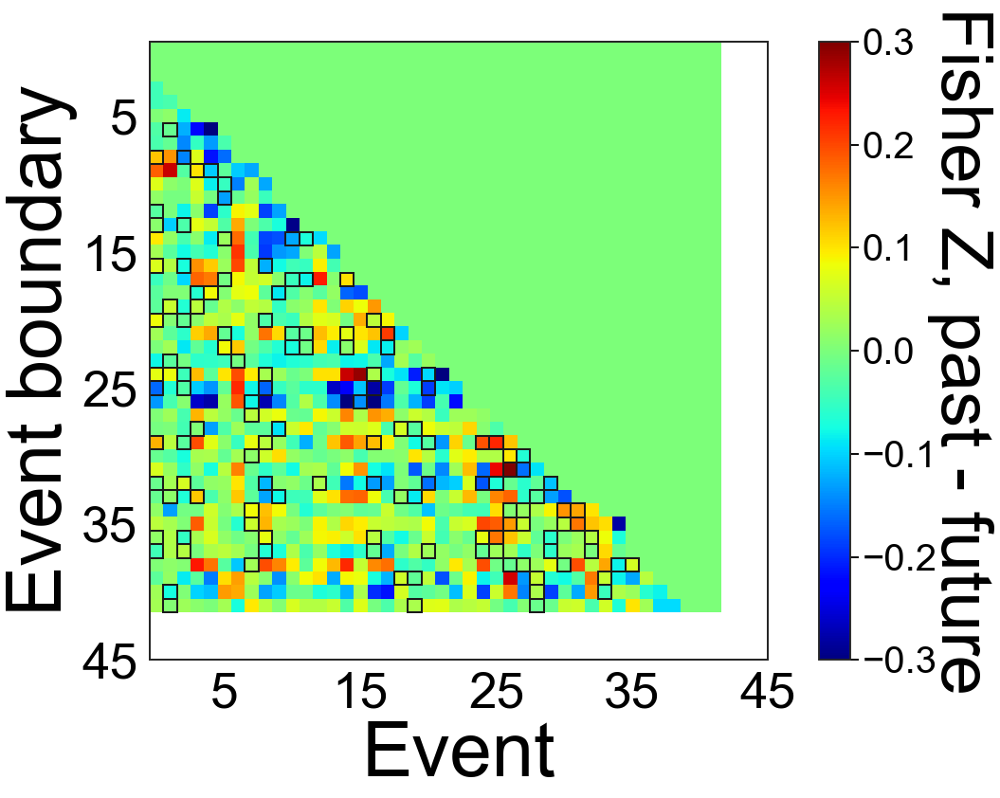

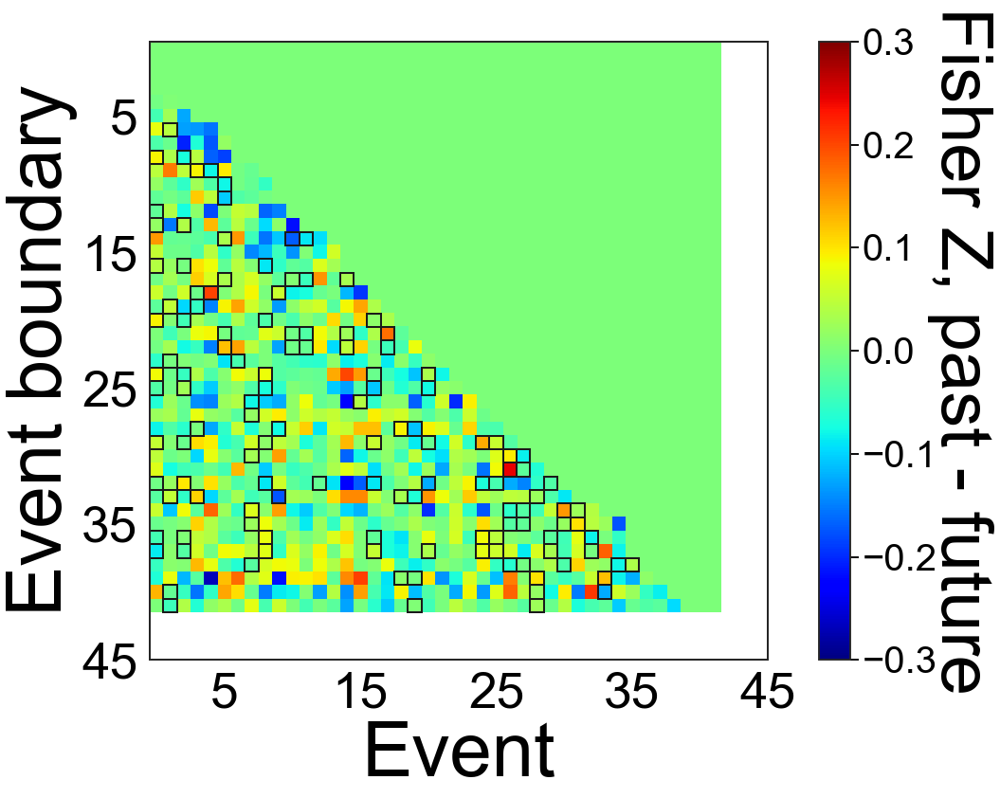

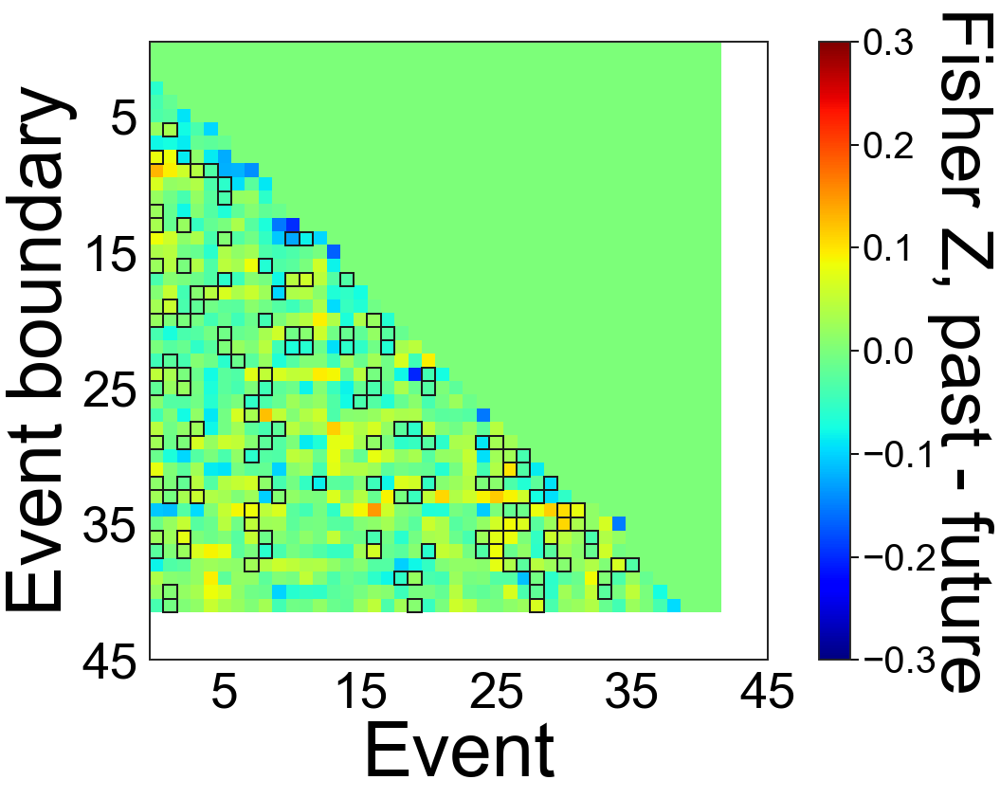

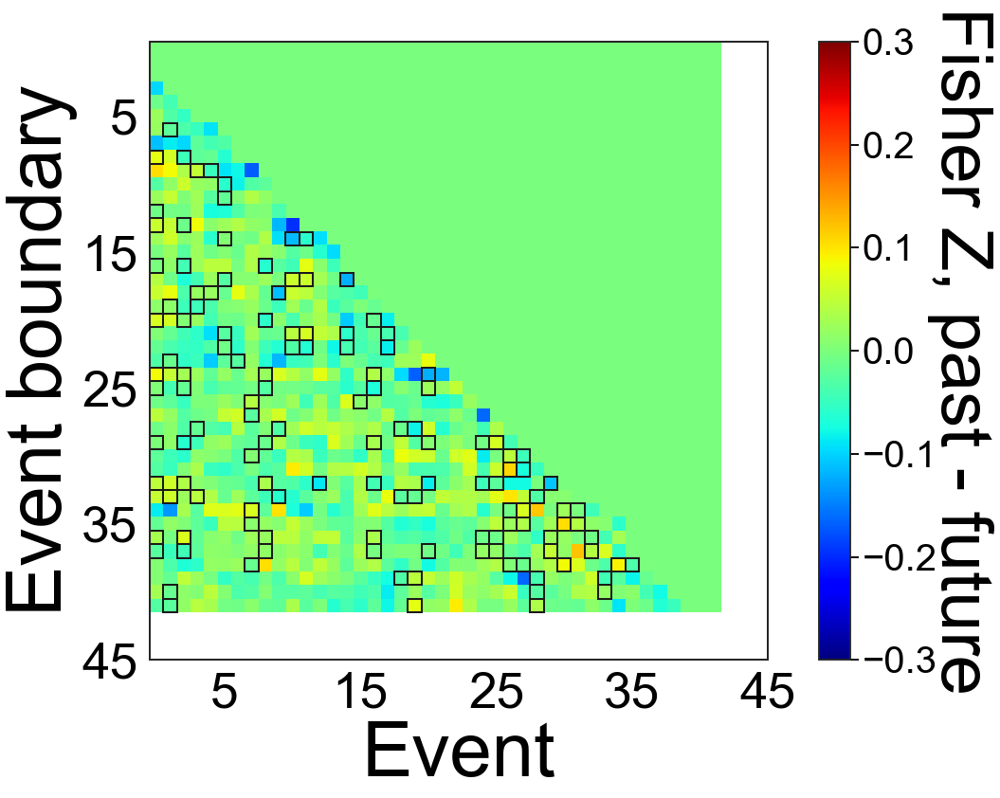

In [141]:
#plot difference matrix (past minus future)
fos=80
if gp==1:
    for roi_in in range(nbr):
        maincol,adjcol=1,4
        #maincol,adjcol=2,5
        moi_a=allexmats[roi_in][maincol]-allexmats[roi_in][adjcol]
        moi_a_m=np.mean(moi_a,axis=2)
        dat=np.zeros((n_ev,n_ev))
        for i in range(n_ev):
            for j in range(n_ev):
                if i-evcut>j:
                    dat[i,j]=moi_a_m[i,j]-moi_a_m[j,i]
                    
        print(np.nanmax(dat))
        q=np.where(np.nansum(dat,axis=0)!=0)[0]
        qq=dat[q,:]
        dat=qq[:,q]
        print('shape:',dat.shape)
        #for s in range(nS):
        f, ax = plt.subplots(1,1, figsize = (fs1*1.5,fs1*1.5)) 
        thr=0.3
        im=ax.imshow(dat, cmap='jet',vmin=-thr,vmax=thr)
        for axis in ['top','bottom','left','right']:
            ax.spines[axis].set_linewidth(lw9)
        ax.set_xticks(lin_ev[4::10])
        ax.set_yticks(lin_ev[4::10])
        ax.set_xlabel('Event',fontsize=fos,color='black')
        ax.set_ylabel('Event boundary',fontsize=fos,color='black')
        
        temp_caus2d=caus2d[q,:]
        temp_caus2d=temp_caus2d[:,q]
        
        for i in range(dat.shape[0]):
            for ii in range(dat.shape[0]):
                if i+evcut<ii:
                    if temp_caus2d[i,ii]>thr:
                        rect = patches.Rectangle(
                            (i-0.5,ii-0.5),1,1,
                            linewidth=lw9,edgecolor='k',facecolor='none')
                        ax.add_patch(rect)
        
        ax.tick_params(axis='both', which='major',labelsize=fos*2/3,colors='black')
        divider = make_axes_locatable(ax)
        cax = divider.append_axes("right", size="5%", pad=0.75) #25
        cbar=f.colorbar(im, cax=cax)
        cbar.set_label('''Fisher Z, past - future''',rotation=270,fontsize=fos-4,labelpad=lp,color='black')    
        cbar.ax.tick_params(labelsize=fos/2,colors='black') 
        f.tight_layout()
        
        fn="figs/Event_evXev-Hahamy-diff-"+str(ROIs[roi_in])+"-"+str(raw_or_srm_or_emb)+"-"+str(br_shapes[roi_in])+"-"+str(s)+".pdf"
        plt.savefig(fn, transparent=True)
        #plt.close(f)


In [142]:
def time_comp(y1,y2,l1,l2):
    print('#pts: %s, #pts: %s' %(len(y1),len(y2)))
    m1=np.mean(y1)
    m2=np.mean(y2)
    s1=np.std(y1)/np.sqrt(len(y1))
    s2=np.std(y2)/np.sqrt(len(y2))
    print('%s: %s +/- %s, %s: %s+/-%s' %(l1,m1,s1,l2,m2,s2))
    t,p=ttest_ind(abs(y1),abs(y2))
    print('t:%s,df:%s,p:%s\n' %(t,len(y1)+len(y2)-1,p))

time_comp(time_past,time_fut,'mean past','mean future') #needs subsampling
time_comp(time_past_athr,time_fut_athr_re,'mean causal past','mean causal future')
time_comp(time_past_athr,time_past_bthr,'mean causal past','mean noncausal past') #needs subsampling
time_comp(time_past_bthr,time_fut_bthr_re,'mean noncausal past','mean noncausal future')

#pts: 1225, #pts: 1225
mean past: 485.0710204081633 +/- 8.41343905499873, mean future: -460.9183673469388+/-8.42118924970409
t:2.028144655609583,df:2449,p:0.04265357113996061

#pts: 189, #pts: 189
mean causal past: 429.78306878306876 +/- 20.579071147822322, mean causal future: -403.5291005291005+/-20.480818277160356
t:0.9018596513176527,df:377,p:0.36770876289628984

#pts: 189, #pts: 1036
mean causal past: 429.78306878306876 +/- 20.579071147822322, mean noncausal past: 495.1573359073359+/-9.178124465291576
t:-2.813546798789906,df:1224,p:0.0049782763840758235

#pts: 1036, #pts: 1036
mean noncausal past: 495.1573359073359 +/- 9.178124465291576, mean noncausal future: -471.38803088803087+/-9.192679348979453
t:1.8289148373503725,df:2071,p:0.06755617157425713



In [117]:
#subsampling analysis 
def subsamp(t1,t2,dat1,dat2,pthr):
    iters=10000 #10000 for real paper - takes a few mins
    t_in,diff_n=np.zeros((iters,nbr)),np.zeros((iters,nbr))
    sig,perc=np.zeros((nbr)),np.zeros((nbr))
    for iter_n in range(iters):
        xx=0
        while xx==0:
            #sz=np.min([len(time_past_athr),len(time_past_bthr)])
            #print(sz)
            samp_ind1 = np.random.choice(len(t1), size=len(t1), replace=True)
            samp1 = abs(np.array(t1)[samp_ind1])
            samp_ind2 = np.random.choice(len(t2), size=len(t2), replace=True)
            samp2 = abs(np.array(t2)[samp_ind2])
            
            t,p=ttest_ind(samp1,samp2)
            if p>pthr:
                for roi_in in range(nbr):
                    y1,y2=np.zeros((nS)),np.zeros((nS))
                    for s in range(nS):
                        y1[s]=np.nanmean(dat1[roi_in][s][samp_ind1])
                        y2[s]=np.nanmean(dat2[roi_in][s][samp_ind2])
                    diff_n[iter_n,roi_in]=np.mean(y1-y2)
                    t_in[iter_n,roi_in],zz=ttest_rel(y1,y2)
                iter_n+=1
                xx=1

    mn,ste=np.mean(diff_n,axis=0),np.std(diff_n,axis=0)/np.sqrt(iters)
    print('mn:%s,std:%s\n' %(mn,ste))  
    for roi_in in range(nbr):
        perc[roi_in]=np.sum(diff_n[:,roi_in]>0)/iters
        #qqq=np.sum(t_in[:,roi_in]>0)/iters
        sig[roi_in]=(0.5-abs(perc[roi_in]-0.5))*2
    print("perc =",perc)
    print("p =",sig)
    return mn,ste,sig,perc

if use_other==0:
    if use_one_tr==0:
        pthr=0.5
        if gp==1:
            mn,ste,sig,perc=subsamp(time_past2,time_fut_re2,mid_off_s,mid_off_res,pthr) #all
            #mn,ste,sig=subsamp(time_past_athr,time_fut_athr_re,mid_off_athrs,mid_off_athr_res,pthr) #causal past v fut
            mn,ste,sig,perc=subsamp(time_past_athr,time_past_bthr,mid_off_athrs,mid_off_bthrs,pthr) #past causal v noncausal
        elif gp==4:
            mn,ste,sig,perc=subsamp(time_past2,time_fut_re2,mid_off_s,mid_off_res,pthr) #all
            mn,ste,sig,perc=subsamp(time_past_athr,time_past_bthr,mid_off_athrs,mid_off_bthrs,pthr)

In [118]:
def rearr_plots(dat,yl0,fn):
    fs1=10
    fos=50
    elw=3
    thr=0.05
    mx=np.max(dat)
    xt=np.arange(0,nbr,step=1) # set ticks for x-axis

    vl=np.where(np.diff(yeo_n_r)==1)[0]+0.5
    vlp=np.hstack([0,vl])
    vlp=np.hstack([vlp,nbr])-0.5 #padded version
    ym=np.mean(dat,axis=0) #avg x-subs AND x-boundaries for ROI
    ys=np.zeros((nbr))
    for parcel in range(nbr):
        ys[parcel]=np.std(dat[:,parcel])/np.sqrt(nS)

    #so tvals and pvals ARE in rearranged order!!!!
    tvals,pvals=np.zeros((nbr)),np.zeros((nbr))
    for i in range(nbr):
        tvals[i],pvals[i]=ttest_1samp(dat[:,qq_yeo[i]],0)
        
    unc=np.where(np.logical_and(pvals<thr,tvals>0))[0]
    print('unc:',ROIs[qq_yeo[unc]])
    qvals=fdrcorrection(pvals,method='indep')[1] #FDR correction
    indp=np.where(np.logical_and(qvals<thr,tvals>0))[0]
    indn=np.where(np.logical_and(qvals<thr,tvals<0))[0]
    qb=np.where(qvals<thr)[0]
    qa=np.where(qvals>=thr)[0]
    print('corr, below threshold, all: %s' %(qb))
    print('corr, below threshold, all: %s' %(ROIs[qq_yeo[qb]]))
    
    #def_only=np.where(np.logical_and(yeo_n_r>12,yeo_n_r<16))[0]
    def_only=np.where(yeo_n_r>5)[0]
    print('pvals def only:',pvals[def_only])
    qvals_do=fdrcorrection(pvals[def_only],method='indep')[1] #FDR correction
    print('qvals def only:',qvals_do)
    indp_do_do=np.where(np.logical_and(qvals_do<thr,tvals[def_only]>0))[0]
    indn_do=np.where(np.logical_and(qvals_do<thr,tvals[def_only]<0))[0]
    qb_do=np.where(qvals_do<thr)[0]
    qa_do=np.where(qvals_do>=thr)[0]
    print('corr, below & above: def only, %s' %(qb_do))
    print('corr, below & above: def only: %s' %(ROIs[qq_yeo[def_only[qb_do]]]))
    
    f, ax = plt.subplots(figsize = (fs1*1.3,fs1*1.3))
    ax.set_xlabel('Parcel, re-arranged by network',fontsize=fos,color='black')
    ax.set_ylabel(yl0, fontsize = fos,color='black')
    #ax.plot(xt,ym[qq_yeo],color='k')
    ax.errorbar(xt[qa],ym[qq_yeo[qa]],ys[qq_yeo[qa]],color='darkgray',fmt='o',linestyle='',elinewidth=elw)
    #ax.errorbar(xt[def_only[qb_do]],ym[qq_yeo[def_only[qb_do]]],ys[qq_yeo[def_only[qb_do]]],
    #            color='dimgray',fmt='o',linestyle='',elinewidth=elw)
    ax.errorbar(xt[unc],ym[qq_yeo[unc]],ys[qq_yeo[unc]],color='dimgray',fmt='o',linestyle='',elinewidth=elw)
    if len(qb)>0:
        ax.errorbar(xt[qb],ym[qq_yeo[qb]],ys[qq_yeo[qb]],color='k',fmt='o',linestyle='',elinewidth=elw)
    
    #ax.plot(xt[def_only[qb_do]],corrr[qq[def_only[qb_do]]],'o',color='darkgray',linewidth=2,markersize=8)
    xl1, xl2 = plt.xlim()
    yl1, yl2 = plt.ylim()
    plt.hlines(0,xl1,xl2,color='black',linewidth=2,linestyle='dashed')
    plt.vlines(vlp,yl1,yl2,color='black',linewidth=2,linestyle='dashed')
    plt.xlim(-1,nbr)
    ax.tick_params(axis='both', which='major', labelsize=fos*2/3,colors='black')
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False) 
    for axis in ['bottom','left']:
        ax.spines[axis].set_linewidth(4)
    for i in range(len(vlp)-1):
        half=(vlp[i+1]-vlp[i])//2
        #ax.text(vlp[i]+half,np.max(ym)+np.max(ym)*0.35,yeo_nn[i],fontsize=fos*3/5,ha='center',rotation=90)
        ax.text(vlp[i]+half,yl2,yeo_nn[i],fontsize=fos*3/5,ha='center',rotation=90)
    f.tight_layout()
    plt.savefig(fn, transparent=True)
    #return ym[qq]

# plot event similarity results (Fig 3)

causal:
V1: Ttest_1sampResult(statistic=0.5308256922359, pvalue=0.6008578538329052)
vmPFC: Ttest_1sampResult(statistic=2.0692859108856916, pvalue=0.05046617229567294)
ang: Ttest_1sampResult(statistic=2.1341806589615, pvalue=0.044220571092066036)
PMC: Ttest_1sampResult(statistic=2.0760077032741773, pvalue=0.049784384919848504)
postHC: Ttest_1sampResult(statistic=-1.2356680518358107, pvalue=0.229614538351911)
antHC: Ttest_1sampResult(statistic=0.005809279103466442, pvalue=0.9954172487894661)


tcausal:
V1: Ttest_1sampResult(statistic=0.4282240996571393, pvalue=0.6726511919875804)
vmPFC: Ttest_1sampResult(statistic=2.3995986151387343, pvalue=0.02531790618051012)
ang: Ttest_1sampResult(statistic=2.2854167085258768, pvalue=0.03228778548381663)
PMC: Ttest_1sampResult(statistic=3.632478873681221, pvalue=0.0014715887174087262)
postHC: Ttest_1sampResult(statistic=-0.8656290082566108, pvalue=0.39603557194054273)
antHC: Ttest_1sampResult(statistic=0.5732350232666698, pvalue=0.5722990572418846)




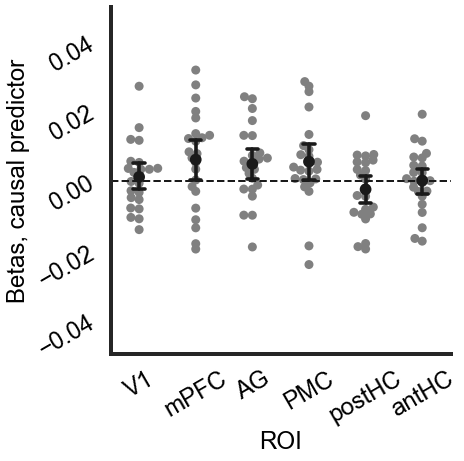

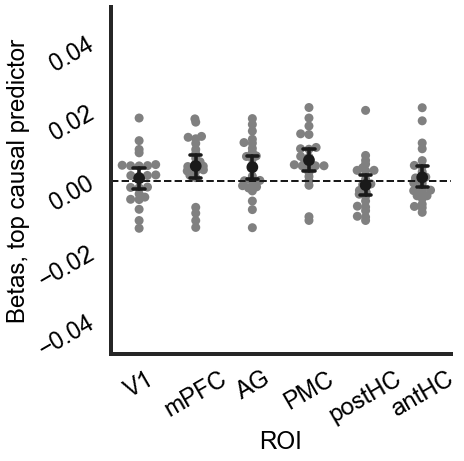

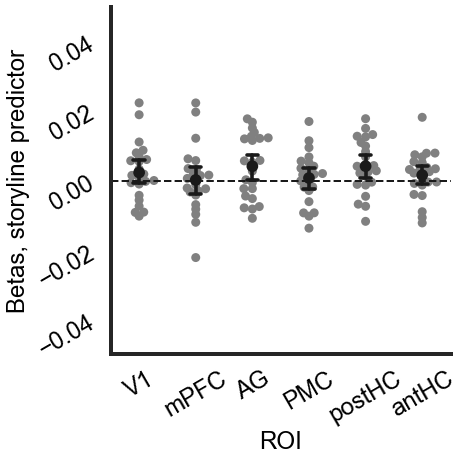

In [119]:
ccol,scol=5,1 #causal column, storyline column
ystr1,fn1='Betas, causal predictor','figs/causal_model_betas-'+str(gp)+'.pdf' 
ystr2,fn2='Betas, top causal predictor','figs/tcausal_model_betas-'+str(gp)+'.pdf' 
ystr3,fn3='Betas, storyline predictor','figs/storyline_model_betas-'+str(gp)+'.pdf'    
ystr4,fn4='''Betas, causal predictor''','figs/causal_model_nostoryline_betas-'+str(gp)+'.pdf' 
ystr5,fn5='''Betas, top causal predictor''','figs/tcausal_model_nostoryline_betas-'+str(gp)+'.pdf' 
if gp==4:
    print('causal:')
    dat=np.zeros((nS,nbr))
    for i in range(nbr):
        dat[:,i]=betas_red_a[i][:,ccol]
    rearr_plots(dat,ystr1,fn1)
    print('\ntcausal:')
    dat=np.zeros((nS,nbr))
    for i in range(nbr):
        dat[:,i]=betas_redt_a[i][:,ccol]
    rearr_plots(dat,ystr2,fn2)
    print('\nstoryline:')
    dat=np.zeros((nS,nbr))
    for i in range(nbr):
        dat[:,i]=betas_red_a[i][:,scol]
    rearr_plots(dat,ystr3,fn3)

    print('\ncausal, no storyline:')
    dat=np.zeros((nS,nbr))
    for i in range(nbr):
        dat[:,i]=betas_red3_a[i][:,ccol-1]
    rearr_plots(dat,ystr4,fn4)
    
    print('\ntcausal, no storyline:')
    dat=np.zeros((nS,nbr))
    for i in range(nbr):
        dat[:,i]=betas_red3t_a[i][:,ccol-1]
    rearr_plots(dat,ystr5,fn5)
    
    labs=['time','storyline','character','place','semantic','causal']
    labs2=['time','storyline','character','place','semantic','top causal']
    for ii in range(6):
        ystr1,fn1='Betas, '+labs[ii]+' predictor','figs/model1_betas-'+str(gp)+'-'+str(ii)+'.pdf'
        print(str(labs[ii])+':')
        dat=np.zeros((nS,nbr))
        for i in range(nbr):
            dat[:,i]=betas_red_a[i][:,ii]
        rearr_plots(dat,ystr1,fn1)
        
        ystr1,fn1='Betas, '+labs2[ii]+' predictor','figs/model2_betas-'+str(gp)+'-'+str(ii)+'.pdf'
        print(str(labs[ii])+':')
        dat=np.zeros((nS,nbr))
        for i in range(nbr):
            dat[:,i]=betas_redt_a[i][:,ii]
        rearr_plots(dat,ystr1,fn1)
    
else:
    barswarm(betas_red_a[0][:,ccol],betas_red_a[1][:,ccol],
         betas_red_a[2][:,ccol],betas_red_a[3][:,ccol],
         betas_red_a[4][:,ccol],betas_red_a[5][:,ccol],[],[],ystr1,ystr1,fn1,6) 

    nc=nbr+0
    print('causal:')
    for i in range(nc):
        res=ttest_1samp(betas_red_a[i][:,ccol],0)
        print('%s: %s' %(ROIs[roi_set[i]],res))
    print('\n')

    barswarm(betas_redt_a[0][:,ccol],betas_redt_a[1][:,ccol],
             betas_redt_a[2][:,ccol],betas_redt_a[3][:,ccol],
             betas_redt_a[4][:,ccol],betas_redt_a[5][:,ccol],[],[],ystr2,ystr2,fn2,6)

    print('tcausal:')
    for i in range(nc):
        res=ttest_1samp(betas_redt_a[i][:,ccol],0)
        print('%s: %s' %(ROIs[roi_set[i]],res))
    print('\n')

    #add storyline betas, for reference
    barswarm(betas_red_a[0][:,scol],betas_red_a[1][:,scol],
             betas_red_a[2][:,scol],betas_red_a[3][:,scol],
             betas_red_a[4][:,scol],betas_red_a[5][:,scol],[],[],ystr3,ystr3,fn3,6) 

    print('storyline:')
    for i in range(nc):
        res=ttest_1samp(betas_red_a[i][:,scol],0)
        print('%s: %s' %(ROIs[roi_set[i]],res))
    print('\n')
    

Model1
time
V1: Ttest_1sampResult(statistic=12.704205881979417, pvalue=1.3196145201189813e-11)
vmPFC: Ttest_1sampResult(statistic=17.069858989926434, pvalue=3.549020572541319e-14)
ang: Ttest_1sampResult(statistic=16.736849678921885, pvalue=5.314268636875559e-14)
PMC: Ttest_1sampResult(statistic=10.980792639594494, pvalue=2.1429862357123823e-10)
postHC: Ttest_1sampResult(statistic=12.37033078662152, pvalue=2.2128057701575536e-11)
antHC: Ttest_1sampResult(statistic=11.84405477925656, pvalue=5.108801531138386e-11)
Model2
time
V1: Ttest_1sampResult(statistic=12.669544353512064, pvalue=1.3916861113293157e-11)
vmPFC: Ttest_1sampResult(statistic=17.141003007903592, pvalue=3.258620512366297e-14)
ang: Ttest_1sampResult(statistic=16.679106488152502, pvalue=5.703635576753901e-14)
PMC: Ttest_1sampResult(statistic=10.924818416693054, pvalue=2.3582607038265925e-10)
postHC: Ttest_1sampResult(statistic=12.358558510922448, pvalue=2.2539432407259356e-11)
antHC: Ttest_1sampResult(statistic=11.87071349062

Model_co, causal
V1: Ttest_1sampResult(statistic=1.2736649552060457, pvalue=0.21607480416018182)
vmPFC: Ttest_1sampResult(statistic=2.6742706131845475, pvalue=0.013854678108851196)
ang: Ttest_1sampResult(statistic=3.901339858822951, pvalue=0.0007669475049937455)
PMC: Ttest_1sampResult(statistic=3.387807290930758, pvalue=0.0026472047707701515)
postHC: Ttest_1sampResult(statistic=-0.2759168591955895, pvalue=0.7851871567908865)
antHC: Ttest_1sampResult(statistic=0.10448717659090993, pvalue=0.9177294923331476)


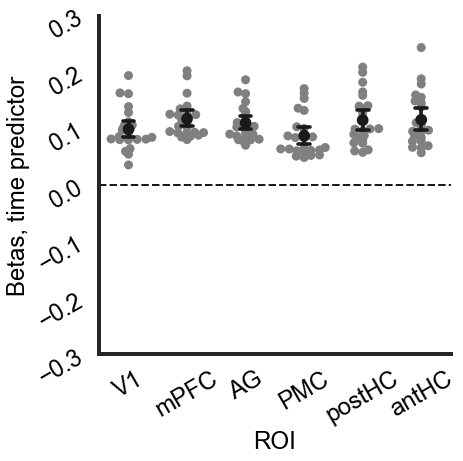

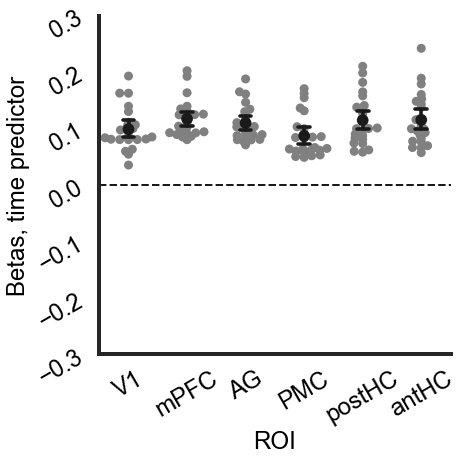

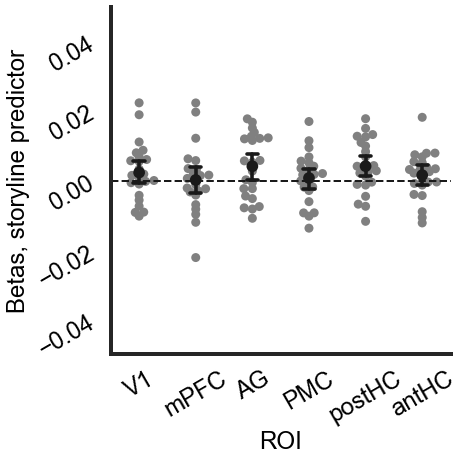

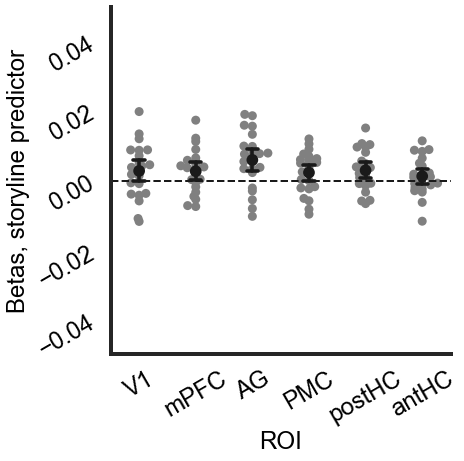

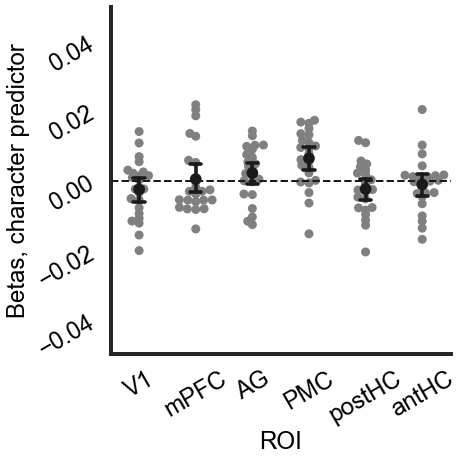

...

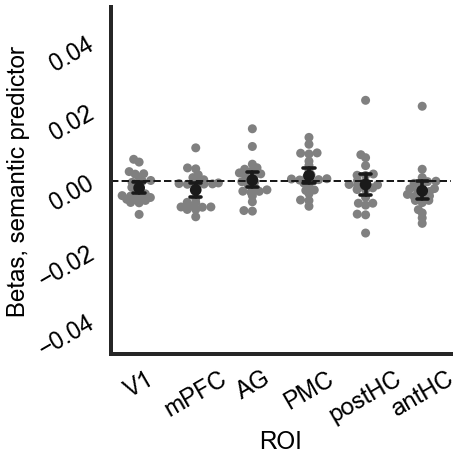

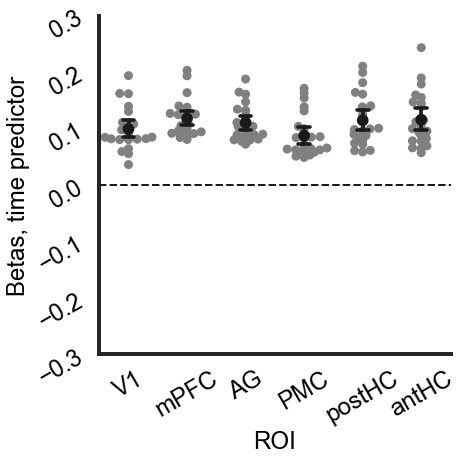

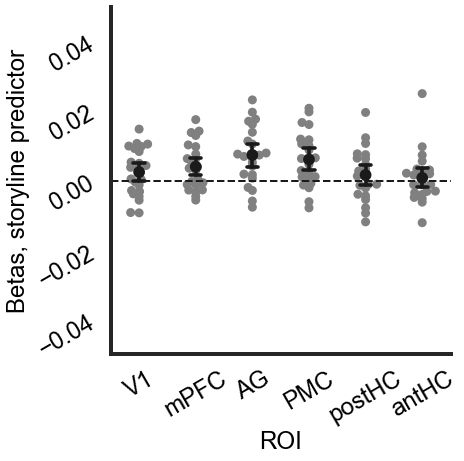

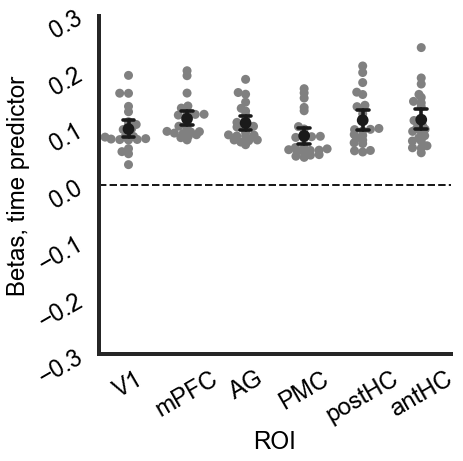

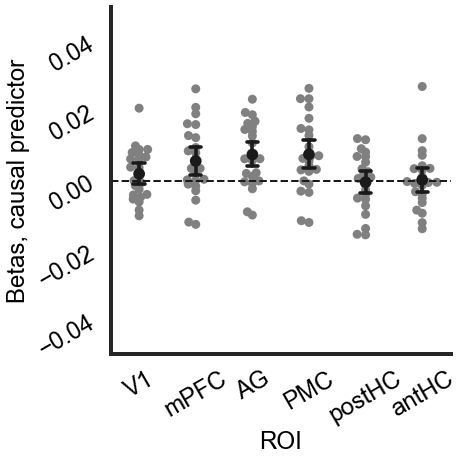

In [120]:
if gp==1:
    labs=['time','storyline','character','place','semantic','causal']
    labs2=['time','storyline','character','place','semantic','top causal']
    for ii in range(6):
        ystr1,fn1='Betas, '+labs[ii]+' predictor','figs/model1_betas-'+str(gp)+'-'+str(ii)+'.pdf'
        if ii==0:
            barswarm(betas_red_a[0][:,ii],betas_red_a[1][:,ii],
                betas_red_a[2][:,ii],betas_red_a[3][:,ii],
                betas_red_a[4][:,ii],betas_red_a[5][:,ii],[],[],ystr1,ystr1,fn1,7) 
        else:
            barswarm(betas_red_a[0][:,ii],betas_red_a[1][:,ii],
                betas_red_a[2][:,ii],betas_red_a[3][:,ii],
                betas_red_a[4][:,ii],betas_red_a[5][:,ii],[],[],ystr1,ystr1,fn1,6) 
            
        print('Model1')
        print(labs[ii])
        for i in range(nc):
            res=ttest_1samp(betas_red_a[i][:,ii],0)
            print('%s: %s' %(ROIs[roi_set[i]],res))
        
        ystr1,fn1='Betas, '+labs2[ii]+' predictor','figs/model2_betas-'+str(gp)+'-'+str(ii)+'.pdf'
        if ii==0:
            barswarm(betas_redt_a[0][:,ii],betas_redt_a[1][:,ii],
                betas_redt_a[2][:,ii],betas_redt_a[3][:,ii],
                betas_redt_a[4][:,ii],betas_redt_a[5][:,ii],[],[],ystr1,ystr1,fn1,7) 
        else:
            barswarm(betas_redt_a[0][:,ii],betas_redt_a[1][:,ii],
                betas_redt_a[2][:,ii],betas_redt_a[3][:,ii],
                betas_redt_a[4][:,ii],betas_redt_a[5][:,ii],[],[],ystr1,ystr1,fn1,6)
            
        print('Model2')
        print(labs2[ii])
        for i in range(nc):
            res=ttest_1samp(betas_redt_a[i][:,ii],0)
            print('%s: %s' %(ROIs[roi_set[i]],res))
            
    #results from other models w/ fewer predictors
    ystr1,fn1='Betas, time predictor','figs/model_sem_betas_time-'+str(gp)+'.pdf'
    secol=0
    barswarm(betas_sem_solo_a[0][:,secol],betas_sem_solo_a[1][:,secol],
        betas_sem_solo_a[2][:,secol],betas_sem_solo_a[3][:,secol],
        betas_sem_solo_a[4][:,secol],betas_sem_solo_a[5][:,secol],[],[],ystr1,ystr1,fn1,7) 
    print('Model_sem, time')
    for i in range(nc):
        res=ttest_1samp(betas_sem_solo_a[i][:,secol],0)
        print('%s: %s' %(ROIs[roi_set[i]],res))
        
    ystr1,fn1='Betas, semantic predictor','figs/model_sem_betas_sem-'+str(gp)+'.pdf'
    secol=1
    barswarm(betas_sem_solo_a[0][:,secol],betas_sem_solo_a[1][:,secol],
        betas_sem_solo_a[2][:,secol],betas_sem_solo_a[3][:,secol],
        betas_sem_solo_a[4][:,secol],betas_sem_solo_a[5][:,secol],[],[],ystr1,ystr1,fn1,6) 
    print('Model_sem, sem')
    for i in range(nc):
        res=ttest_1samp(betas_sem_solo_a[i][:,secol],0)
        print('%s: %s' %(ROIs[roi_set[i]],res))
        
    ystr1,fn1='Betas, time predictor','figs/model_so_betas_time-'+str(gp)+'.pdf'
    secol=0
    barswarm(betas_so_a[0][:,secol],betas_so_a[1][:,secol],
        betas_so_a[2][:,secol],betas_so_a[3][:,secol],
        betas_so_a[4][:,secol],betas_so_a[5][:,secol],[],[],ystr1,ystr1,fn1,7) 
    print('Model_so, time')
    for i in range(nc):
        res=ttest_1samp(betas_so_a[i][:,secol],0)
        print('%s: %s' %(ROIs[roi_set[i]],res))
        
    ystr1,fn1='Betas, storyline predictor','figs/model_so_betas_so-'+str(gp)+'.pdf'
    secol=1
    barswarm(betas_so_a[0][:,secol],betas_so_a[1][:,secol],
        betas_so_a[2][:,secol],betas_so_a[3][:,secol],
        betas_so_a[4][:,secol],betas_so_a[5][:,secol],[],[],ystr1,ystr1,fn1,6) 
    print('Model_so, storyline')
    for i in range(nc):
        res=ttest_1samp(betas_so_a[i][:,secol],0)
        print('%s: %s' %(ROIs[roi_set[i]],res))
        
    ystr1,fn1='Betas, time predictor','figs/model_co_betas_time-'+str(gp)+'.pdf'
    secol=0
    barswarm(betas_co_a[0][:,secol],betas_co_a[1][:,secol],
        betas_co_a[2][:,secol],betas_co_a[3][:,secol],
        betas_co_a[4][:,secol],betas_co_a[5][:,secol],[],[],ystr1,ystr1,fn1,7) 
    print('Model_co, time')
    for i in range(nc):
        res=ttest_1samp(betas_co_a[i][:,secol],0)
        print('%s: %s' %(ROIs[roi_set[i]],res))
        
    ystr1,fn1='Betas, causal predictor','figs/model_co_betas_so-'+str(gp)+'.pdf'
    secol=1
    barswarm(betas_co_a[0][:,secol],betas_co_a[1][:,secol],
        betas_co_a[2][:,secol],betas_co_a[3][:,secol],
        betas_co_a[4][:,secol],betas_co_a[5][:,secol],[],[],ystr1,ystr1,fn1,6) 
    print('Model_co, causal')
    for i in range(nc):
        res=ttest_1samp(betas_co_a[i][:,secol],0)
        print('%s: %s' %(ROIs[roi_set[i]],res))

# plot boundary-middle match results (Fig 4)

causal past - causal future
V1: Ttest_relResult(statistic=0.14601762254105308, pvalue=0.8852371557891117)
vmPFC: Ttest_relResult(statistic=2.3441857464414864, pvalue=0.02850601572310244)
ang: Ttest_relResult(statistic=3.3018005946768367, pvalue=0.003248169662460037)
PMC: Ttest_relResult(statistic=2.420372888737687, pvalue=0.024210102687733832)
postHC: Ttest_relResult(statistic=1.1990244009073752, pvalue=0.2432742314568248)
antHC: Ttest_relResult(statistic=0.06626673460403472, pvalue=0.9477639913558831)
causal - noncausal past
V1: Ttest_relResult(statistic=2.0483515172903295, pvalue=0.05264340952172862)
vmPFC: Ttest_relResult(statistic=1.605620927292189, pvalue=0.12261703640694234)
ang: Ttest_relResult(statistic=0.8566947434365664, pvalue=0.4008493308157647)
PMC: Ttest_relResult(statistic=2.940087344312073, pvalue=0.0075739317661001155)
postHC: Ttest_relResult(statistic=0.21183352264756383, pvalue=0.8341871226829605)
antHC: Ttest_relResult(statistic=0.042603647613571764, pvalue=0.966401

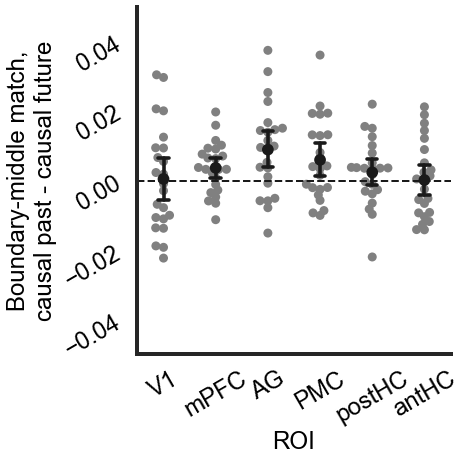

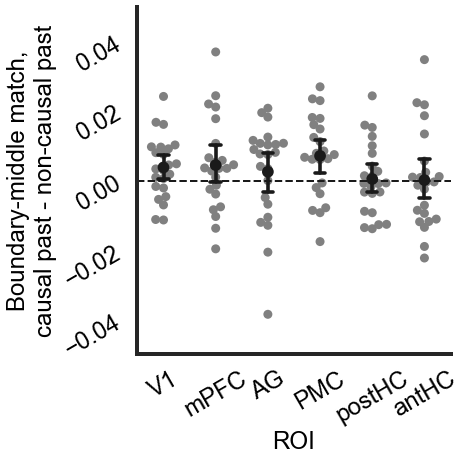

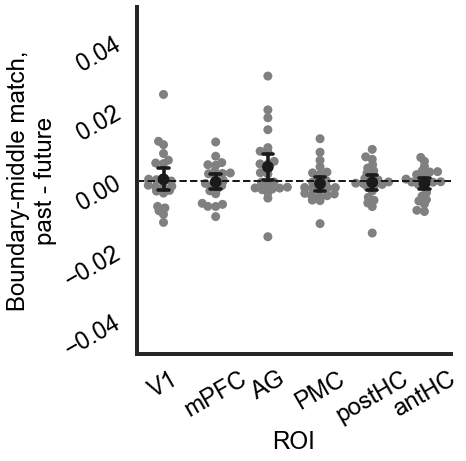

In [121]:
#causal only
col,col_rev=0,1 #all, reverse all
ccol,ccol_rev=2,3 #causal, reverse causal
ncol,ncol_rev=4,5 #non-causal, reverse non-causal
ystr1='''Boundary-middle match,
causal past - causal future'''
fn1='figs/hahamy_diff_causal_pastVfuture-'+str(gp)+'.pdf'    
ystr2='''Boundary-middle match,
causal past - non-causal past'''
fn2='figs/hahamy_diff_past_causalVnoncausal-'+str(gp)+'.pdf'    
ystr3='''Boundary-middle match,
past - future'''
fn3='figs/hahamy_diff_all_pastVfuture-'+str(gp)+'.pdf'    

if gp==4:
    print('causal past - causal future')
    dat=np.zeros((nS,nbr))
    for i in range(nbr):
        dat[:,i]=allmos[i][ccol]-allmos[i][ccol_rev]
    rearr_plots(dat,ystr1,fn1)
    print('causal - noncausal past')
    dat=np.zeros((nS,nbr))
    for i in range(nbr):
        dat[:,i]=allmos[i][ccol]-allmos[i][ncol]
    rearr_plots(dat,ystr2,fn2)
    print('all')
    dat=np.zeros((nS,nbr))
    for i in range(nbr):
        dat[:,i]=allmos[i][col]-allmos[i][col_rev]
    rearr_plots(dat,ystr3,fn3)
    
else:
    barswarm(allmos[0][ccol]-allmos[0][ccol_rev],
         allmos[1][ccol]-allmos[1][ccol_rev],
         allmos[2][ccol]-allmos[2][ccol_rev],
         allmos[3][ccol]-allmos[3][ccol_rev],
         allmos[4][ccol]-allmos[4][ccol_rev],
         allmos[5][ccol]-allmos[5][ccol_rev],[],[],ystr1,ystr1,fn1,6) 

    #significance of Hahamy results...
    print('causal past - causal future')
    for i in range(nc):
        res=ttest_rel(allmos[i][ccol],allmos[i][ccol_rev])
        print('%s: %s' %(ROIs[roi_set[i]],res))

    # causal past minus non-causal past
    barswarm(allmos[0][ccol]-allmos[0][ncol],
             allmos[1][ccol]-allmos[1][ncol],
             allmos[2][ccol]-allmos[2][ncol],
             allmos[3][ccol]-allmos[3][ncol],
             allmos[4][ccol]-allmos[4][ncol],
             allmos[5][ccol]-allmos[5][ncol],[],[],ystr2,ystr2,fn2,6) 

    #significance of Hahamy results...
    print('causal - noncausal past')
    for i in range(nc):
        res=ttest_rel(allmos[i][ccol],allmos[i][ncol])
        print('%s: %s' %(ROIs[roi_set[i]],res))

    #all events
    barswarm(allmos[0][col]-allmos[0][col_rev],
             allmos[1][col]-allmos[1][col_rev],
             allmos[2][col]-allmos[2][col_rev],
             allmos[3][col]-allmos[3][col_rev],
             allmos[4][col]-allmos[4][col_rev],
             allmos[5][col]-allmos[5][col_rev],[],[],ystr3,ystr3,fn3,6) 

    #significance of Hahamy results...
    print('all')
    for i in range(nc):
        res=ttest_rel(allmos[i][col],allmos[i][col_rev])
        print('%s: %s' %(ROIs[roi_set[i]],res))

In [122]:
if gp==4:
    with open('pydata/allbetas-%s.npy' %gp, 'wb') as file:
        pickle.dump(allbetas, file)
    with open('pydata/betas_red_a-%s.npy' %gp, 'wb') as file:
        pickle.dump(betas_red_a, file)
    with open('pydata/allexmats-%s.npy' %gp, 'wb') as file:
        pickle.dump(allexmats, file)
    with open('pydata/allmos-%s.npy' %gp, 'wb') as file:
        pickle.dump(allmos, file)

# plot pattern change across event boundaries - Fig 5F

[-6 -5 -4 -3 -2 -1  0  1  2  3  4]
late, STch: 0.10578191510200066, no STch: 0.10990400696564509
t: -0.7828766334923852, p: 0.4420458622695671
late, STch: 0.1730701113927416, no STch: 0.18887335033629468
t: -2.215257956445481, p: 0.0374012637797486
late, STch: 0.17284630557818592, no STch: 0.20156612719665662
t: -3.513479846555214, p: 0.001959668666982571
late, STch: 0.08833487164401231, no STch: 0.10612051319343642
t: -4.064014273485662, p: 0.0005159699449253967
late, STch: 0.10556746964299768, no STch: 0.10881509777052542
t: -0.678944263279851, p: 0.504253776754966
late, STch: 0.10018096353747208, no STch: 0.10824562295532116
t: -1.4184473103524031, p: 0.17007157125259822


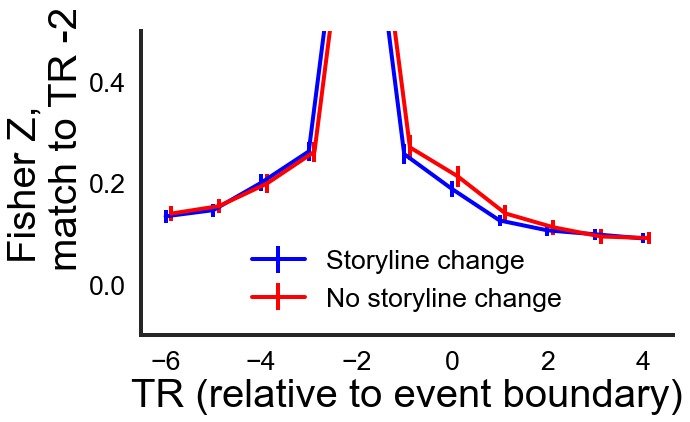

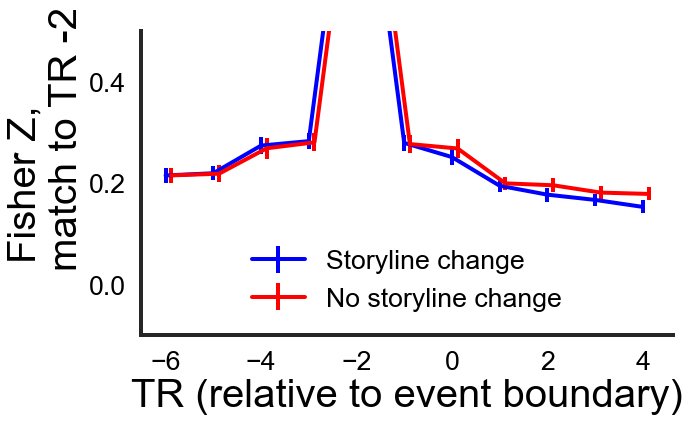

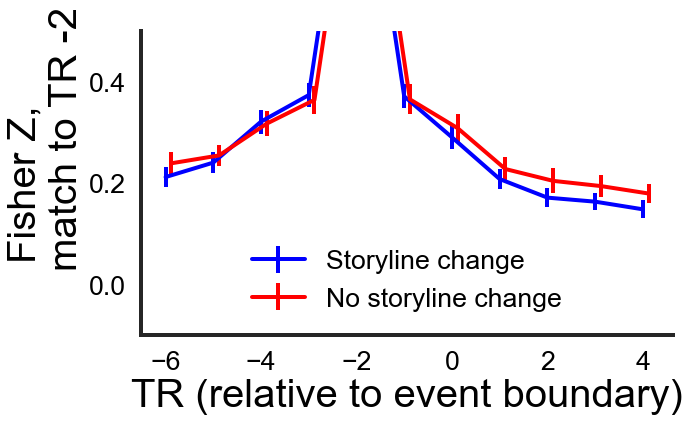

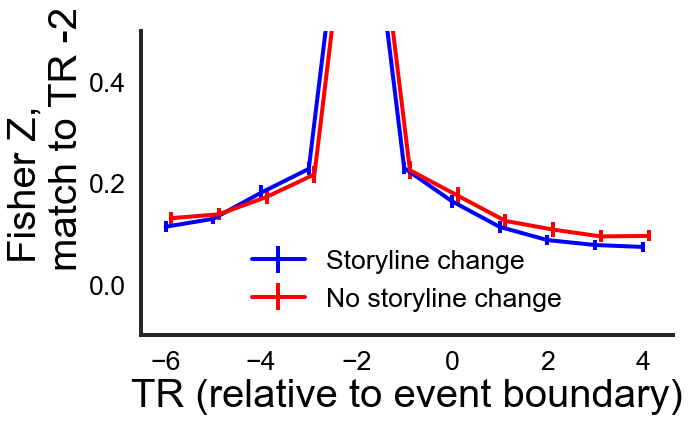

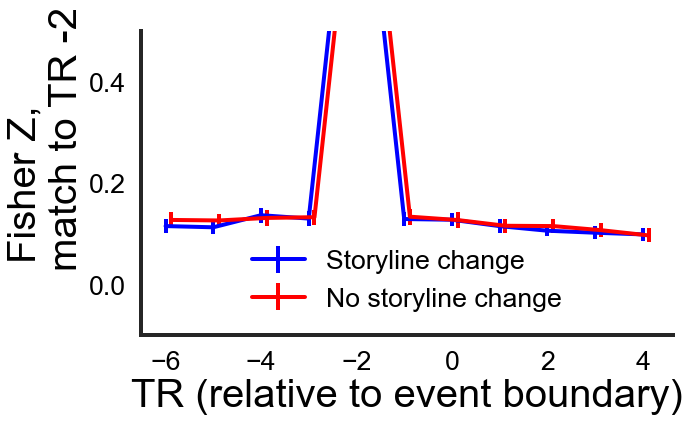

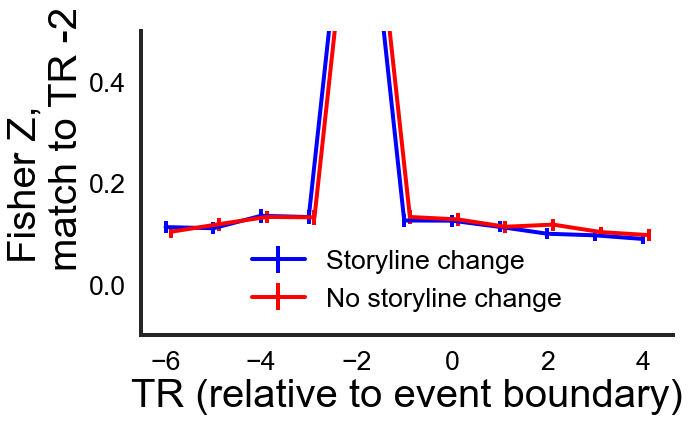

In [123]:
def fishr2z(d,d2):
    rval=pearsonr(d,d2)[0]
    d=np.multiply((np.log(1+rval)-np.log(1-rval)),0.5)
    return d

if gp==1:
    emchange=np.load('pydata/emchange.npy')                          #change in storyline or not
    modeltr=-2
    rge=4
    ls=np.linspace(-rge+modeltr,rge,rge*2+abs(modeltr)+1).astype(int)
    nls=len(ls)
    print(ls)
    n_ch,n_noch=int(np.sum(emchange)),int(n_ev-np.sum(emchange))
    for roi_in in range(nbr):
        if roi_in==0:
            bold=bold_roi_a0+0
        elif roi_in==1:
            bold=bold_roi_a1+0
        elif roi_in==2:
            bold=bold_roi_a2+0
        elif roi_in==3:
            bold=bold_roi_a3+0
        elif roi_in==4:
            bold=bold_roi_a4+0
        elif roi_in==5:
            bold=bold_roi_a5+0
        match_ch=np.zeros((nS,nls,n_ch))
        match_noch=np.zeros((nS,nls,n_noch))
        for s in range(nS):
            j,jj=0,0
            for ev in range(n_ev): 
                las=all_edges_tr[ev] #boundary TR
                model=bold[s,las+modeltr,:] #bold_roi_a
                match=np.zeros((nls))
                for pt in range(nls):
                    curr_pat=bold[s,las+ls[pt],:] #bold_roi_a
                    match[pt]=fishr2z(curr_pat,model)
                    if pt==4:
                        match[pt]=1
                if emchange[ev]==1: #two types of events for this analysis
                    match_ch[s,:,j]=match+0
                    j+=1
                elif emchange[ev]==0: #no event change
                    match_noch[s,:,jj]=match+0
                    jj+=1

        fos,lw=40,4
        y_sub=np.nanmean(match_ch,axis=2) #every subject's mean
        y,err=np.nanmean(y_sub,axis=0),np.zeros((nls))
        for i in range(nls):
            err[i]=np.nanstd(y_sub[:,i])/np.sqrt(nS)
        f, ax = plt.subplots(1,1,figsize = (fs1,fs2))
        ax.errorbar(ls,y,err,color='blue',linewidth=lw9*2, label='Storyline change')
        y_early1,y_late1=np.nanmean(y_sub[:4,:],axis=1),np.nanmean(y_sub[:,-4:],axis=1)
        y_sub=np.nanmean(match_noch,axis=2) #every subject's mean
        y,err=np.nanmean(y_sub,axis=0),np.zeros((nls))
        y_early2,y_late2=np.nanmean(y_sub[:4,:],axis=1),np.nanmean(y_sub[:,-4:],axis=1)
        for i in range(nls):
            err[i]=np.nanstd(y_sub[:,i])/np.sqrt(nS)
        ax.errorbar(ls+0.12,y,err,color='red',linewidth=lw9*2, label='No storyline change')
        ax.tick_params(axis='both', which='major',labelsize=fos*1/2,
                       direction='out',length=lw*3,width=lw/2,color='black')
        for axis in ['bottom','left']:
            ax.spines[axis].set_linewidth(lw)
        ax.set_xlabel('TR (relative to event boundary)',fontsize=fos,color='black')
        ax.set_ylabel('''Fisher Z,
        match to TR -2''',fontsize=fos,color='black')
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)
        ax.set_ylim([-0.1,0.5])
        ax.tick_params(axis='both', which='major',labelsize=fos*2/3,colors='black')
        leg=ax.legend(loc='lower center',frameon=False,fontsize=fos*2/3)
        for text in leg.get_texts():
            text.set_color('black')
        f.tight_layout()
        fn='figs/match_STvsnoST-'+str(gp)+'-'+str(roin)+'.pdf'
        plt.savefig(fn, transparent=True)

        #get some stats 
        tval,pval=ttest_rel(y_early1,y_early2)
        #print('early, STch: %s, no STch: %s' %(np.mean(y_early1),np.mean(y_early2)))
        #print('t: %s, p: %s' %(tval,pval))
        tval,pval=ttest_rel(y_late1,y_late2)
        print('late, STch: %s, no STch: %s' %(np.mean(y_late1),np.mean(y_late2)))
        print('t: %s, p: %s' %(tval,pval))